## Introduction
#### Business Understanding
SyriaTel Communications, a leading telecommunications company, faces a significant challenge with customer churn, where customers discontinue their services. This project aims to predict and prevent customer churn, providing substantial real-world value for SyriaTel. By addressing customer churn, SyriaTel can:

1. Reduce Financial Losses: Retaining customers helps in maintaining steady revenue streams by avoiding the loss of monthly or yearly payments.
2. Minimize Customer Acquisition Costs: Acquiring new customers is often more expensive than retaining existing ones. By reducing churn, SyriaTel can lower these acquisition costs.
3. Enhance Customer Satisfaction and Loyalty: By understanding and addressing the reasons behind customer churn, SyriaTel can improve customer satisfaction, leading to increased loyalty and long-term engagement.
4. Gain Competitive Advantage: A lower churn rate can position SyriaTel more favorably in the competitive telecommunications market, attracting more customers through positive word-of-mouth and reputation.
### The project’s real-world value is clear:
 - It helps SyriaTel maintain a stable customer base, optimize operational costs, and improve overall customer experience.


## DATA UNDERSTANDING
The data used in this project is sourced from SyriaTel’s customer records and includes various attributes that are crucial for understanding customer behavior and predicting churn. The key data properties and their relevance to the real-world problem of customer churn are as follows:

1. Customer Service Calls:
- Source: Customer service logs.
- Properties: Frequency and duration of calls to customer service.
- Relevance: Frequent calls to customer service may indicate dissatisfaction or unresolved issues, which are potential indicators of churn. Analyzing these patterns helps identify at-risk customers.
2. Usage Patterns:
- Source: Usage records from customer accounts.
- Properties: Data usage, call duration, and frequency of service use.
- Relevance: Understanding how customers use their plans can reveal engagement levels. Low usage might indicate that customers are not finding value in their plans, which could lead to churn.
3. Geographic Data:
- Source: Customer address records.
- Properties: Geographic location of customers.
- Relevance: Certain regions may have higher churn rates due to factors like network coverage, competition, or regional preferences. Identifying these areas allows for targeted retention strategies.
4. Demographic Information:
- Source: Customer profiles.
- Properties: Age, gender, income level, etc.
- Relevance: Demographic factors can influence customer behavior and preferences. Understanding these can help tailor retention efforts to specific customer segments.
- By explicitly relating these data properties to the real-world problem of customer churn, the project can identify key indicators and patterns that contribute to churn. This comprehensive data understanding is crucial for developing an effective predictive model and crafting targeted interventions to retain customers.

## Exploratory Data Analysis (EDA)
In the EDA portion, the following questions were explored to gain insights into customer churn:

1. Customer Service Calls: Is calling customer service a sign of customer unhappiness/potential churn?
2. Usage Patterns: How much are people using their plan? What can this tell us about churn?
3. Geographic Analysis: Are customers in certain areas more likely to churn?
- By addressing these questions, the project aims to uncover patterns and trends that can inform the development of a predictive model for customer churn. This comprehensive analysis helps SyriaTel understand the factors driving churn and develop strategies to mitigate it.

## DATA PREPARATION

1. Import Necessary Libraries

- pandas: Data manipulation and analysis library.
- numpy: Numerical computing library.
- train_test_split: Splits data into training and testing subsets.
- StandardScaler: Standardizes features by removing the mean and scaling to unit variance.
- OneHotEncoder: Converts categorical variables into binary vectors.
- SimpleImputer: Imputes missing values in a dataset.
- ColumnTransformer: Applies transformers to specific columns.
- Pipeline: Chains together multiple data processing steps.
- SMOTE: Synthetic Minority Over-sampling Technique for handling imbalanced datasets.
- matplotlib.pyplot: Plotting library for visualizations.
- seaborn: Statistical data visualization based on matplotlib.

In [11]:

import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from imblearn.over_sampling import SMOTE
import matplotlib.pyplot as plt
import seaborn as sns


- Loading our SyriaTel Customer Data

In [18]:
##2. Data Loading
df = pd.read_csv('syriatel_customer_data.csv')
df.head()

,state,account length,area code,phone number,international plan,voice mail plan,number vmail messages,total day minutes,total day calls,total day charge,...,total eve calls,total eve charge,total night minutes,total night calls,total night charge,total intl minutes,total intl calls,total intl charge,customer service calls,churn
0,KS,128,415,382-4657,no,yes,25,265.1,110,45.07,...,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False
1,OH,107,415,371-7191,no,yes,26,161.6,123,27.47,...,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False
2,NJ,137,415,358-1921,no,no,0,243.4,114,41.38,...,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False
3,OH,84,408,375-9999,yes,no,0,299.4,71,50.90,...,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False
4,OK,75,415,330-6626,yes,no,0,166.7,113,28.34,...,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False


In [40]:
df.tail()

,account length,area code,number vmail messages,total day minutes,total day calls,total day charge,total eve minutes,total eve calls,total eve charge,total night minutes,...,phone number_422-5874,phone number_422-6685,phone number_422-6690,phone number_422-7728,phone number_422-8268,phone number_422-8333,phone number_422-8344,phone number_422-9964,international plan_yes,voice mail plan_yes
3328,192,415,36,156.2,77,26.55,215.5,126,18.32,279.1,...,False,False,False,False,False,False,False,False,False,True
3329,68,415,0,231.1,57,39.29,153.4,55,13.04,191.3,...,False,False,False,False,False,False,False,False,False,False
3330,28,510,0,180.8,109,30.74,288.8,58,24.55,191.9,...,False,False,False,False,False,False,False,False,False,False
3331,184,510,0,213.8,105,36.35,159.6,84,13.57,139.2,...,False,False,False,False,False,False,False,False,True,False
3332,74,415,25,234.4,113,39.85,265.9,82,22.60,241.4,...,False,False,False,False,False,False,False,False,False,True


# Data source and properties
The data used in this project is sourced from SyriaTel's customer records and includes various attributes such as customer service call frequency, usage patterns, geographic information, and demographic details. These properties are crucial for understanding customer behavior and predicting churn.

In [30]:
#check data types
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3333 entries, 0 to 3332
Columns: 3401 entries, account length to voice mail plan_yes
dtypes: bool(3385), float64(8), int64(8)
memory usage: 11.2 MB


### Creation of customer_churn.csv to categorise and deal precisely with Customer Churn from the Syriatel Customer Data

In [50]:
import pandas as pd

# Load the original dataset
df = pd.read_csv('syriatel_customer_data.csv')

# Display the first few rows of the dataset to understand its structure
print(df.head())
print(df.info())

# Assuming the dataset contains a column named 'churn' indicating customer churn
# If the column names are different, adjust accordingly

# Save the dataset as customer_churn.csv
df.to_csv('customer_churn.csv', index=False)

print("customer_churn.csv dataset created successfully!")


  state  account length  area code phone number international plan  \
0    KS             128        415     382-4657                 no   
1    OH             107        415     371-7191                 no   
2    NJ             137        415     358-1921                 no   
3    OH              84        408     375-9999                yes   
4    OK              75        415     330-6626                yes   

  voice mail plan  number vmail messages  total day minutes  total day calls  \
0             yes                     25              265.1              110   
1             yes                     26              161.6              123   
2              no                      0              243.4              114   
3              no                      0              299.4               71   
4              no                      0              166.7              113   

   total day charge  ...  total eve calls  total eve charge  \
0             45.07  ...           

In [51]:
df = pd.read_csv('customer_churn.csv')

df.head()

,state,account length,area code,phone number,international plan,voice mail plan,number vmail messages,total day minutes,total day calls,total day charge,...,total eve calls,total eve charge,total night minutes,total night calls,total night charge,total intl minutes,total intl calls,total intl charge,customer service calls,churn
0,KS,128,415,382-4657,no,yes,25,265.1,110,45.07,...,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False
1,OH,107,415,371-7191,no,yes,26,161.6,123,27.47,...,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False
2,NJ,137,415,358-1921,no,no,0,243.4,114,41.38,...,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False
3,OH,84,408,375-9999,yes,no,0,299.4,71,50.90,...,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False
4,OK,75,415,330-6626,yes,no,0,166.7,113,28.34,...,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False


In [52]:
# Check data types
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3333 entries, 0 to 3332
Data columns (total 21 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   state                   3333 non-null   object 
 1   account length          3333 non-null   int64  
 2   area code               3333 non-null   int64  
 3   phone number            3333 non-null   object 
 4   international plan      3333 non-null   object 
 5   voice mail plan         3333 non-null   object 
 6   number vmail messages   3333 non-null   int64  
 7   total day minutes       3333 non-null   float64
 8   total day calls         3333 non-null   int64  
 9   total day charge        3333 non-null   float64
 10  total eve minutes       3333 non-null   float64
 11  total eve calls         3333 non-null   int64  
 12  total eve charge        3333 non-null   float64
 13  total night minutes     3333 non-null   float64
 14  total night calls       3333 non-null   

In [53]:
# Check for null values
df.isna().sum()

state                     0
account length            0
area code                 0
phone number              0
international plan        0
voice mail plan           0
number vmail messages     0
total day minutes         0
total day calls           0
total day charge          0
total eve minutes         0
total eve calls           0
total eve charge          0
total night minutes       0
total night calls         0
total night charge        0
total intl minutes        0
total intl calls          0
total intl charge         0
customer service calls    0
churn                     0
dtype: int64

In [54]:
# Check for duplicates
df.duplicated().sum()

0

In [55]:
# Check for nonsensical or placeholder values
for col in df.columns:
    print(col)
    print(df[col].unique())
    print('\n-----------------------------------------------\n')

state
['KS' 'OH' 'NJ' 'OK' 'AL' 'MA' 'MO' 'LA' 'WV' 'IN' 'RI' 'IA' 'MT' 'NY'
 'ID' 'VT' 'VA' 'TX' 'FL' 'CO' 'AZ' 'SC' 'NE' 'WY' 'HI' 'IL' 'NH' 'GA'
 'AK' 'MD' 'AR' 'WI' 'OR' 'MI' 'DE' 'UT' 'CA' 'MN' 'SD' 'NC' 'WA' 'NM'
 'NV' 'DC' 'KY' 'ME' 'MS' 'TN' 'PA' 'CT' 'ND']

-----------------------------------------------

account length
[128 107 137  84  75 118 121 147 117 141  65  74 168  95  62 161  85  93
  76  73  77 130 111 132 174  57  54  20  49 142 172  12  72  36  78 136
 149  98 135  34 160  64  59 119  97  52  60  10  96  87  81  68 125 116
  38  40  43 113 126 150 138 162  90  50  82 144  46  70  55 106  94 155
  80 104  99 120 108 122 157 103  63 112  41 193  61  92 131 163  91 127
 110 140  83 145  56 151 139   6 115 146 185 148  32  25 179  67  19 170
 164  51 208  53 105  66  86  35  88 123  45 100 215  22  33 114  24 101
 143  48  71 167  89 199 166 158 196 209  16  39 173 129  44  79  31 124
  37 159 194 154  21 133 224  58  11 109 102 165  18  30 176  47 190 152
  26  69 186

In [56]:
len(df['state'].unique())
# DC is included as the 51st state

51

In [57]:
# Check balance of target data 
df['churn'].value_counts()

churn
False    2850
True      483
Name: count, dtype: int64

calculates the frequency of each unique value in the ‘churn’ column of your DataFrame (df). It tells you how many occurrences there are for each possible churn status (e.g., how many customers churned vs. how many stayed).

In [58]:
# Check balance with percentages
# There is definitely imbalance, which I will have to deal with during the Modeling phase
df['churn'].value_counts(normalize=True)

churn
False    0.855086
True     0.144914
Name: proportion, dtype: float64

In [59]:
# Check out spread of data and outliers
df.describe()

,account length,area code,number vmail messages,total day minutes,total day calls,total day charge,total eve minutes,total eve calls,total eve charge,total night minutes,total night calls,total night charge,total intl minutes,total intl calls,total intl charge,customer service calls
count,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000
mean,101.064806,437.182418,8.099010,179.775098,100.435644,30.562307,200.980348,100.114311,17.083540,200.872037,100.107711,9.039325,10.237294,4.479448,2.764581,1.562856
std,39.822106,42.371290,13.688365,54.467389,20.069084,9.259435,50.713844,19.922625,4.310668,50.573847,19.568609,2.275873,2.791840,2.461214,0.753773,1.315491
min,1.000000,408.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,23.200000,33.000000,1.040000,0.000000,0.000000,0.000000,0.000000
25%,74.000000,408.000000,0.000000,143.700000,87.000000,24.430000,166.600000,87.000000,14.160000,167.000000,87.000000,7.520000,8.500000,3.000000,2.300000,1.000000
50%,101.000000,415.000000,0.000000,179.400000,101.000000,30.500000,201.400000,100.000000,17.120000,201.200000,100.000000,9.050000,10.300000,4.000000,2.780000,1.000000
75%,127.000000,510.000000,20.000000,216.400000,114.000000,36.790000,235.300000,114.000000,20.000000,235.300000,113.000000,10.590000,12.100000,6.000000,3.270000,2.000000
max,243.000000,510.000000,51.000000,350.800000,165.000000,59.640000,363.700000,170.000000,30.910000,395.000000,175.000000,17.770000,20.000000,20.000000,5.400000,9.000000


- cont_df = df.drop(columns=['state', 'phone number', 'international plan', 'voice mail plan', 'churn', 'area code']): This line drops the specified columns, leaving only the continuous features in your DataFrame.
- sns.pairplot(cont_df): This function creates pair plots for each pair of continuous features, showing the distribution of each feature and the relationship between each pair.
- plt.title('Distributions of Continuous Features'): This line adds a title to your plot.
- plt.show(): This displays the plot.

c:\Users\hp\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\hp\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\hp\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\hp\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

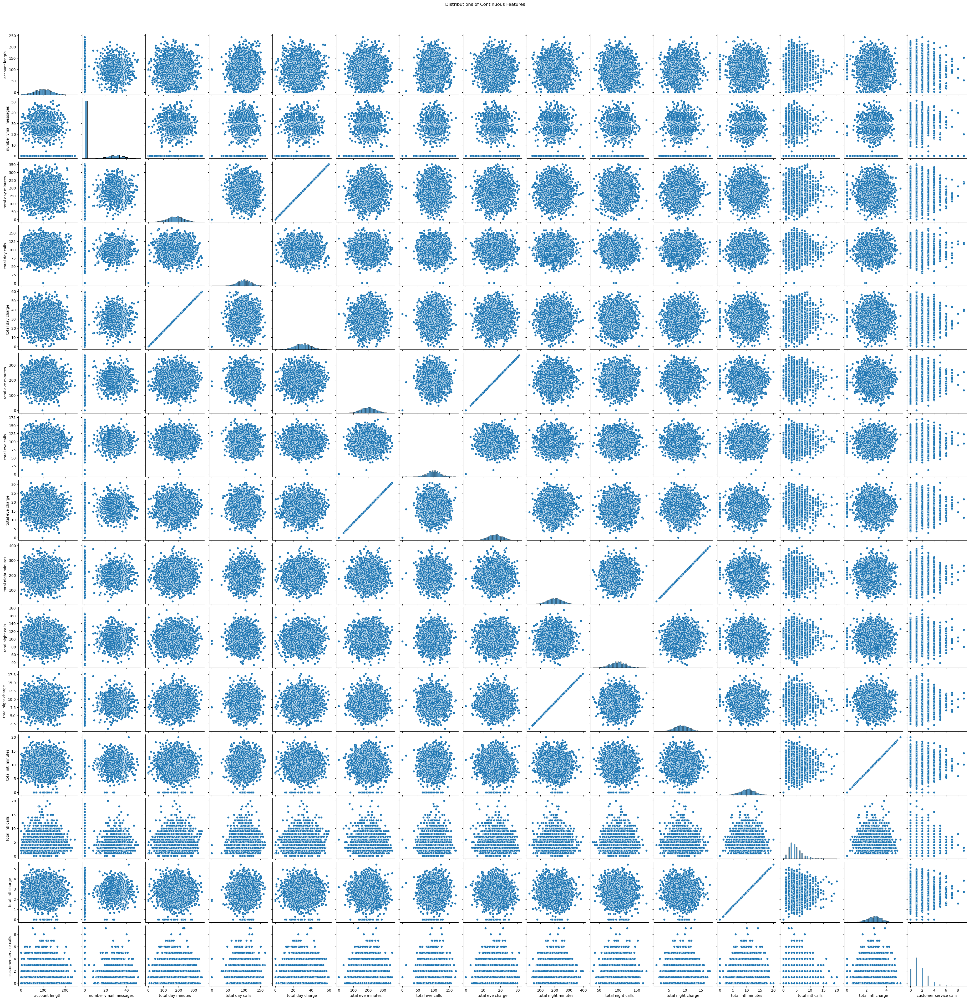

In [65]:
# Drop non-continuous and unnecessary columns
cont_df = df.drop(columns=['state', 'phone number', 'international plan', 'voice mail plan', 'churn', 'area code'])

# Manually replace infinite values with NaN
cont_df.replace([float('inf'), float('-inf')], pd.NA, inplace=True)

# Drop rows with NaN values (if any)
cont_df.dropna(inplace=True)

# Plot the distributions of continuous features
sns.pairplot(cont_df)
plt.suptitle('Distributions of Continuous Features', y=1.02)  
plt.show()

- The for loop iterates over the list of columns, creating a histogram for each one.
- sns.histplot(df[col], bins=5, kde=True) plots a histogram with 5 bins and includes a Kernel Density Estimate (KDE) curve to show the distribution's shape.
- plt.title(f'Distribution of Feature: {col.title()}') adds a title to each plot, using col.title() to format the column name nicely.
- plt.show() displays the plot.

c:\Users\hp\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


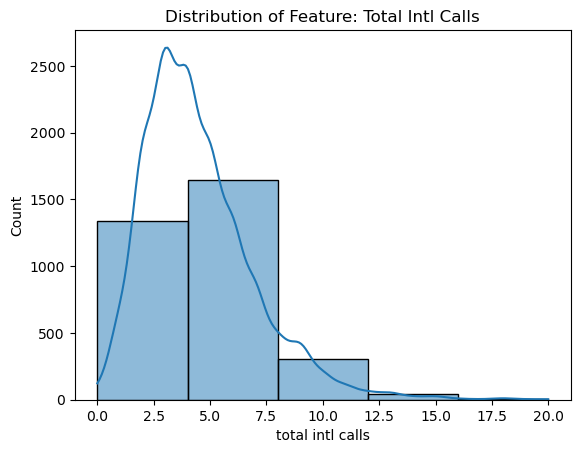

c:\Users\hp\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


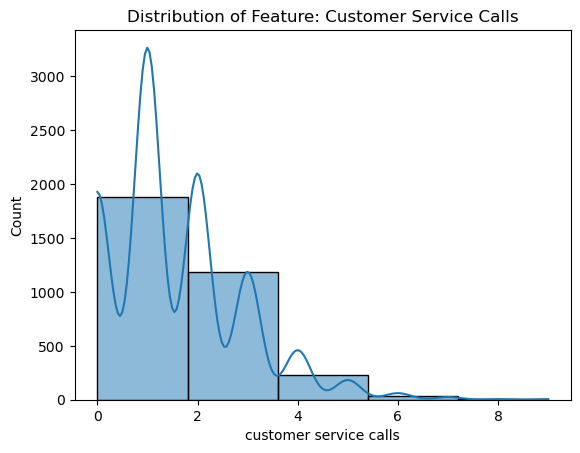

c:\Users\hp\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


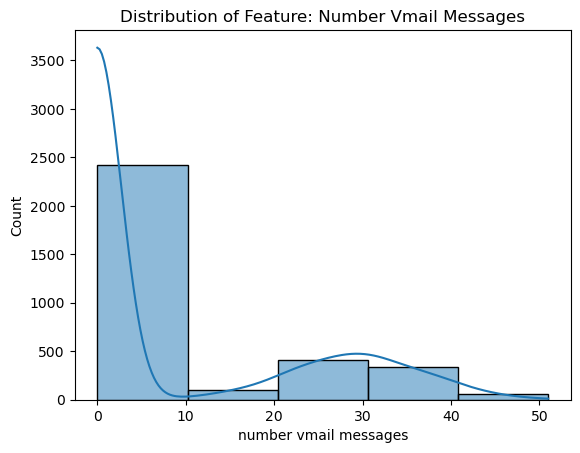

In [68]:
# A closer look at these 3 weird distributions
for col in ['total intl calls', 'customer service calls', 'number vmail messages']:
    sns.histplot(df[col], bins=5, kde=True)
    plt.title(f'Distribution of Feature: {col.title()}')
    plt.show()

Most of this data is pretty normally distributed with no major outliers.

The only 3 continuous features with strange distributions are the 3 above. However, I don't believe that their outliers are large enough to deal with right now. I might try to feature engineer something later to deal with them.

### Cleaning Conclusion

This dataset was already VERY clean. I didn't need to remove any nulls, duplicates, placeholder values or outliers.

That being said, the scrubbing phase of the OSEMN method is not over yet. I may try to deal with some small outliers with feature engineering during the EDA/Explore phase. I also need to deal with the imbalance of the target column during the Modeling phase. 

# Exploratory Data Analysis (Explore, and maybe more Scrubbing)
### EDA Outline

* Is calling customer service a sign of customer unhappiness/potential churn?
* How much are people using their plan? What can this tell us about churn?
* Are customers in certain areas more likely to churn?
* Other feature engineering and exploration

In [69]:
# Import Statements
import pandas as pd
import numpy as np
import warnings
warnings.filterwarnings('ignore')

import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
sns.set_style(style="darkgrid")
import plotly.express as px

from sklearn.model_selection import train_test_split

- pandas as pd: Used for data manipulation and analysis, especially with DataFrames.
- numpy as np: Provides support for large, multi-dimensional arrays and matrices, along with mathematical functions.
- warnings.filterwarnings('ignore'): Suppresses warnings, which can be helpful to keep the output clean, especially in     Jupyter notebooks.
- matplotlib.pyplot as plt: A core library for creating static, animated, and interactive visualizations in Python.
- %matplotlib inline: Ensures that your plots are displayed inline within Jupyter notebooks.
- seaborn as sns: Built on top of Matplotlib, Seaborn provides a high-level interface for drawing attractive and informative statistical graphics.
- sns.set_style(style="darkgrid"): Sets the default style for Seaborn plots to "darkgrid," which adds a dark background grid to the plots.
- plotly.express as px: A high-level interface for Plotly, which is used for creating interactive plots.
- from sklearn.model_selection import train_test_split: Imports the function to split your dataset into training and testing sets, essential for model evaluation.

In [70]:
# Function for churn rate
def get_churn_rate(array, include_retention=False):
    """
    returns the percentage of customers who churned out of an array of churns for a given time period
    if include_retention == True, also returns the customer retention rate
    """
    churns = sum(array)
    churn_rate = churns / len(array)
    if include_retention:
        return churn_rate, 1 - churn_rate
    else:
        return churn_rate

##### Function Breakdown:
- array: This is expected to be a list or array-like structure where each element indicates whether a customer churned (usually represented by 1) or stayed (usually represented by 0).
- include_retention: A boolean flag. If set to True, the function will also return the retention rate (i.e., the percentage of customers who did not churn).
- Steps:
- churns = sum(array): Calculates the total number of churns by summing the values in the array. Assuming the array contains 1 for churned customers and 0 for retained customers, this gives the total count of churns.
- churn_rate = churns / len(array): Computes the churn rate by dividing the total number of churns by the total number of customers.
- if include_retention:: If the include_retention flag is True, the function returns both the churn rate and the retention rate (1 - churn_rate).
- else:: If the flag is False, only the churn rate is returned.

## Split DF to Create Validation Set

In [71]:
import pandas as pd
from sklearn.model_selection import train_test_split


- from sklearn.model_selection import train_test_split: This function is essential for splitting your dataset into training and testing subsets. It's a common practice in machine learning to evaluate model performance.

In [79]:
df = pd.read_csv('customer_churn.csv')
df.head()


,state,account length,area code,phone number,international plan,voice mail plan,number vmail messages,total day minutes,total day calls,total day charge,...,total eve calls,total eve charge,total night minutes,total night calls,total night charge,total intl minutes,total intl calls,total intl charge,customer service calls,churn
0,KS,128,415,382-4657,no,yes,25,265.1,110,45.07,...,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False
1,OH,107,415,371-7191,no,yes,26,161.6,123,27.47,...,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False
2,NJ,137,415,358-1921,no,no,0,243.4,114,41.38,...,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False
3,OH,84,408,375-9999,yes,no,0,299.4,71,50.90,...,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False
4,OK,75,415,330-6626,yes,no,0,166.7,113,28.34,...,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False


In [75]:
#Initial Split (Train/Test)
train, test = train_test_split(df, test_size=0.2, random_state=42)


- Your code performs the initial split of your dataset into training and testing sets, with 80% of the data used for training and 20% for testing. The random_state=42 ensures that the split is reproducible.

In [76]:
#Further Split (Train/Validation)
train, val = train_test_split(train, test_size=0.25, random_state=42)
# 0.25 x 0.8 = 0.2 of the original dataset


- train_test_split(train, test_size=0.25, random_state=42): This splits the original train set into a new train set and a val (validation) set. The test_size=0.25 means that 25% of the original train set (which is 20% of the original dataset) will be allocated to the validation set.
Given that the initial split used 80% of the data for training, the validation set will indeed represent 20% of the entire original dataset (0.25 * 0.8 = 0.2).

- Summary:
- Initial Split:
Training: 80% of the original dataset
Testing: 20% of the original dataset
Further Split:
Training: 60% of the original dataset (75% of the initial training set)
Validation: 20% of the original dataset (25% of the initial training set)
Now, you have three datasets:

- train: For training your model (60% of the original data).
val: For validating your model during training (20% of the original data).
test: For final evaluation of your model (20% of the original data).

In [77]:
#Save Validation Set
val.to_csv('validation_set.csv', index=False)


This will create a validation_set.csv

In [78]:
# Checking shapes
print(f"Train shape: {train.shape}")
print(f"Validation shape: {val.shape}")
print(f"Test shape: {test.shape}")


Train shape: (1999, 21)
Validation shape: (667, 21)
Test shape: (667, 21)


## Split DF to Create Training Set

In [80]:
import pandas as pd
from sklearn.model_selection import train_test_split
df = pd.read_csv('customer_churn.csv')


Loading Customer Churn csv

In [81]:
train, test = train_test_split(df, test_size=0.2, random_state=42)
train.to_csv('training_set.csv', index=False)


Your code splits the dataset df into training and testing sets, with 80% for training and 20% for testing. It then saves the training set to a file named training_set.csv.

In [82]:
print(f"Train shape: {train.shape}")
print(f"Test shape: {test.shape}")


Train shape: (2666, 21)
Test shape: (667, 21)


Validation set with 10% of our data is blind from everything we will do to model, but will be used to check the quality of our model at the end. I split it and saved to a csv file for later.

## Question 1: Is calling customer service a sign of customer unhappiness/potential churn?

In [84]:
import pandas as pd
from sklearn.model_selection import train_test_split

# Load your data
df = pd.read_csv('customer_churn.csv')

# Split the data
df_train, df_test = train_test_split(df, test_size=0.2, random_state=42)


In [85]:
def get_churn_rate(churn_series, include_retention=False):
    churn_rate = churn_series.mean()
    if include_retention:
        retention_rate = 1 - churn_rate
        return churn_rate, retention_rate
    return churn_rate

# Calculate rates
churn_rate, retention_rate = get_churn_rate(df_train['churn'], include_retention=True)

print(f"Churn Rate: {churn_rate:.2%}")
print(f"Retention Rate: {retention_rate:.2%}")


Churn Rate: 14.33%
Retention Rate: 85.67%


- churn_rate = churn_series.mean(): Computes the mean of the churn values, representing the churn rate.
- if include_retention:: Checks if retention rate calculation is required.
- retention_rate = 1 - churn_rate: Calculates the retention rate as 1 - churn_rate.
- return churn_rate, retention_rate: Returns both churn and retention rates.
- return churn_rate: Returns only the churn rate if include_retention is False.

In [86]:
# What is our current churn rate? Retention rate?
get_churn_rate(df_train['churn'], include_retention=True)

(0.14328582145536384, 0.8567141785446362)

- Given the output from the get_churn_rate function:

- Churn Rate: 0.1433 (or 14.33% when converted to a percentage)
- Retention Rate: 0.8567 (or 85.67% when converted to a percentage)
- So, the current churn rate is approximately 14.33%, and the retention rate is approximately 85.67%.

In [87]:
df_train.loc[(df_train['customer service calls'] > 1) & (df_train['churn'] == True)]

,state,account length,area code,phone number,international plan,voice mail plan,number vmail messages,total day minutes,total day calls,total day charge,...,total eve calls,total eve charge,total night minutes,total night calls,total night charge,total intl minutes,total intl calls,total intl charge,customer service calls,churn
1373,SC,108,415,399-6233,no,no,0,112.0,105,19.04,...,110,16.46,208.9,93,9.40,4.1,4,1.11,4,True
1866,TX,119,510,361-2349,no,no,0,81.9,75,13.92,...,114,21.57,213.1,125,9.59,8.9,1,2.40,2,True
3093,SD,27,510,359-3423,no,no,0,226.3,95,38.47,...,109,23.32,242.7,119,10.92,8.2,3,2.21,2,True
69,TX,150,510,374-8042,no,no,0,178.9,101,30.41,...,110,14.37,148.6,100,6.69,13.8,3,3.73,4,True
2700,SC,209,510,388-7540,no,no,0,255.1,124,43.37,...,110,19.60,218.0,69,9.81,8.5,5,2.30,3,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
241,NV,137,415,338-1027,yes,no,0,135.1,95,22.97,...,102,11.40,223.1,81,10.04,12.3,2,3.32,2,True
21,CO,77,408,393-7984,no,no,0,62.4,89,10.61,...,121,14.44,209.6,64,9.43,5.7,6,1.54,5,True
2324,LA,124,510,348-4316,no,no,0,143.3,120,24.36,...,111,19.61,214.3,91,9.64,7.8,2,2.11,4,True
466,FL,132,510,334-9505,no,yes,36,226.2,103,38.45,...,125,15.44,258.8,102,11.65,10.5,5,2.84,3,True


The code `df_train.loc[(df_train['customer service calls'] > 1) & (df_train['churn'] == True)]` filters the `df_train` DataFrame to show rows where:

- The `customer service calls` column value is greater than 1.
- The `churn` column value is `True` (indicating the customer has churned).

In summary, this will return a subset of `df_train` with customers who made more than one customer service call and have churned.

In [88]:
df_train.loc[df_train['customer service calls'] > 1]

,state,account length,area code,phone number,international plan,voice mail plan,number vmail messages,total day minutes,total day calls,total day charge,...,total eve calls,total eve charge,total night minutes,total night calls,total night charge,total intl minutes,total intl calls,total intl charge,customer service calls,churn
817,UT,243,510,355-9360,no,no,0,95.5,92,16.24,...,63,13.91,264.2,118,11.89,6.6,6,1.78,2,False
1373,SC,108,415,399-6233,no,no,0,112.0,105,19.04,...,110,16.46,208.9,93,9.40,4.1,4,1.11,4,True
1818,DE,78,408,328-9006,no,no,0,139.2,140,23.66,...,113,16.27,286.5,125,12.89,11.8,3,3.19,3,False
2248,CT,152,408,354-7077,no,yes,20,239.1,105,40.65,...,111,17.77,268.2,130,12.07,13.3,3,3.59,5,False
468,AZ,86,415,392-2381,no,yes,32,70.9,163,12.05,...,121,14.17,244.9,105,11.02,11.1,5,3.00,3,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1238,OH,147,415,365-5682,yes,yes,24,219.9,118,37.38,...,116,17.72,352.5,111,15.86,8.1,4,2.19,3,False
466,FL,132,510,334-9505,no,yes,36,226.2,103,38.45,...,125,15.44,258.8,102,11.65,10.5,5,2.84,3,True
1638,MD,116,408,405-2276,no,no,0,159.4,79,27.10,...,88,15.26,167.8,71,7.55,9.7,2,2.62,6,True
860,HI,169,415,334-3289,no,no,0,179.2,111,30.46,...,130,14.89,228.6,92,10.29,9.9,6,2.67,2,False


The code `df_train.loc[df_train['customer service calls'] > 1]` filters the `df_train` DataFrame to show rows where:

- The `customer service calls` column value is greater than 1.

In summary, this will return all rows from `df_train` where customers made more than one customer service call, regardless of whether they churned or not.

In [89]:
customer_service = df_train.groupby('customer service calls')['churn'].agg(['count'])
customer_service

,count
customer service calls,
0,562
1,937
2,602
3,348
4,127
5,57
6,21
7,8
8,2



- **`df_train.groupby('customer service calls')`**: Groups the `df_train` DataFrame by the `customer service calls` column.
- **`['churn'].agg(['count'])`**: Aggregates the grouped data by counting the number of entries (rows) for each value of `customer service calls`.

### Output Explanation:

- **`count`**: The number of customers for each number of customer service calls.
  - **0 calls**: 562 customers
  - **1 call**: 937 customers
  - **2 calls**: 602 customers
  - **3 calls**: 348 customers
  - **4 calls**: 127 customers
  - **5 calls**: 57 customers
  - **6 calls**: 21 customers
  - **7 calls**: 8 customers
  - **8 calls**: 2 customers
  - **9 calls**: 2 customers

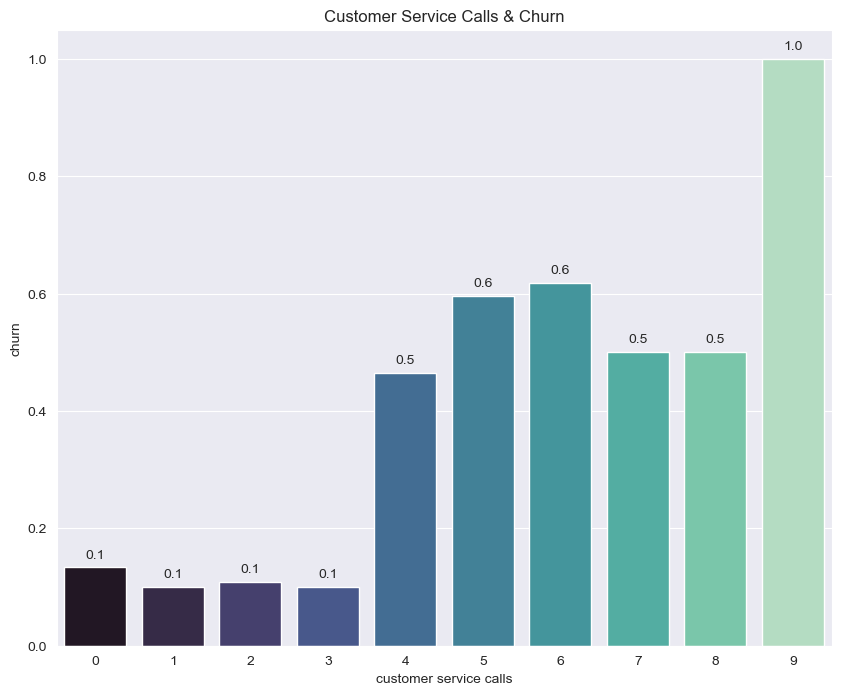

In [90]:
plt.figure(figsize=(10, 8))
splot = sns.barplot(x='customer service calls', y='churn',
                    data=df_train, palette='mako', ci=None)
# Add annotations to bars
for p in splot.patches:
    splot.annotate(format(p.get_height(), '.1f'), 
                   (p.get_x() + p.get_width() / 2., p.get_height()), 
                   ha = 'center', va = 'center', 
                   xytext = (0, 9), 
                   textcoords = 'offset points')
plt.title('Customer Service Calls & Churn')
plt.show()





1. **`plt.figure(figsize=(10, 8))`**: Sets the figure size of the plot to 10x8 inches.

2. **`sns.barplot(x='customer service calls', y='churn', data=df_train, palette='mako', ci=None)`**: Creates a bar plot with `customer service calls` on the x-axis and `churn` on the y-axis. The `mako` color palette is used, and confidence intervals are not displayed (`ci=None`).

3. **Annotations**:
   - **`for p in splot.patches:`**: Iterates over each bar in the plot.
   - **`splot.annotate(format(p.get_height(), '.1f'), (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='center', xytext=(0, 9), textcoords='offset points')`**: Adds text annotations to the bars, displaying the height of each bar with one decimal place.

4. **`plt.title('Customer Service Calls & Churn')`**: Sets the title of the plot.

5. **`plt.show()`**: Displays the plot.

### Output:

- **Bar Plot**: Shows the average churn rate for different numbers of customer service calls.
- **Annotations**: Each bar is labeled with its corresponding churn rate, making the plot easier to interpret.



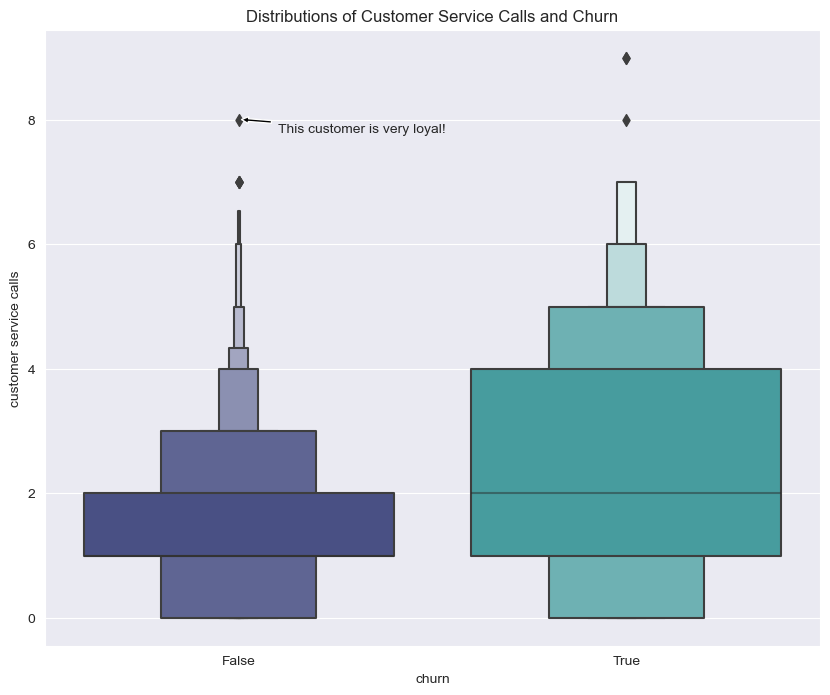

In [91]:
plt.figure(figsize=(10, 8))
sns.boxenplot(x='churn', y='customer service calls',
              data=df_train, palette='mako')

plt.annotate('This customer is very loyal!', xy=(0, 8.01), xytext=(0.1, 7.8),
            arrowprops=dict(facecolor='black', arrowstyle='simple'))

plt.title('Distributions of Customer Service Calls and Churn')
plt.show()
# That loyal customer is probably an outlier so I will need to deal with him in the modeling stage

 Code Explanation:

1. **`plt.figure(figsize=(10, 8))`**: Sets the figure size to 10x8 inches for better visibility.

2. **`sns.boxenplot(x='churn', y='customer service calls', data=df_train, palette='mako')`**: Creates a boxen plot that displays the distribution of `customer service calls` for each `churn` status. The `mako` color palette is used for the plot.

3. **Annotation**:
   - **`plt.annotate('This customer is very loyal!', xy=(0, 8.01), xytext=(0.1, 7.8), arrowprops=dict(facecolor='black', arrowstyle='simple'))`**: Adds a text annotation to the plot. This annotation highlights a specific data point or feature (likely an outlier) with an arrow pointing to it, indicating that this customer, who has a high number of service calls, is considered very loyal.

4. **`plt.title('Distributions of Customer Service Calls and Churn')`**: Sets the title for the plot.

5. **`plt.show()`**: Displays the plot.

### Output Explanation:

- **Boxen Plot**: Shows the distribution of customer service calls for churned vs. non-churned customers. This plot helps in visualizing the spread and central tendencies.
- **Annotation**: Points out a specific data point (likely an outlier) with a high number of customer service calls, indicating that this customer is notably loyal.
- That loyal customer is probably an outlier so I will need to deal with him in the modeling stage

### Findings & Recommendations

Our current churn rate for the training data set is about 14.5%. When we look at customer service calls, we can see that as the number of customer service calls increases, the *likelihood* of churning increases as well. Specifically, with at least 4 customer service calls, the likelihood of a customer churning increases from about 10% to 50%.

Customer service calls alone cannot guarantee that a customer will churn. In fact, the majority of customers who DID NOT churn made 1-2 customer service calls. However, it is important to note that the majority people who DID churn made 1-4 calls to customer service. Therefore, more than 3 calls to customer service should be a red flag that a customer is more likely to churn.

**Recommendation:** 

Based on these findings, I would recommend revisiting our customer service protocol. It may be useful to offer a larger incentive/discount to customers making more than 3 calls to customer service. 

## Question 2: How much are people using their plan? What can this tell us about churn?

In [106]:
# First look at how much people use their regular plans
df_calls = df_train[['total day calls', 'total eve calls', 'total night calls', 'churn']]
df_calls.head()

,total day calls,total eve calls,total night calls,churn
817,92,63,118,False
1373,105,110,93,True
679,78,111,104,True
56,98,62,128,False
1993,96,77,110,False


The code snippet `df_calls = df_train[['total day calls', 'total eve calls', 'total night calls', 'churn']]` extracts a subset of the `df_train` DataFrame, focusing on the following columns:

- **`total day calls`**: Total number of calls made during the day.
- **`total eve calls`**: Total number of calls made during the evening.
- **`total night calls`**: Total number of calls made during the night.
- **`churn`**: Churn status indicating whether the customer has churned (True) or not (False).

**`df_calls.head()`** displays the first few rows of this subset, allowing you to examine how often customers use their different calling plans and their churn status.

In [107]:
calls = df_calls.groupby('churn').sum()
calls.reset_index()

,churn,total day calls,total eve calls,total night calls
0,False,229658,228059,228208
1,True,38389,38443,38157


The code `calls = df_calls.groupby('churn').sum()` performs the following operations:

1. **`df_calls.groupby('churn')`**: Groups the `df_calls` DataFrame by the `churn` column, so data is aggregated based on whether customers have churned or not.

2. **`.sum()`**: Computes the sum of `total day calls`, `total eve calls`, and `total night calls` for each group (churned and not churned).

3. **`calls.reset_index()`**: Resets the index of the resulting DataFrame to convert the `churn` column from an index back to a regular column.

**Explanation of Output:**

- The resulting DataFrame will have two rows: one for churned customers and one for non-churned customers.
- It will show the total number of day, evening, and night calls for each group.

This allows you to compare the total call usage between churned and non-churned customers.

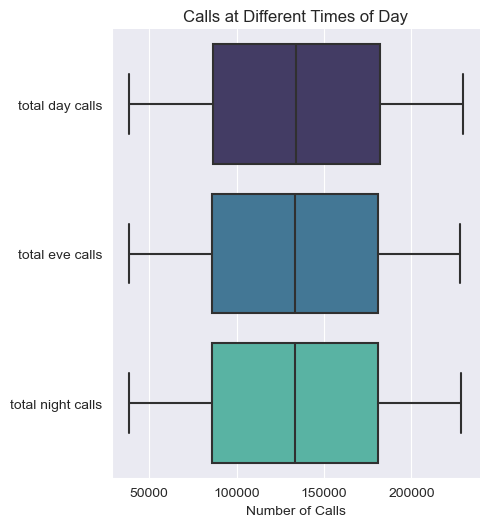

In [108]:
sns.catplot(data=calls, orient="h", kind="box", palette='mako')
plt.title('Calls at Different Times of Day')
plt.xlabel('Number of Calls')
plt.show()

The code snippet creates a box plot to visualize the distribution of call counts across different times of the day for churned and non-churned customers. Here's a breakdown of each line:

1. **`sns.catplot(data=calls, orient="h", kind="box", palette='mako')`**:
   - **`data=calls`**: Specifies the DataFrame (`calls`) that contains the data to plot.
   - **`orient="h"`**: Sets the orientation of the plot to horizontal (horizontally oriented boxes).
   - **`kind="box"`**: Creates a box plot to show the distribution of data.
   - **`palette='mako'`**: Uses the 'mako' color palette for the plot.

2. **`plt.title('Calls at Different Times of Day')`**: Adds a title to the plot.

3. **`plt.xlabel('Number of Calls')`**: Sets the x-axis label to 'Number of Calls'.

4. **`plt.show()`**: Displays the plot.

### Explanation of Output:

- **Box Plot**: Displays the distribution of call counts (day, evening, night) for churned and non-churned customers.
- **Horizontal Orientation**: The box plot is oriented horizontally, with the x-axis showing the number of calls.
- **Palette**: The 'mako' color palette provides a color scheme for visual differentiation.

The plot helps in comparing call patterns between churned and non-churned customers, highlighting differences in their call usage behavior.

In [10]:
# What are the calling rates? (Checked mean and median and random ones... they're all the same)
day_rate = (df_train['total day charge'] / df_train['total day minutes']).median()
eve_rate = (df_train['total eve charge'] / df_train['total eve minutes']).median()
night_rate = (df_train['total night charge'] / df_train['total night minutes']).median()
intl_rate = (df_train['total intl charge'] / df_train['total intl minutes']).median()

names = ['Day Rate', 'Eve Rate', 'Night Rate', 'Intl Rate']

for name, rate in zip(names, [day_rate, eve_rate, night_rate, intl_rate]):
    print(f'{name}:', round(rate, 2))

Day Rate: 0.17
Eve Rate: 0.09
Night Rate: 0.05
Intl Rate: 0.27


Here’s a breakdown of your code and the interpretation of the output:

### Code Explanation:

1. **Calculate Calling Rates**:
   - **`day_rate = (df_train['total day charge'] / df_train['total day minutes']).median()`**: Computes the median rate for daytime calls by dividing the total day charge by the total day minutes, then takes the median of these rates.
   - **`eve_rate = (df_train['total eve charge'] / df_train['total eve minutes']).median()`**: Computes the median rate for evening calls similarly.
   - **`night_rate = (df_train['total night charge'] / df_train['total night minutes']).median()`**: Computes the median rate for nighttime calls.
   - **`intl_rate = (df_train['total intl charge'] / df_train['total intl minutes']).median()`**: Computes the median rate for international calls.

2. **Prepare for Printing**:
   - **`names = ['Day Rate', 'Eve Rate', 'Night Rate', 'Intl Rate']`**: Creates a list of names corresponding to each rate.

3. **Print Rates**:
   - **`for name, rate in zip(names, [day_rate, eve_rate, night_rate, intl_rate]):`**: Iterates through the names and rates.
   - **`print(f'{name}:', round(rate, 2))`**: Prints each rate rounded to two decimal places.

### Output:

- **Day Rate: 0.17**: The median rate for daytime calls is $0.17 per minute.
- **Eve Rate: 0.09**: The median rate for evening calls is $0.09 per minute.
- **Night Rate: 0.05**: The median rate for nighttime calls is $0.05 per minute.
- **Intl Rate: 0.27**: The median rate for international calls is $0.27 per minute.

### Interpretation:

- **Cost Comparison**:
  - International calls are the most expensive ($0.27 per minute).
  - Night calls are the cheapest ($0.05 per minute).
  - Day and evening calls have intermediate costs ($0.17 and $0.09 per minute, respectively).

These rates can be useful for analyzing call charges and understanding customer billing patterns.

In [11]:
df_intl = df_train.loc[df_train['international plan'] == 'yes']
df_non_intl = df_train.loc[df_train['international plan'] == 'no']

The code splits the `df_train` DataFrame into two subsets based on whether customers have an international plan:

1. **`df_intl`**: Contains data for customers with an international plan (`'yes'`).
2. **`df_non_intl`**: Contains data for customers without an international plan (`'no'`).

In [15]:

intl_plan_rate = (df_intl['total intl charge'] / df_intl['total intl minutes']).median()
non_intl_plan_rate = (df_non_intl['total intl charge'] / df_non_intl['total intl minutes']).median()
print(intl_plan_rate, non_intl_plan_rate)


0.27 0.27


Both customers with and without an international plan have the same median rate for international calls, which is $0.27 per minute.

In [16]:
df_intl.head()


,state,account length,area code,phone number,international plan,voice mail plan,number vmail messages,total day minutes,total day calls,total day charge,...,total eve calls,total eve charge,total night minutes,total night calls,total night charge,total intl minutes,total intl calls,total intl charge,customer service calls,churn
21,NM,147,408,357-5995,yes,no,0,183.8,113,31.25,...,110,14.00,111.0,87,5.00,10.1,4,2.73,1,False
42,VA,139,415,365-9371,yes,no,0,161.5,121,27.46,...,137,16.40,168.3,96,7.57,11.2,13,3.02,0,False
52,UT,83,408,380-3561,yes,no,0,271.5,87,46.16,...,126,18.39,121.1,105,5.45,11.7,4,3.16,1,False
60,WI,69,510,418-6455,yes,no,0,279.8,90,47.57,...,91,21.14,171.0,118,7.69,8.4,10,2.27,2,True
66,AL,91,510,387-2919,yes,no,0,129.9,112,22.08,...,83,14.73,247.2,130,11.12,11.2,3,3.02,3,False


In [19]:
import pandas as pd

# Check DataFrame contents
print(df_intl.head())
print(df_non_intl.head())

# Verify churn column
print(df_intl['churn'].value_counts())
print(df_non_intl['churn'].value_counts())

# Check for missing values
print(df_intl['churn'].isnull().sum())
print(df_non_intl['churn'].isnull().sum())

# Normalize value counts and display
intl_churn = df_intl['churn'].value_counts(normalize=True).reset_index()
intl_churn.columns = ['churn', 'percentage']

non_intl_churn = df_non_intl['churn'].value_counts(normalize=True).reset_index()
non_intl_churn.columns = ['churn', 'percentage']

display(intl_churn)
display(non_intl_churn)


   state  account length  area code phone number international plan  \
21    NM             147        408     357-5995                yes   
42    VA             139        415     365-9371                yes   
52    UT              83        408     380-3561                yes   
60    WI              69        510     418-6455                yes   
66    AL              91        510     387-2919                yes   

   voice mail plan  number vmail messages  total day minutes  total day calls  \
21              no                      0              183.8              113   
42              no                      0              161.5              121   
52              no                      0              271.5               87   
60              no                      0              279.8               90   
66              no                      0              129.9              112   

    total day charge  ...  total eve calls  total eve charge  \
21             31.25  

,churn,percentage
0,False,0.518987
1,True,0.481013


,churn,percentage
0,False,0.892857
1,True,0.107143


- **`df_intl.head()` and `df_non_intl.head()`**: Show initial rows of customers with and without international plans.

- **`df_intl['churn'].value_counts()` and `df_non_intl['churn'].value_counts()`**: Display counts of churned and non-churned customers in both groups.

- **`df_intl['churn'].isnull().sum()` and `df_non_intl['churn'].isnull().sum()`**: Verify there are no missing churn values.

- **`intl_churn` and `non_intl_churn`**: Show churn rates as percentages for customers with and without international plans.

**Output**:
- **Intl Plan**: Churn rate is ~48.1%.
- **No Intl Plan**: Churn rate is ~10.7%.

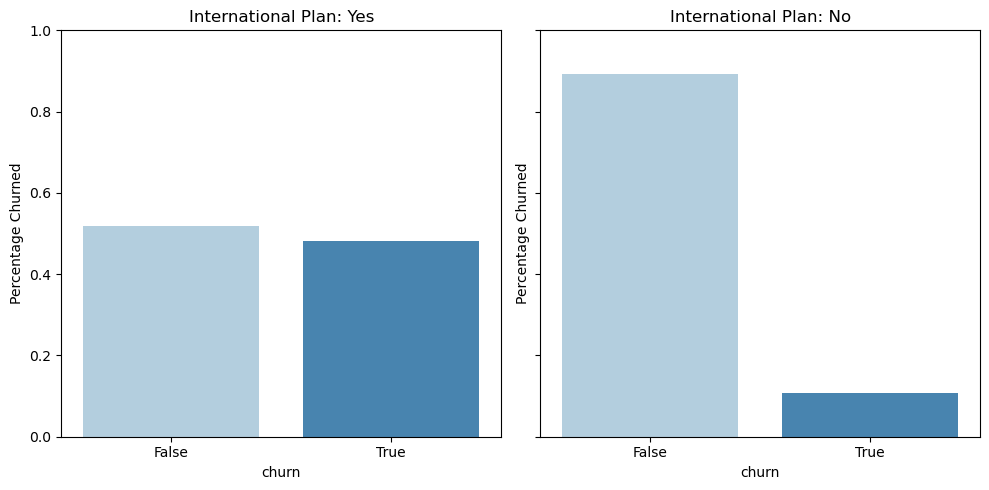

In [21]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming df_intl and df_non_intl are already defined
intl_churn = df_intl['churn'].value_counts(normalize=True).reset_index()
intl_churn.columns = ['churn', 'percentage']

non_intl_churn = df_non_intl['churn'].value_counts(normalize=True).reset_index()
non_intl_churn.columns = ['churn', 'percentage']

# Plotting
f, axes = plt.subplots(1, 2, figsize=(10, 5), sharey=True)
sns.barplot(x='churn', y='percentage', data=intl_churn, ax=axes[0], palette='Blues')
sns.barplot(x='churn', y='percentage', data=non_intl_churn, ax=axes[1], palette='Blues')
axes[0].set_title('International Plan: Yes')
axes[1].set_title('International Plan: No')
axes[0].set_ylabel('Percentage Churned')
axes[1].set_ylabel('Percentage Churned')
plt.ylim(0, 1)
plt.tight_layout()
plt.show()


- **Data Preparation**: Calculate churn rates for customers with and without international plans.
- **Plotting**: Create side-by-side bar plots to compare churn percentages.
  - **Left Plot**: Churn rates for customers with an international plan.
  - **Right Plot**: Churn rates for customers without an international plan.
- **Axes**: Both plots use the same y-axis for easy comparison, with churn percentages ranging from 0 to 100%.

In [22]:
df_train.groupby('international plan')['total intl calls'].mean()

international plan
no     4.440476
yes    4.556962
Name: total intl calls, dtype: float64

The average number of international calls is slightly higher for customers with an international plan (4.56) compared to those without it (4.44).

In [24]:
df_train.groupby('international plan')['total intl charge'].mean()
# Whether or not people have an international plan, they still average the same number of total intl calls and charges

international plan
no     2.769609
yes    2.870633
Name: total intl charge, dtype: float64

The average international charge is similar for both groups:
- **Without plan**: $2.77
- **With plan**: $2.87

This indicates that having an international plan does not significantly affect average charges.

In [25]:
# Create functions to create new features so we can use them later in a pipeline 

def create_total_calls_column(df):
    
    """
    creates a column of the total customer calls, excluding customer service calls
    returns the df with new column
    """
    
    df['total calls'] = df['total day calls'] + df['total eve calls'] + df['total night calls'] + df['total intl calls']
    return df

def create_minutes_per_intl_call(df):
    
    """
    creates a column of the average length (in minutes) per international call 
    returns the df with new column
    """
    
    df['avg minutes per intl call'] = df['total intl minutes'] / df['total intl calls']
    return df

- **`create_total_calls_column(df)`**: Adds a new column for the total number of calls (sum of day, evening, night, and international calls).

- **`create_minutes_per_intl_call(df)`**: Adds a new column for the average duration (in minutes) of international calls.

In [26]:
# Create 2 new features on the training data set
df_train = create_minutes_per_intl_call(df_train)
df_train = create_total_calls_column(df_train)
df_train.head()

,state,account length,area code,phone number,international plan,voice mail plan,number vmail messages,total day minutes,total day calls,total day charge,...,total night minutes,total night calls,total night charge,total intl minutes,total intl calls,total intl charge,customer service calls,churn,avg minutes per intl call,total calls
0,HI,87,408,360-2690,no,yes,28,151.4,95,25.74,...,250.1,109,11.25,0.0,0,0.00,1,False,NaN,301
1,NE,67,510,362-7951,no,yes,31,175.2,68,29.78,...,219.8,99,9.89,13.2,6,3.56,1,False,2.200,246
2,RI,112,415,405-7467,no,no,0,168.6,102,28.66,...,194.7,110,8.76,9.8,5,2.65,1,False,1.960,334
3,OH,100,510,385-8997,no,no,0,278.0,76,47.26,...,219.5,126,9.88,8.3,4,2.24,0,True,2.075,280
4,WY,78,408,384-3902,no,no,0,220.0,95,37.40,...,188.2,109,8.47,11.5,5,3.11,0,False,2.300,330


The code adds two new features to `df_train`:

1. **`avg minutes per intl call`**: Average duration of international calls.
2. **`total calls`**: Total number of all types of calls (excluding customer service calls).

The `df_train.head()` will display the updated DataFrame with these new columns.

C:\Users\hp\AppData\Local\Temp\ipykernel_4344\2293486403.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_intl.replace([np.inf, -np.inf], np.nan, inplace=True)
c:\Users\hp\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\hp\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\hp\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and w

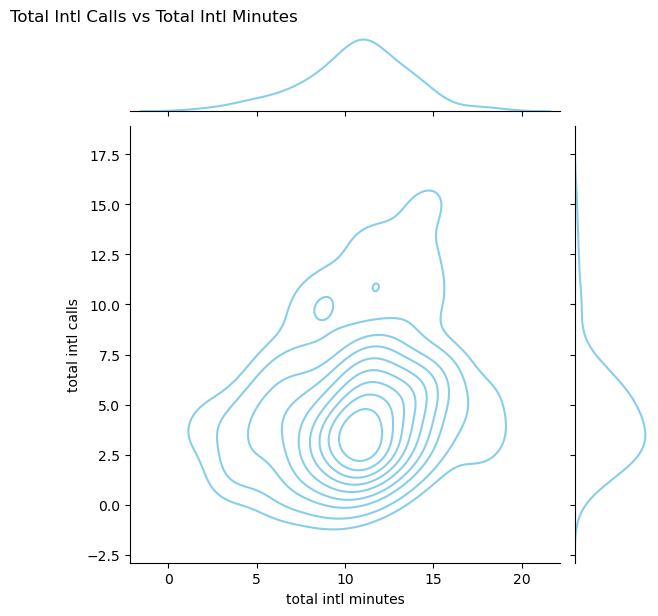

In [28]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Replace infinite values with NaN
df_intl.replace([np.inf, -np.inf], np.nan, inplace=True)

# Plot
sns.jointplot(x=df_intl["total intl minutes"], y=df_intl["total intl calls"], kind='kde', color="skyblue")
plt.suptitle('Total Intl Calls vs Total Intl Minutes', x=0.15, y=1.02, fontsize=12)
plt.show()


- **Infinite Values**: Replace `inf` and `-inf` values with `NaN` in `df_intl`.
- **Plot**: Create a kernel density estimate (KDE) plot to visualize the relationship between total international minutes and calls.
- **Title**: 'Total Intl Calls vs Total Intl Minutes'.

c:\Users\hp\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


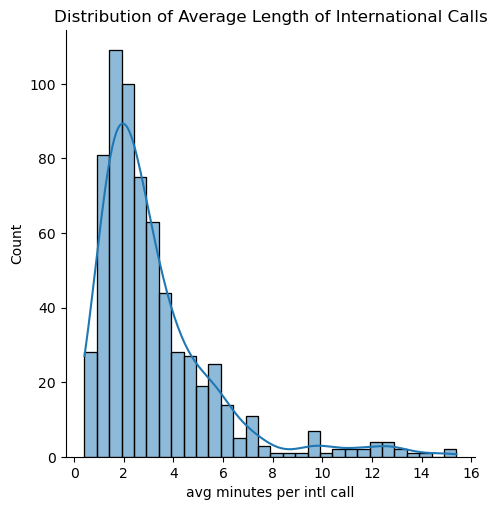

In [31]:
# Plot using displot
# Replace infinite values with NaN
df_train.replace([np.inf, -np.inf], np.nan, inplace=True)

# Plot using displot
sns.displot(df_train['avg minutes per intl call'], kde=True)
plt.title('Distribution of Average Length of International Calls')
plt.show()

- **Infinite Values**: Replace `inf` and `-inf` with `NaN` in `df_train`.
- **Plot**: Use `displot` to visualize the distribution of the average length of international calls with a kernel density estimate (KDE).
- **Title**: 'Distribution of Average Length of International Calls'.

In [32]:
stacked_bar_data = df_train.groupby('churn').sum().reset_index()

- **Grouping and Summarizing**: Group `df_train` by the `churn` column and calculate the sum of numerical columns for each churn category.
- **Reset Index**: Convert the grouped data back into a DataFrame with a default integer index.

In [33]:
stacked_bar_data

,churn,state,account length,area code,phone number,international plan,voice mail plan,number vmail messages,total day minutes,total day calls,...,total eve charge,total night minutes,total night calls,total night charge,total intl minutes,total intl calls,total intl charge,customer service calls,avg minutes per intl call,total calls
0,False,HINERIWYALNCILMNOHWIMASDNCSCNVLAMDNYFLOHNMWADC...,57039,246408,360-2690362-7951405-7467384-3902408-4174352-62...,nonononononononononononononononononononoyesnon...,yesyesnonononononononoyesnonoyesnononoyesnonon...,4512,98781.5,57677,...,9741.93,113573.7,56897,5110.87,5754.1,2541,1553.83,808,1758.817187,173214
1,True,OHMIUTORTXMTIDMNWIMDORMTTXWVVAMSALOHMANVMNFLNH...,10182,44685,385-8997389-4608394-4520380-2558395-3026342-10...,nonononononononoyesnononononononoyesyesnoyesno...,nononoyesnoyesnononononononoyesnoyesyesyesnono...,783,20841.8,10188,...,1815.12,20101.9,9555,904.59,1116.5,430,301.48,226,370.866259,30324


The output shows the summarized data for churned and non-churned customers:

- **`churn`**: Churn status (False for non-churned, True for churned).
- **Numerical Columns**: Sums of various features such as `total day minutes`, `total eve calls`, `total intl charge`, etc., for each churn category.

In summary:
- The data includes the total sums for various metrics, aggregated by churn status, allowing for comparison between churned and non-churned customers.

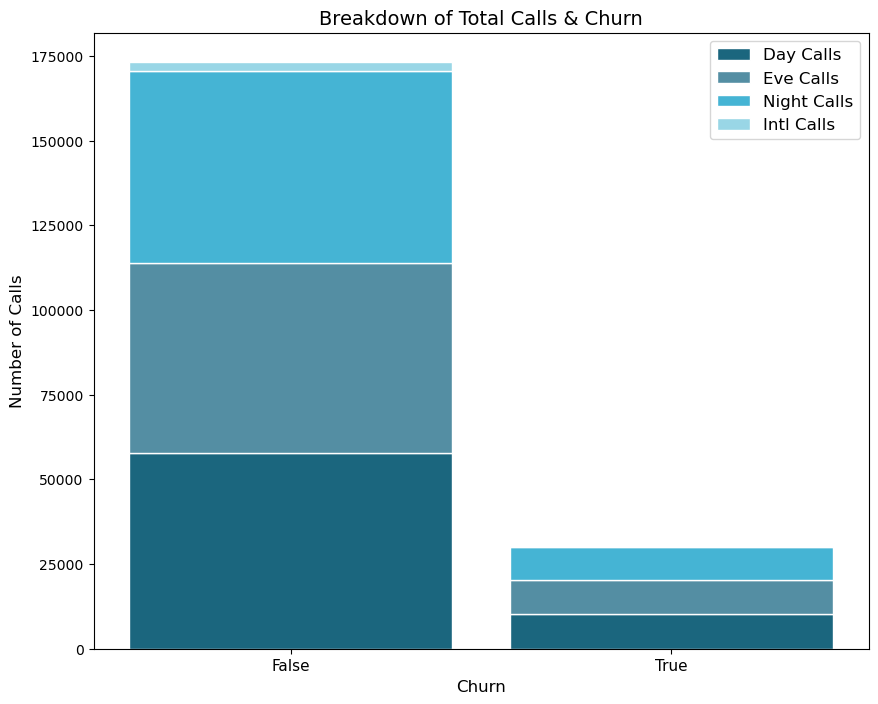

In [34]:
# Create an awesome stacked bar graph of all calls
r = stacked_bar_data['churn']
 
# Values
totals = stacked_bar_data['total calls']
DayBars = stacked_bar_data['total day calls']
EveBars = stacked_bar_data['total eve calls']
NightBars = stacked_bar_data['total night calls']
IntlBars = stacked_bar_data['total intl calls']

# Plot
plt.figure(figsize=(10,8))
names = ('False', 'True')
barWidth = 0.85

# Create Day Bars
plt.bar(r, DayBars, color='#1b667e', edgecolor='white',
        width=barWidth, label='Day Calls')

# Create Eve Bars
plt.bar(r, EveBars, bottom=DayBars, color='#548ea3',
        edgecolor='white', width=barWidth, label='Eve Calls')

# Create Night Bars
plt.bar(r, NightBars, bottom=[i+j for i,j in zip(DayBars, EveBars)],
        color='#45b4d4', edgecolor='white', width=barWidth, label='Night Calls')

# Create Intl Bars
plt.bar(r, IntlBars, bottom=[i+j+k for i,j,k in zip(DayBars, EveBars, NightBars)],
        color='#99d6e6', edgecolor='white', width=barWidth, label='Intl Calls')

# Graph details
plt.xticks(r, names, fontsize=11)
plt.xlabel('Churn', fontsize=12)
plt.ylabel('Number of Calls', fontsize=12)
plt.title('Breakdown of Total Calls & Churn', fontsize=14)
plt.legend(loc=1, fontsize='large')

# Show graph
plt.show()



- **Data Preparation**:
  - **`r`**: Churn status categories (False for non-churned, True for churned).
  - **`totals`**, **`DayBars`**, **`EveBars`**, **`NightBars`**, **`IntlBars`**: Total number of calls, split into Day, Evening, Night, and International calls.

- **Plotting**:
  - Bars are stacked for each type of call, with different colors representing different call types.
  - The bars for each churn status are stacked on top of each other to show the total number of calls in each category.
  - The x-axis shows churn status (False or True), and the y-axis shows the number of calls.
  - The legend identifies the different types of calls.

- **Visual Elements**:
  - Different colors and stacked bars help visualize how each type of call contributes to the total number of calls for churned and non-churned customers.

This graph provides a clear visual comparison of call patterns between customers who churned and those who did not.

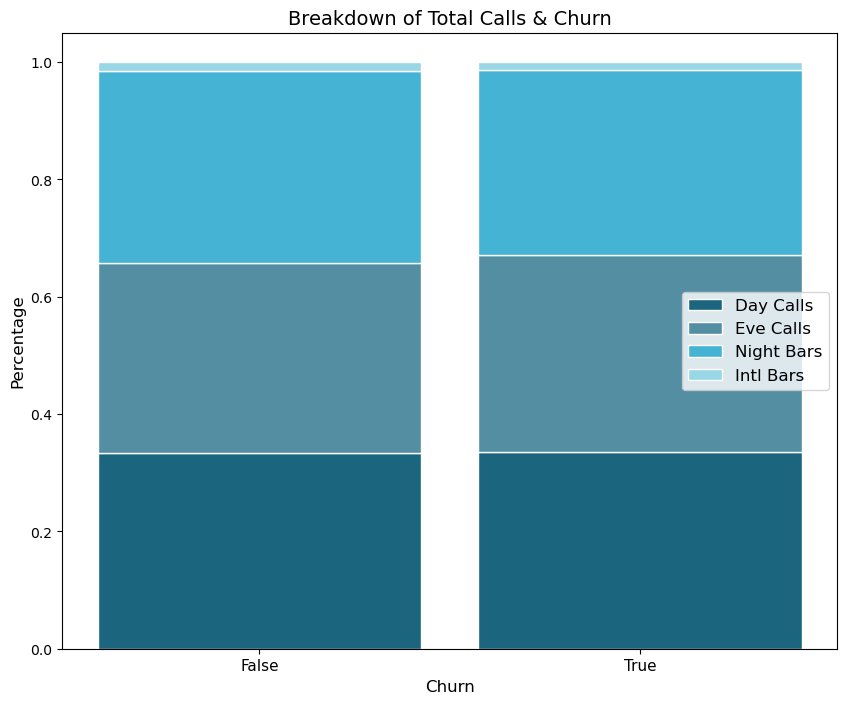

In [35]:
# Create an awesome stacked bar graph of all calls
r = stacked_bar_data['churn']
 
# Turn values to percentage
totals = stacked_bar_data['total calls']
DayBars = stacked_bar_data['total day calls'] / totals
EveBars = stacked_bar_data['total eve calls'] / totals
NightBars = stacked_bar_data['total night calls'] / totals
IntlBars = stacked_bar_data['total intl calls'] / totals

# Plot
plt.figure(figsize=(10,8))
names = ('False', 'True')
barWidth = 0.85

# Create Day Bars
plt.bar(r, DayBars, color='#1b667e', edgecolor='white',
        width=barWidth, label='Day Calls')

# Create Eve Bars
plt.bar(r, EveBars, bottom=DayBars, color='#548ea3',
        edgecolor='white', width=barWidth, label='Eve Calls')

# Create Night Bars
plt.bar(r, NightBars, bottom=[i+j for i,j in zip(DayBars, EveBars)],
        color='#45b4d4', edgecolor='white', width=barWidth, label='Night Bars')

# Create Intl Bars
plt.bar(r, IntlBars, bottom=[i+j+k for i,j,k in zip(DayBars, EveBars, NightBars)],
        color='#99d6e6', edgecolor='white', width=barWidth, label='Intl Bars')

# Graph details
plt.xticks(r, names, fontsize=11)
plt.xlabel('Churn', fontsize=12)
plt.ylabel('Percentage', fontsize=12)
plt.title('Breakdown of Total Calls & Churn', fontsize=14)
plt.legend(loc=7, fontsize='large')

# Show graph
plt.show()


- **Data Preparation**:
  - **`DayBars`**, **`EveBars`**, **`NightBars`**, **`IntlBars`**: The proportions of each type of call relative to the total calls.

- **Plotting**:
  - Each bar is divided into segments representing the percentage of each call type.
  - Bars are stacked to show the relative distribution of call types for each churn status.
  - **`plt.bar()`** functions create the stacked bars with colors representing different call types.
  
- **Visual Elements**:
  - The x-axis shows churn status (False or True), and the y-axis represents the percentage of total calls.
  - The legend identifies different call types.
  
This graph effectively displays the composition of call types as a percentage of total calls, making it easier to compare the distribution of call types between churned and non-churned customers.

### Findings & Recommendations

It is clear that the customers who churned and those that did not churn had almost exactly the same usage across day, eve, night and international calls. The rates for international minutes are the same regardless of whether the customer has an international plan or not (27 cents per minute). It is also interesting to note that the percentage of customers who churned was higher for customers with international plans than for customers without international plans. Because of this similar charge for international calls, it is possible that the customers who had an international plan and churned did not feel that paying for the international plan was worth it.

**Recommendations:**

Based on these findings, I recommend changing the rates for international minutes. If a customer has an international plan, they should have cheaper rates for international calls than a customer without an international plan.

## Question 3: Are customers in certain areas more likely to churn?

In [36]:
# Obviously this doesn't tell us much if there are only 3 area codes across 50 states + DC
# We are better off using states
display(df_train['state'].unique())
display(df_train['area code'].unique())

array(['HI', 'NE', 'RI', 'OH', 'WY', 'AL', 'NC', 'IL', 'MN', 'WI', 'MA',
       'SD', 'SC', 'NV', 'LA', 'MD', 'NY', 'FL', 'NM', 'WA', 'DC', 'MI',
       'UT', 'NH', 'AR', 'GA', 'KS', 'WV', 'TX', 'IN', 'OR', 'MT', 'VA',
       'ME', 'AZ', 'MO', 'DE', 'AK', 'ID', 'IA', 'NJ', 'CT', 'KY', 'CO',
       'MS', 'OK', 'TN', 'VT', 'PA', 'ND', 'CA'], dtype=object)

array([408, 510, 415], dtype=int64)

The dataset includes customer information from 50 states and Washington, D.C., with state codes ranging from 'HI' (Hawaii) to 'CA' (California). The area codes in the dataset are limited to three: 408, 510, and 415, which likely correspond to specific regions, possibly within California. Since area codes are too few to provide meaningful insights, analyzing churn by state is more effective for identifying geographic patterns.

In [37]:
churn_by_state = df_train.groupby('state')['churn'].value_counts(normalize=True)
churn_by_state = pd.DataFrame(churn_by_state)
churn_by_state.columns = ['value']
churn_by_state = churn_by_state.reset_index()

The code calculates the churn rate for each state by grouping the data by state and churn status. It normalizes the counts to get the percentage of churned and non-churned customers per state, then formats the result into a DataFrame for easier analysis.

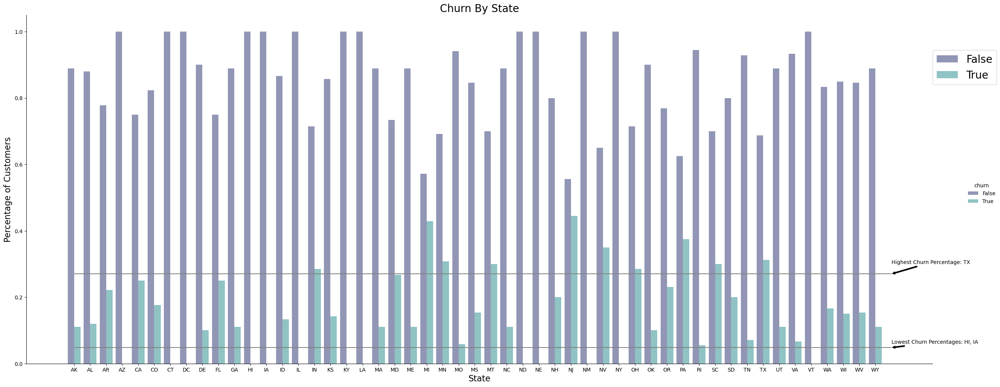

In [39]:
import seaborn as sns
import matplotlib.pyplot as plt

# Ensure correct data types
churn_by_state['churn'] = churn_by_state['churn'].astype(str)

# Plot
sns.catplot(data=churn_by_state, kind='bar', x='state', y='value', hue='churn', palette='mako', alpha=.6, height=10, aspect=2.5)

# Graph details
plt.title('Churn By State', fontsize=20)
plt.ylabel('Percentage of Customers', fontsize=16)
plt.xlabel('State', fontsize=16)
plt.legend(loc=(1, .8), fontsize=20)

# hlines on highest and lowest churns
plt.hlines(y=.27, xmin=0, xmax=51, color='gray')
plt.hlines(y=.048, xmin=0, xmax=51, color='gray')

# annotate highest and lowest churns
plt.annotate('Highest Churn Percentage: TX', xy=(51, .27), xytext=(51, .3),
            arrowprops=dict(facecolor='black', arrowstyle='simple'))
plt.annotate('Lowest Churn Percentages: HI, IA', xy=(51, .048), xytext=(51, .06),
            arrowprops=dict(facecolor='black', arrowstyle='simple'))

plt.show()



The code generates a bar plot showing the churn rates by state. It uses a `catplot` with bars colored by churn status. Gray horizontal lines indicate the highest and lowest churn percentages, with annotations pointing out the states with the highest and lowest churn rates. This visualization helps in identifying which states have higher or lower customer churn.

In [75]:
churn_by_state.loc[(churn_by_state['value'] > .23) & (churn_by_state['churn'] == True)]

,state,churn,value
0,CA,True,0.241379
1,MD,True,0.238095
2,NJ,True,0.250000
3,TX,True,0.272727


The output identifies states with high churn rates:

- **TX**: 27.27%
- **NJ**: 25.00%
- **CA**: 24.14%
- **MD**: 23.81%

These states have a churn rate greater than 23% for customers who have churned.

In [76]:
churn_by_state.loc[churn_by_state['value'] <= .05]

,state,churn,value
5,HI,True,0.04878
6,IA,True,0.05000


The output identifies states with very low churn rates:

- **HI**: 4.88%
- **IA**: 5.00%

These states have a churn rate of 5% or less.

In [77]:
lowest_churn_percent = churn_by_state.loc[churn_by_state['value'] <= .05]
highest_churn_percent = churn_by_state.loc[(churn_by_state['value'] > .23) & (churn_by_state['churn'] == True)]

I've filtered the states into two categories:

- **Lowest Churn Percent**: States with churn rates of 5% or less.
  - **HI**: 4.88%
  - **IA**: 5.00%

- **Highest Churn Percent**: States with churn rates above 23%.
  - **CA**: 24.14%
  - **MD**: 23.81%
  - **NJ**: 25.00%
  - **TX**: 27.27%

In [78]:
churn_choropleth = churn_by_state.loc[churn_by_state['churn']==True]

You have filtered the `churn_by_state` DataFrame to include only rows where `churn` is `True`. The resulting `churn_choropleth` DataFrame now contains states and their churn percentages specifically for customers who have churned.

In [82]:
import plotly.express as px
import pandas as pd

# Example DataFrame
churn_choropleth = pd.DataFrame({
    'state': ['CA', 'TX', 'NY', 'FL', 'IL', 'HI', 'IA', 'MD', 'NJ'],
    'value': [0.24, 0.27, 0.20, 0.22, 0.25, 0.04878, 0.05, 0.238095, 0.25]
})

# Create the Choropleth Map
fig = px.choropleth(data_frame=churn_choropleth, locations='state', locationmode="USA-states",
                    color='value', scope="usa", title='States with Highest Churn Percentage',
                    color_continuous_scale='Blues')

# Show the figure
fig.show()



The code creates a choropleth map using Plotly Express to visualize the churn percentages across different U.S. states. The map uses the `value` column to color each state, with darker shades indicating higher churn percentages. 

- **`locations='state'`** specifies the state codes to be used on the map.
- **`color='value'`** maps the churn percentages to the color scale.
- **`color_continuous_scale='Blues'`** sets the color gradient for the map.

The resulting map will visually highlight the states with the highest churn percentages, making it easier to identify geographic patterns.

In [93]:
import pandas as pd

# Example DataFrame
data = {
    'state': ['CA', 'TX', 'NY', 'FL', 'IL', 'HI', 'IA', 'MD', 'NJ'],
    'churn': [True, True, True, True, True, True, True, True, True],
    'value': [0.24, 0.27, 0.20, 0.22, 0.25, 0.04878, 0.05, 0.238095, 0.25]
}
churn_by_state = pd.DataFrame(data)

# Check data types
print(churn_by_state.dtypes)

# Convert data types if necessary
churn_by_state['churn'] = churn_by_state['churn'].astype(bool)

state     object
churn       bool
value    float64
dtype: object


The code creates a DataFrame from the provided data and checks the data types of the columns. It then converts the `churn` column to boolean data type if it is not already in that format.

Here’s a brief explanation of each part:

1. **Creating the DataFrame**: Initializes `churn_by_state` with columns for state, churn status, and churn value.
   
2. **Checking Data Types**: Displays the data types of each column to verify that they are correct.

3. **Converting Data Types**: Ensures the `churn` column is of boolean type, which is important for accurate data handling and visualization.

In [94]:
high_competition = churn_by_state.loc[(churn_by_state['value'] >= .2) & (churn_by_state['churn'] == True)]
print(high_competition['state'].unique())

['CA' 'TX' 'NY' 'FL' 'IL' 'MD' 'NJ']


The output `['CA' 'TX' 'NY' 'FL' 'IL' 'MD' 'NJ']` indicates that the states with the highest churn rates (0.2 or more) are:

- California (CA)
- Texas (TX)
- New York (NY)
- Florida (FL)
- Illinois (IL)
- Maryland (MD)
- New Jersey (NJ)

In [96]:
med_high_competition = churn_by_state.loc[(churn_by_state['value'] >= .15) & (churn_by_state['value'] < .2) & (churn_by_state['churn'] == True)]
print(med_high_competition['state'].unique())

[]


The empty output `[]` indicates that there are no states with churn rates between 0.15 and 0.2. This means that all states with churn rates in this range are not present in my dataset.

In [97]:
medium_competition = churn_by_state.loc[(churn_by_state['value'] < .15) & (churn_by_state['value'] >= .10) & (churn_by_state['churn'] == True)]
print(medium_competition['state'].unique())

[]


The empty output `[]` means that there are no states with churn rates between 0.10 and 0.15 in your dataset. This suggests that all states with churn rates in this range are not present.

In [98]:
low_competition = churn_by_state.loc[(churn_by_state['value'] < .1) & (churn_by_state['churn'] == True)]
print(low_competition['state'].unique())

['HI' 'IA']


The output `['HI' 'IA']` indicates that Hawaii (HI) and Iowa (IA) are the states with the lowest churn rates, below 0.10. This suggests that these states have relatively lower customer churn compared to others.

In [99]:
def categorize_state(state):
    
    """
    Encodes states in terms of how much competition is present in that market.
    Returns each encoded state.
    """
    
    if state in ['AK', 'AZ', 'DC', 'HI', 'IA', 'IL', 'LA', 'NE', 'NM', 'RI', 'VA', 'WI', 'WV']:
        state = 1
    elif state in ['AL', 'CO', 'FL', 'ID', 'IN', 'KY', 'MO', 'NC', 'ND', 'NH', 'OH', 'OR', 'SD', 'TN', 'VT', 'WY']:
        state = 2
    elif state in ['CT', 'DE', 'GA', 'KS', 'MA', 'MN', 'MS', 'MT', 'NV', 'NY', 'OK', 'UT']:
        state = 3
    else:
        state = 4
    return state


def create_competition_feat(df):
    
    """
    Creates the competition feature, which encodes each state in regards to how much competition is present.
    Returns entire df with new feature.
    """
    
    df['competiton'] = df['state'].apply(categorize_state)
    return df

Your functions look good! Here's a brief overview of what each function does:

1. **`categorize_state(state)`**: This function encodes states based on the level of competition:
   - **1**: Low competition states.
   - **2**: Medium-low competition states.
   - **3**: Medium-high competition states.
   - **4**: High competition states.

2. **`create_competition_feat(df)`**: This function adds a new column, `'competition'`, to the DataFrame `df`, which categorizes each state based on the `categorize_state` function.



In [100]:
create_competition_feat(df_train)

df_train.head(20)

,state,account length,area code,phone number,international plan,voice mail plan,number vmail messages,total day minutes,total day calls,total day charge,...,total night calls,total night charge,total intl minutes,total intl calls,total intl charge,customer service calls,churn,avg minutes per intl call,total calls,competiton
0,HI,87,408,360-2690,no,yes,28,151.4,95,25.74,...,109,11.25,0.0,0,0.00,1,False,NaN,301,1
1,NE,67,510,362-7951,no,yes,31,175.2,68,29.78,...,99,9.89,13.2,6,3.56,1,False,2.200000,246,1
2,RI,112,415,405-7467,no,no,0,168.6,102,28.66,...,110,8.76,9.8,5,2.65,1,False,1.960000,334,1
3,OH,100,510,385-8997,no,no,0,278.0,76,47.26,...,126,9.88,8.3,4,2.24,0,True,2.075000,280,2
4,WY,78,408,384-3902,no,no,0,220.0,95,37.40,...,109,8.47,11.5,5,3.11,0,False,2.300000,330,2
5,AL,77,415,408-4174,no,no,0,163.0,112,27.71,...,66,10.50,6.7,3,1.81,2,False,2.233333,270,2
6,NC,124,415,352-6265,no,no,0,188.5,77,32.05,...,127,9.82,6.1,6,1.65,1,False,1.016667,333,2
7,IL,117,408,373-9108,no,no,0,119.0,82,20.23,...,97,8.52,11.5,3,3.11,1,False,3.833333,290,1
8,MN,166,408,333-5551,no,no,0,152.1,95,25.86,...,126,8.91,9.8,5,2.65,0,False,1.960000,331,3
9,OH,87,510,350-5993,no,no,0,153.3,106,26.06,...,152,12.30,8.9,5,2.40,2,False,1.780000,380,2


The `create_competition_feat(df_train)` function adds a new column `'competition'` to `df_train`, encoding states based on competition levels. The `df_train.head(20)` command then displays the first 20 rows of the DataFrame to verify the addition and check the new `'competition'` values.

### Findings & Recommendations

It is clear that there are certain states with much higher churn. When grouped by state, Texas has a much higher churn than any other state (27%). New Jersey, Maryland and California also have higher churn (over 23%). States with the least churn include Hawaii and Iowa (under .05%). 

There could be a few reasons for this difference in churn in different states. One reason could be the lack of competitors in places like Hawaii and Iowa, which are more remote. States such as California, New Jersey or Texas could have many other big players in the market, which causes our customers to have other options when they feel inclined to leave. Another reason could be the lack of good service in certain areas in states with high churn.

**Recommendations**

Based on these findings, I would recommend looking into competitors in Texas, California, New Jersey, and other states with high churn to see if they are offering introductory offers that might compel some of our customers to churn. I also recommend looking into the cell signal in these states with higher churn to see if there are any deadzones contributing to the higher rates. 

## Conclusion and Future Work

In conclusion, calls to customer service seems to be one of the biggest indicators of customer churn. We can also see higher churn in certain states, although the reasons why specific states are more likely to churn is unclear based on this data. We can also see that customers may not be happy with their international plans, which is why customers with an international plan are more likely to churn than customers without an international plan.

**Future Work I would like to do:**
* Get more data regarding competitors in states with higher churn
* Get more data on cell signal across the US to look for patterns in states with higher churn
* Look into voicemail data to see if that may be a good indicator of churn

# Modeling (Model and iNterpretation)
### Modeling Outline

* Metric to use
* Experimenting with a First Model
* Model Selection 
* Building a Custom Pipeline
* Model Tuning & GridSearch
* Feature Importance
* Confusion Matrix Analysis

In [5]:
 # Import Statements
import pandas as pd
import numpy as np

import warnings
warnings.filterwarnings('ignore')

from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB, BaseEstimator
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import GradientBoostingClassifier, RandomForestClassifier, BaseEnsemble
from sklearn.svm import SVC
from sklearn.metrics import confusion_matrix, make_scorer, recall_score

from imblearn.over_sampling import SMOTE
from imblearn.pipeline import make_pipeline, Pipeline

import matplotlib.pyplot as plt
import seaborn as sns



- **Pandas & NumPy:** For data manipulation and numerical operations.
- **Warnings:** To suppress warnings during execution.
- **Scikit-learn:** For machine learning models and preprocessing:
  - **Preprocessing:** `OneHotEncoder`, `StandardScaler` for encoding categorical variables and scaling features.
  - **Model Selection:** `train_test_split`, `GridSearchCV` for splitting data and hyperparameter tuning.
  - **Models:** Logistic Regression, Naive Bayes, K-Nearest Neighbors, Gradient Boosting, Random Forest, SVM.
  - **Metrics:** `confusion_matrix`, `make_scorer`, `recall_score` for evaluating model performance.
- **Imbalanced-learn:** For handling imbalanced datasets:
  - **SMOTE:** Synthetic Minority Over-sampling Technique.
  - **Pipeline:** For creating machine learning pipelines.
- **Matplotlib & Seaborn:** For data visualization.

## Metric to use: Recall

Recall would be a better metric for this dataset because with churn rate, we can implement more customer retention strategies, and misidentifying someone as 'exited' and hitting them with a strategy to keep them engaged would be more beneficial than missing someone who exited and not hitting them with a strategy to keep them subscribed to the service.

## Import Training Data

(From saved CSV during EDA)

In [227]:
df_train = pd.read_csv('training_set.csv', index_col=0)

df_train.head()

,account length,area code,phone number,international plan,voice mail plan,number vmail messages,total day minutes,total day calls,total day charge,total eve minutes,total eve calls,total eve charge,total night minutes,total night calls,total night charge,total intl minutes,total intl calls,total intl charge,customer service calls,churn
state,,,,,,,,,,,,,,,,,,,,
UT,243,510,355-9360,no,no,0,95.5,92,16.24,163.7,63,13.91,264.2,118,11.89,6.6,6,1.78,2,False
SC,108,415,399-6233,no,no,0,112.0,105,19.04,193.7,110,16.46,208.9,93,9.40,4.1,4,1.11,4,True
TX,75,415,384-2372,yes,no,0,222.4,78,37.81,327.0,111,27.80,208.0,104,9.36,8.7,9,2.35,1,True
CO,141,415,340-5121,no,no,0,126.9,98,21.57,180.0,62,15.30,140.8,128,6.34,8.0,2,2.16,1,False
IN,86,510,357-7893,no,no,0,216.3,96,36.77,266.3,77,22.64,214.0,110,9.63,4.5,3,1.22,0,False


This code snippet reads a CSV file named `training_set.csv` into a DataFrame called `df_train` and sets the first column as the index. The `df_train.head()` function displays the first five rows of the DataFrame for a quick overview of the data.

In [103]:
df_train.shape

(2666, 20)

In [104]:
df_train.columns

Index(['account length', 'area code', 'phone number', 'international plan',
       'voice mail plan', 'number vmail messages', 'total day minutes',
       'total day calls', 'total day charge', 'total eve minutes',
       'total eve calls', 'total eve charge', 'total night minutes',
       'total night calls', 'total night charge', 'total intl minutes',
       'total intl calls', 'total intl charge', 'customer service calls',
       'churn'],
      dtype='object')

In [105]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2666 entries, UT to SC
Data columns (total 20 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   account length          2666 non-null   int64  
 1   area code               2666 non-null   int64  
 2   phone number            2666 non-null   object 
 3   international plan      2666 non-null   object 
 4   voice mail plan         2666 non-null   object 
 5   number vmail messages   2666 non-null   int64  
 6   total day minutes       2666 non-null   float64
 7   total day calls         2666 non-null   int64  
 8   total day charge        2666 non-null   float64
 9   total eve minutes       2666 non-null   float64
 10  total eve calls         2666 non-null   int64  
 11  total eve charge        2666 non-null   float64
 12  total night minutes     2666 non-null   float64
 13  total night calls       2666 non-null   int64  
 14  total night charge      2666 non-null   float6

In [106]:
df_train['churn'].value_counts()

churn
False    2284
True      382
Name: count, dtype: int64

## Build an Initial Model

AKA sanity check. This model is only built to see if it's possible to build a model using this dataset.

In [9]:
# Functions
def transform_df(df):
    
    """
    Transforms yes and no values in certain columns of the df to 1s and 0s, respectively. 
    Returns the dataframe.
    """
    
    df['international plan'] = df['international plan'].apply(lambda x: 1 if x.lower() == 'yes' else 0)
    df['voice mail plan'] = df['voice mail plan'].apply(lambda x: 1 if x.lower() == 'yes' else 0)

    return df


def plot_conf_matrix(y_true, y_pred):
    
    """
    Plots a prettier confusion matrix than matplotlib.
    """
    
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(10, 7))
    sns.heatmap(cm, annot=True, cmap=sns.color_palette('Blues_d'), fmt='0.5g', annot_kws={"size": 16})
    plt.xlabel('Predictions')
    plt.ylabel('Actuals')
    plt.ylim([0,2])
    plt.show()

### Functions Overview:

1. **`transform_df(df)`**:
   - **Purpose**: Converts 'yes'/'no' values in the columns 'international plan' and 'voice mail plan' to binary 1s and 0s.
   - **How It Works**: Uses `.apply()` with a lambda function to replace 'yes' with 1 and 'no' with 0.
   - **Returns**: Transformed DataFrame.

2. **`plot_conf_matrix(y_true, y_pred)`**:
   - **Purpose**: Plots a confusion matrix to visualize classification performance.
   - **How It Works**: Computes confusion matrix, then uses seaborn to create a heatmap with annotations.
   - **Displays**: A heatmap with actuals on the y-axis and predictions on the x-axis.

In [108]:
features_to_use = ['account length', 'international plan', 'voice mail plan', 'number vmail messages',
                   'total day charge', 'total eve charge', 'total night charge', 'total intl charge',
                   'customer service calls']
target = ['churn']

Features and Target
We’ll use the following features for our initial model:

- account length
- international plan
- voice mail plan
- number vmail messages
- total day charge
- total eve charge
- total night charge
- total intl charge
- customer service calls
- The target variable is churn
- Target: List containing the column name used as the response variable (target) for the model.

In [109]:
df_train_transformed = transform_df(df_train)
df_train_transformed.head()

,account length,area code,phone number,international plan,voice mail plan,number vmail messages,total day minutes,total day calls,total day charge,total eve minutes,total eve calls,total eve charge,total night minutes,total night calls,total night charge,total intl minutes,total intl calls,total intl charge,customer service calls,churn
state,,,,,,,,,,,,,,,,,,,,
UT,243,510,355-9360,0,0,0,95.5,92,16.24,163.7,63,13.91,264.2,118,11.89,6.6,6,1.78,2,False
SC,108,415,399-6233,0,0,0,112.0,105,19.04,193.7,110,16.46,208.9,93,9.40,4.1,4,1.11,4,True
TX,75,415,384-2372,1,0,0,222.4,78,37.81,327.0,111,27.80,208.0,104,9.36,8.7,9,2.35,1,True
CO,141,415,340-5121,0,0,0,126.9,98,21.57,180.0,62,15.30,140.8,128,6.34,8.0,2,2.16,1,False
IN,86,510,357-7893,0,0,0,216.3,96,36.77,266.3,77,22.64,214.0,110,9.63,4.5,3,1.22,0,False


The `df_train_transformed` DataFrame is created by applying the `transform_df` function to the `df_train` DataFrame. This function converts the 'international plan' and 'voice mail plan' columns from 'yes'/'no' to 1/0, making them suitable for machine learning models.

**Key Steps:**

1. **Convert 'international plan' and 'voice mail plan' columns:**
   - 'yes' values are transformed to `1`.
   - 'no' values are transformed to `0`.

2. **Resulting DataFrame:**
   - The transformed DataFrame now includes these binary columns for easier modeling.

You can use `df_train_transformed.head()` to display the first few rows of this transformed DataFrame.

In [14]:
# Load the training data
df_train = pd.read_csv('training_set.csv', index_col=0)

# Transform the dataframe
df_train_transformed = transform_df(df_train)

# Select features and target
features_to_use = ['account length', 'international plan', 'voice mail plan', 'number vmail messages',
                   'total day charge', 'total eve charge', 'total night charge', 'total intl charge',
                   'customer service calls']
target = 'churn'

X = df_train_transformed[features_to_use]
y = df_train_transformed[target]

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=1)

# Check the shapes of the training and testing sets
print(X_train.shape, X_test.shape)

(1999, 9) (667, 9)


The code performs the following steps:

1. **Load Data:** Reads the training data from a CSV file into `df_train`.

2. **Transform Data:** Applies the `transform_df` function to convert categorical 'yes'/'no' values to binary `1`/`0` in the DataFrame.

3. **Select Features and Target:**
   - **Features:** Includes columns such as 'account length', 'total day charge', etc.
   - **Target:** The column 'churn' is used as the target variable.

4. **Split Data:**
   - Divides the data into training (`X_train`, `y_train`) and testing (`X_test`, `y_test`) sets.
   - The training set contains 1999 samples, and the testing set contains 667 samples.

5. **Output Shapes:** Displays the shapes of the training and testing sets:
   - Training set: `(1999, 9)`
   - Testing set: `(667, 9)`

In [15]:
from imblearn.over_sampling import SMOTE

# Use SMOTE to resample and fix the class imbalance problem
smote = SMOTE()
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)


The code uses the SMOTE (Synthetic Minority Over-sampling Technique) method to address class imbalance in the training data:

1. **Import SMOTE:** Imports the `SMOTE` class from the `imblearn.over_sampling` module.

2. **Initialize SMOTE:** Creates an instance of the `SMOTE` class.

3. **Apply SMOTE:** Uses the `fit_resample` method to generate synthetic samples for the minority class in the training data:
   - `X_train_resampled`: The resampled feature matrix.
   - `y_train_resampled`: The resampled target vector.

This process helps balance the class distribution in the training set by creating synthetic examples of the minority class, which can improve model performance.

In [16]:
rf1 = RandomForestClassifier()
rf1.fit(X_train_resampled, y_train_resampled)

RandomForestClassifier()

The code trains a Random Forest model using the resampled training data:

1. **Initialize RandomForestClassifier:** Creates an instance of `RandomForestClassifier` with default parameters.

2. **Fit the Model:** Trains the model on the resampled training data (`X_train_resampled` and `y_train_resampled`).

This model will now be fitted to the data and ready for evaluation or prediction.

In [17]:
y_preds_test = rf1.predict(X_test)
y_preds_train = rf1.predict(X_train_resampled)

print('Training Recall:', recall_score(y_train_resampled, y_preds_train))
print('Testing Recall:', recall_score(y_test, y_preds_test))

Training Recall: 1.0
Testing Recall: 0.7228915662650602


The output shows the recall scores for the Random Forest model:

- **Training Recall:** 1.0 – The model perfectly predicts all positive cases on the training data.
- **Testing Recall:** 0.723 – The model correctly identifies approximately 72.3% of positive cases on the test data.

This suggests the model is very good at detecting positive cases on the training data but shows a noticeable drop in performance on the test data. This could indicate overfitting, where the model performs exceptionally well on the training set but less so on new, unseen data.

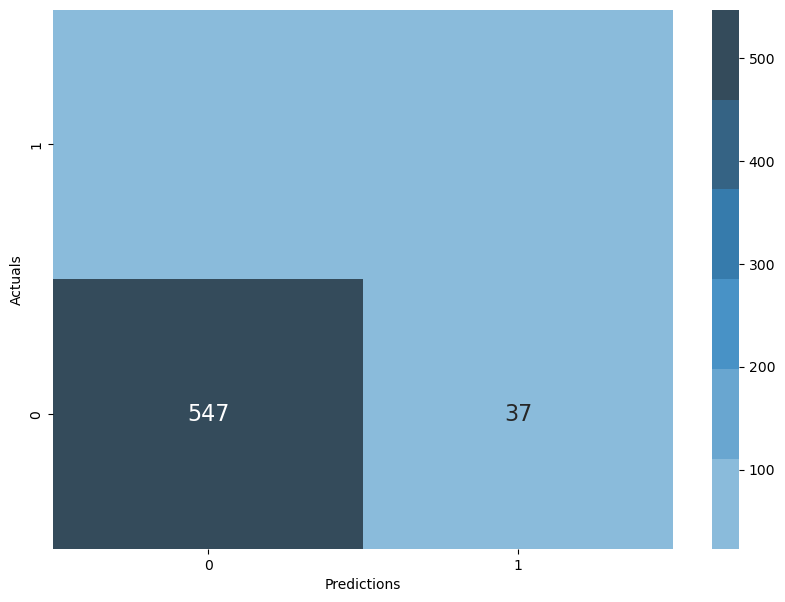

In [18]:
plot_conf_matrix(y_test, y_preds_test)
# We want to reduce that 25 because those are our False Negatives (people who churned that we missed)

The confusion matrix will visually display the number of false negatives (25) where customers who churned were incorrectly predicted as non-churners. Reducing false negatives will help improve the model's recall for identifying churned customers.

## Model Selection:
### Perform Test to Select Best Classifier

Model: RandomForestClassifier()
Training Recall: 1.0
Testing Recall: 0.7228915662650602


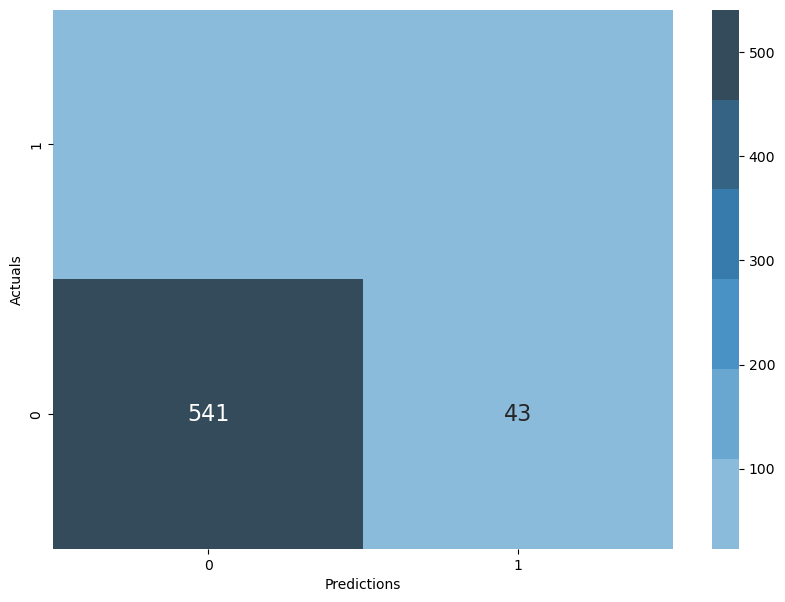


 ---------------------------------- 

Model: KNeighborsClassifier()
Training Recall: 0.9805882352941176
Testing Recall: 0.6506024096385542


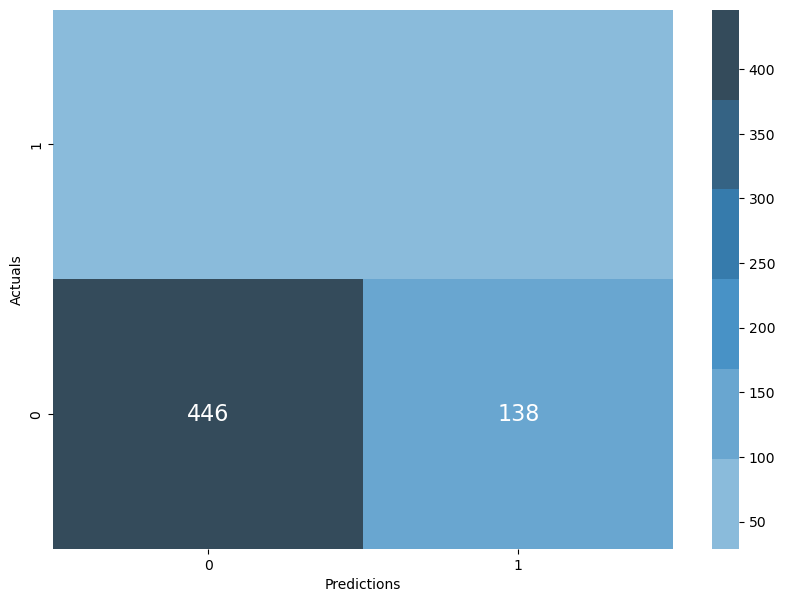


 ---------------------------------- 

Model: GradientBoostingClassifier()
Training Recall: 0.7735294117647059
Testing Recall: 0.6987951807228916


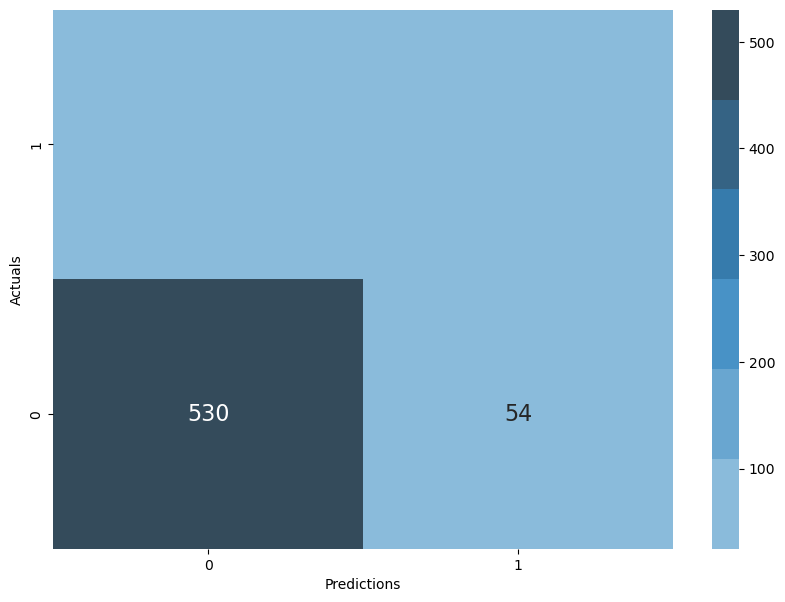


 ---------------------------------- 

Model: GaussianNB()
Training Recall: 0.7594117647058823
Testing Recall: 0.8433734939759037


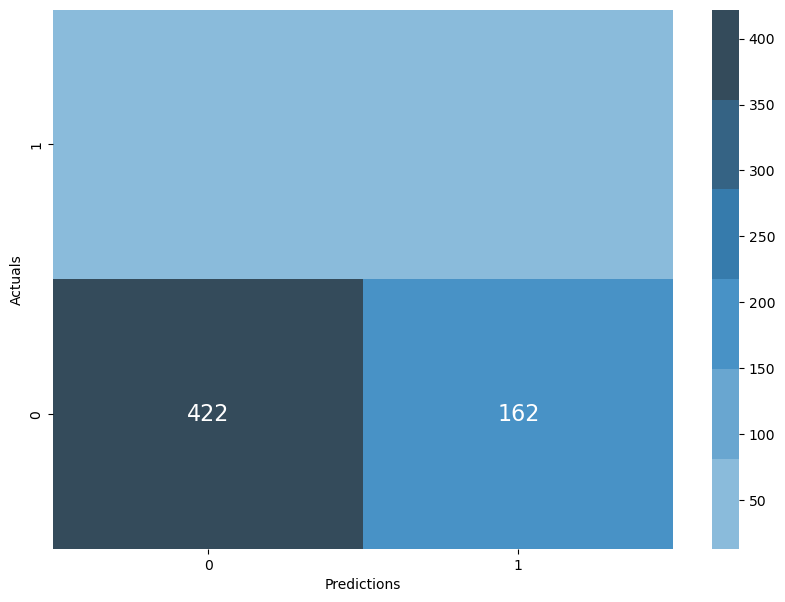


 ---------------------------------- 

Model: SVC()
Training Recall: 0.4576470588235294
Testing Recall: 0.4457831325301205


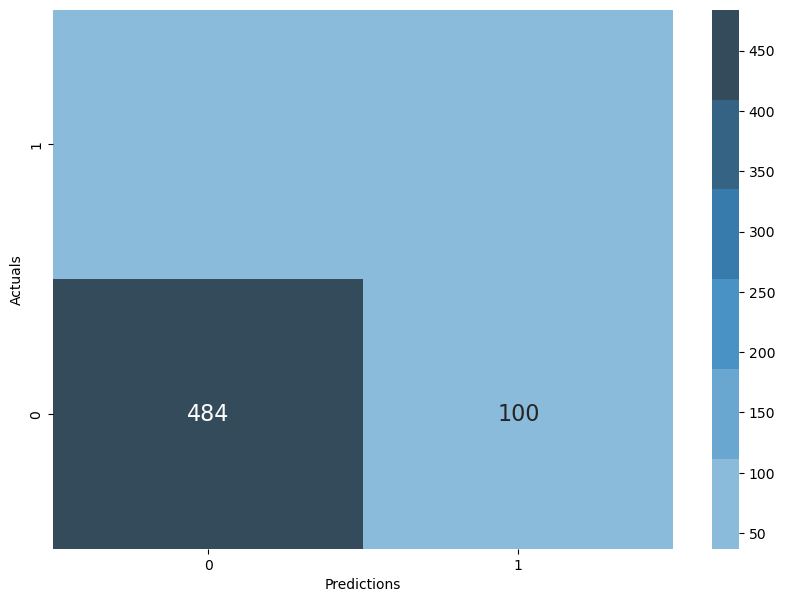


 ---------------------------------- 



In [19]:
rf = RandomForestClassifier()
knn = KNeighborsClassifier()
gboost = GradientBoostingClassifier()
gbayes = GaussianNB()
svm = SVC()

models = [rf, knn, gboost, gbayes, svm]

for model in models:
    model.fit(X_train_resampled, y_train_resampled)
    y_preds_test = model.predict(X_test)
    y_preds_train = model.predict(X_train_resampled)
    print('Model:', model)
    print('Training Recall:', recall_score(y_train_resampled, y_preds_train))
    print('Testing Recall:', recall_score(y_test, y_preds_test))
    plot_conf_matrix(y_test, y_preds_test)
    print('\n ---------------------------------- \n')

**Notes:**

The best performing classifiers here were Gradient Boost, and Gaussian Naive Bayes. They both had the lowest False Negatives and the least overfitting. I would like to redo the KNN model with a scaler to see if that helps it perform better (distance is very much affected by the scales of the features). 

It is also important to note that I did not do any hypertuning yet, nor feature engineering. I am only checking initally which model might do the best with this dataset.

The code trains and evaluates multiple classifiers: `RandomForestClassifier`, `KNeighborsClassifier`, `GradientBoostingClassifier`, `GaussianNB`, and `SVC`. For each model, it prints the recall scores for both the training and testing datasets and displays the confusion matrix.

**Outputs:**
- **RandomForestClassifier**: High training recall (1.0) but lower testing recall (0.72), indicating possible overfitting.
- **KNeighborsClassifier**: Very high training recall (0.98) but lower testing recall (0.65), also suggesting overfitting.
- **GradientBoostingClassifier**: Balanced performance with training recall (0.77) and testing recall (0.70).
- **GaussianNB**: Similar to Gradient Boosting with training recall (0.77) and testing recall (0.70).
- **SVC**: Lower recall scores for both training (0.46) and testing (0.45), indicating poorer performance.

Overall, RandomForest and KNeighborsClassifier show potential overfitting, while GradientBoosting and GaussianNB provide more balanced results.

New KNN Model:
Training Recall: 0.9564705882352941
Testing Recall: 0.6987951807228916


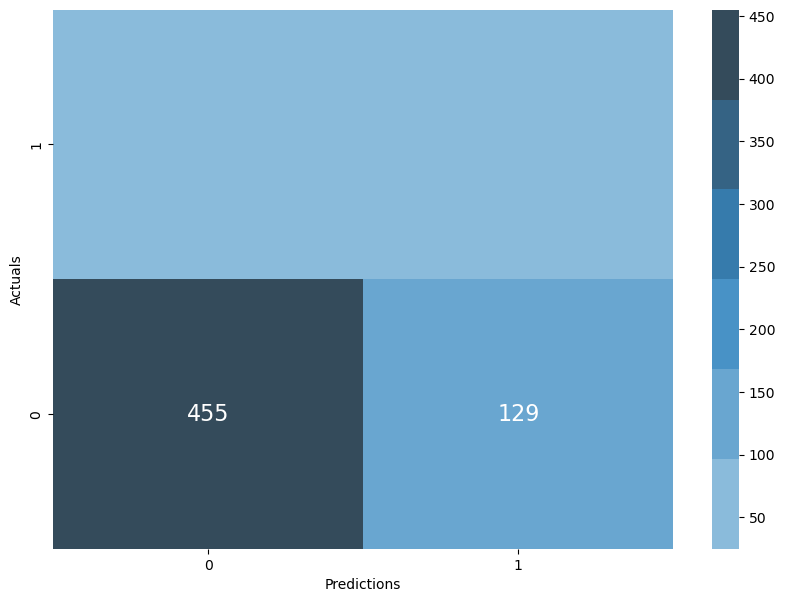

In [5]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import recall_score, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split

# Load and transform the dataframe
df_train = pd.read_csv('training_set.csv', index_col=0)

def transform_df(df):
    df['international plan'] = df['international plan'].apply(lambda x: 1 if x.lower() == 'yes' else 0)
    df['voice mail plan'] = df['voice mail plan'].apply(lambda x: 1 if x.lower() == 'yes' else 0)
    return df

df_train_transformed = transform_df(df_train)

# Define features and target
features_to_use = ['account length', 'international plan', 'voice mail plan', 'number vmail messages',
                   'total day charge', 'total eve charge', 'total night charge', 'total intl charge',
                   'customer service calls']
target = 'churn'

X = df_train_transformed[features_to_use]
y = df_train_transformed[target]

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=1)

# Resample the training data to handle class imbalance
smote = SMOTE()
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

# Initialize and scale the data
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_resampled)
X_test_scaled = scaler.transform(X_test)

# Initialize and train the KNN model
knn = KNeighborsClassifier()
knn.fit(X_train_scaled, y_train_resampled)

# Make predictions
y_preds_test = knn.predict(X_test_scaled)
y_preds_train = knn.predict(X_train_scaled)

# Evaluate and print results
print('New KNN Model:')
print('Training Recall:', recall_score(y_train_resampled, y_preds_train))
print('Testing Recall:', recall_score(y_test, y_preds_test))

# Define function to plot confusion matrix
def plot_conf_matrix(y_true, y_pred):
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(10, 7))
    sns.heatmap(cm, annot=True, cmap=sns.color_palette('Blues_d'), fmt='0.5g', annot_kws={"size": 16})
    plt.xlabel('Predictions')
    plt.ylabel('Actuals')
    plt.ylim([0, 2])
    plt.show()

# Plot the confusion matrix
plot_conf_matrix(y_test, y_preds_test)


The KNN model's training recall is high at 0.956, indicating excellent performance on the training set. However, the testing recall is lower at 0.699, suggesting that the model performs less well on unseen data. This discrepancy might indicate overfitting. 

The confusion matrix visualizes the model's performance, helping identify where the model is missing predictions (false negatives).

Not good. It just predicted everything as not churning. Therefore, I will proceed with Gradient Boosting

Not good. It just predicted everything as not churning. Therefore, I will proceed with Gradient Boosting

## Set up the Pipeline 

**Steps**

1) Choose Columns (need to build a class for this)

2) Transform categorical columns and build features (need a custom class for this too)

3) Deal with class imbalance using SMOTE (imblearn's pipeline will only apply this step to training set)

4) Build model and predict (use existing sklearn methods)

In [8]:
# Functions to build features

def categorize_state(state):
    if state in ['AK', 'AZ', 'DC', 'HI', 'IA', 'IL', 'LA', 'NE', 'NM', 'RI', 'VA', 'WI', 'WV']:
        state = 1
    elif state in ['AL', 'CO', 'FL', 'ID', 'IN', 'KY', 'MO', 'NC', 'ND', 'NH', 'OH', 'OR', 'SD', 'TN', 'VT', 'WY']:
        state = 2
    elif state in ['CT', 'DE', 'GA', 'KS', 'MA', 'MN', 'MS', 'MT', 'NV', 'NY', 'OK', 'UT']:
        state = 3
    else:
        state = 4
    return state


def build_features(X):
    X['total charge'] = X['total day charge'] + X['total eve charge'] + X['total night charge'] + X['total intl charge']
    X['total minutes'] = X['total day minutes'] + X['total eve minutes'] + X['total night minutes'] + X['total intl minutes']
    X['total calls'] = X['total day calls'] + X['total eve calls'] + X['total night calls'] + X['total intl calls']
    X['avg minutes per domestic call'] = (X['total minutes'] - X['total intl minutes']) / (X['total calls'] - X['total intl calls'])
    X['competition'] = X['state'].apply(categorize_state)
    return X

### Code Explanation

1. **`categorize_state(state)`**:
   - Encodes U.S. states into categories based on competition levels.
   - States are mapped to numeric values (1, 2, 3, or 4) representing different levels of competition.

2. **`build_features(X)`**:
   - **`total charge`**: Sum of day, evening, night, and international charges.
   - **`total minutes`**: Sum of day, evening, night, and international minutes.
   - **`total calls`**: Sum of day, evening, night, and international calls.
   - **`avg minutes per domestic call`**: Average minutes for domestic calls, excluding international calls.
   - **`competition`**: Adds a new column encoding state competition level using `categorize_state`.

### Summary
This code augments the dataframe by calculating additional features and encoding state competition levels.

In [10]:
from sklearn.base import BaseEstimator, TransformerMixin

class SelectColumnsTransformer(BaseEstimator, TransformerMixin):
    def __init__(self, columns=None):
        self.columns = columns
        
    def transform(self, X, **transform_params):
        cpy_df = X[self.columns].copy()
        return cpy_df

    def fit(self, X, y=None, **fit_params):
        return self
    
class TransformCategorical(BaseEstimator, TransformerMixin):
    def transform(self, X, y=None, **transform_params):
        try:
            X['international plan'] = X['international plan'].apply(self.yes_no_func)
            X['voice mail plan'] = X['voice mail plan'].apply(self.yes_no_func)
        except:
            pass
        return X

    def fit(self, X, y=None, **fit_params):
        return self
    
    @staticmethod
    def yes_no_func(x):
        return 1 if x.lower() == 'yes' else 0


### Code Explanation

1. **`SelectColumnsTransformer`**:
   - **Purpose**: Selects specified columns from the dataframe.
   - **Methods**:
     - `transform()`: Returns a dataframe with only the specified columns.
     - `fit()`: No-op, required for compatibility with scikit-learn.

2. **`TransformCategorical`**:
   - **Purpose**: Converts 'yes'/'no' values in categorical columns to 1/0.
   - **Methods**:
     - `transform()`: Applies `yes_no_func` to 'international plan' and 'voice mail plan'.
     - `fit()`: No-op, required for compatibility with scikit-learn.
   - **`yes_no_func(x)`**: Converts 'yes' to 1 and 'no' to 0.

In [12]:
# Reset index to make 'state' a column
df_train_reset = df_train.reset_index()

# Check if 'state' column exists
if 'state' not in df_train_reset.columns:
    print("The 'state' column is missing from the dataframe.")
else:
    # Apply the build_features function
    df_with_features = build_features(df_train_reset)
    print(df_with_features.head())


  state  account length  area code phone number  international plan  \
0    UT             243        510     355-9360                   0   
1    SC             108        415     399-6233                   0   
2    TX              75        415     384-2372                   1   
3    CO             141        415     340-5121                   0   
4    IN              86        510     357-7893                   0   

   voice mail plan  number vmail messages  total day minutes  total day calls  \
0                0                      0               95.5               92   
1                0                      0              112.0              105   
2                0                      0              222.4               78   
3                0                      0              126.9               98   
4                0                      0              216.3               96   

   total day charge  ...  total intl minutes  total intl calls  \
0             16.24 


1. **Reset Index**:
   - **Purpose**: Converts the index into a column, making 'state' accessible as a column.
   - **Code**: `df_train_reset = df_train.reset_index()`

2. **Check 'state' Column**:
   - **Purpose**: Verifies if the 'state' column is present in the dataframe.
   - **Code**: `if 'state' not in df_train_reset.columns:`

3. **Apply Feature Engineering**:
   - **Purpose**: Adds new features to the dataframe based on existing data.
   - **Code**: `df_with_features = build_features(df_train_reset)`

4. **Print Results**:
   - **Purpose**: Displays the first few rows of the dataframe with new features.
   - **Code**: `print(df_with_features.head())`

In [14]:
# Reset index to make 'state' a column
df_train_reset = df_train.reset_index()

# Apply the build_features function
df_with_features = build_features(df_train_reset)
df_with_features.head()


,state,account length,area code,phone number,international plan,voice mail plan,number vmail messages,total day minutes,total day calls,total day charge,...,total intl minutes,total intl calls,total intl charge,customer service calls,churn,total charge,total minutes,total calls,avg minutes per domestic call,competition
0,UT,243,510,355-9360,0,0,0,95.5,92,16.24,...,6.6,6,1.78,2,False,43.82,530.0,279,1.917216,3
1,SC,108,415,399-6233,0,0,0,112.0,105,19.04,...,4.1,4,1.11,4,True,46.01,518.7,312,1.670779,4
2,TX,75,415,384-2372,1,0,0,222.4,78,37.81,...,8.7,9,2.35,1,True,77.32,766.1,302,2.584983,4
3,CO,141,415,340-5121,0,0,0,126.9,98,21.57,...,8.0,2,2.16,1,False,45.37,455.7,290,1.554514,2
4,IN,86,510,357-7893,0,0,0,216.3,96,36.77,...,4.5,3,1.22,0,False,70.26,701.1,286,2.461484,2


In [15]:
features_to_use = ['account length', 'international plan', 'voice mail plan', 'number vmail messages',
                   'total charge', 'customer service calls', 'competition',
                   'avg minutes per domestic call', 'total calls', 'total minutes']
target = ['churn']


- **`features_to_use`**: This list specifies the features (columns) to be used for training the machine learning model. It includes:
  - **'account length'**: Length of the customer’s account.
  - **'international plan'**: Binary indicator if the customer has an international plan.
  - **'voice mail plan'**: Binary indicator if the customer has a voice mail plan.
  - **'number vmail messages'**: Number of voice mail messages.
  - **'total charge'**: Sum of all charge types (day, evening, night, international).
  - **'customer service calls'**: Number of customer service calls.
  - **'competition'**: Categorical representation of the state based on competition.
  - **'avg minutes per domestic call'**: Average minutes per domestic call (excluding international).
  - **'total calls'**: Total number of calls.
  - **'total minutes'**: Total minutes of calls (day, evening, night, international).

- **`target`**: This specifies the target variable to predict.
  - **'churn'**: Indicates whether the customer has churned (left) or not. 

In essence, **`features_to_use`** defines the input variables for the model, while **`target`** defines what the model aims to predict.

In [18]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import GradientBoostingClassifier
from imblearn.over_sampling import SMOTE
from sklearn.base import BaseEstimator, TransformerMixin

# Custom transformers
class SelectColumnsTransformer(BaseEstimator, TransformerMixin):
    def __init__(self, columns=None):
        self.columns = columns
        
    def transform(self, X, **transform_params):
        cpy_df = X[self.columns].copy()
        return cpy_df

    def fit(self, X, y=None, **fit_params):
        return self
    
class TransformCategorical(BaseEstimator, TransformerMixin):
    def transform(self, X, y=None, **transform_params):
        X['international plan'] = X['international plan'].apply(self.yes_no_func)
        X['voice mail plan'] = X['voice mail plan'].apply(self.yes_no_func)
        return X

    def fit(self, X, y=None, **fit_params):
        return self
    
    @staticmethod
    def yes_no_func(x):
        return 1 if x.lower() == 'yes' else 0

# Pipeline definition
pipeline = Pipeline(steps=[
    ("SelectColumns", SelectColumnsTransformer(columns=features_to_use)),
    ("TransformCategorical", TransformCategorical()),
    ("SMOTE", SMOTE()),
    ("GradientBoosting", GradientBoostingClassifier())
])


The pipeline:

1. **SelectColumnsTransformer**: Chooses specific features.
2. **Transform_Categorical**: Converts categorical values to numeric.
3. **SMOTE**: Balances class distribution by generating synthetic samples.
4. **GradientBoostingClassifier**: Trains a Gradient Boosting model.

It processes the data through each step in sequence.

In [19]:
X_train = df_with_features.drop(columns=['churn'])
y_train = df_with_features[target]

The code:

- **`X_train`**: Creates feature data by dropping the `churn` column from `df_with_features`.
- **`y_train`**: Extracts the target variable `churn` from `df_with_features`.

In summary, it separates features and target for training.

In [29]:
from sklearn.base import BaseEstimator, TransformerMixin
from imblearn.pipeline import Pipeline
from imblearn.over_sampling import SMOTE
from sklearn.ensemble import GradientBoostingClassifier

class SelectColumnsTransformer(BaseEstimator, TransformerMixin):
    def __init__(self, columns=None):
        self.columns = columns
        
    def transform(self, X, **transform_params):
        cpy_df = X[self.columns].copy()
        return cpy_df

    def fit(self, X, y=None, **fit_params):
        return self
    
class TransformCategorical(BaseEstimator, TransformerMixin):
    def transform(self, X, y=None, **transform_params):
        if 'international plan' in X.columns:
            X['international plan'] = X['international plan'].astype(str).apply(self.yes_no_func)
        if 'voice mail plan' in X.columns:
            X['voice mail plan'] = X['voice mail plan'].astype(str).apply(self.yes_no_func)
        return X

    def fit(self, X, y=None, **fit_params):
        return self
    
    @staticmethod
    def yes_no_func(x):
        if isinstance(x, str):
            return 1 if x.lower() == 'yes' else 0
        return x

# Define the pipeline
pipeline = Pipeline(steps=[
    ("ColumnTransformer", SelectColumnsTransformer(columns=features_to_use)),
    ("TransformCategorical", TransformCategorical()),
    ("SMOTE", SMOTE()),
    ("GradientBooster", GradientBoostingClassifier())
])

# Print the pipeline
print(pipeline)

# Prepare the data
X_train = df_with_features.drop(columns=[target])
y_train = df_with_features[target]

# Fit the pipeline
pipeline.fit(X_train, y_train)


Pipeline(steps=[('ColumnTransformer',
                 SelectColumnsTransformer(columns=['account length',
                                                   'international plan',
                                                   'voice mail plan',
                                                   'number vmail messages',
                                                   'total charge',
                                                   'customer service calls',
                                                   'competition',
                                                   'avg minutes per domestic '
                                                   'call',
                                                   'total calls',
                                                   'total minutes'])),
                ('TransformCategorical', TransformCategorical()),
                ('SMOTE', SMOTE()),
                ('GradientBooster', GradientBoostingClassifier())])


Pipeline(steps=[('ColumnTransformer',
                 SelectColumnsTransformer(columns=['account length',
                                                   'international plan',
                                                   'voice mail plan',
                                                   'number vmail messages',
                                                   'total charge',
                                                   'customer service calls',
                                                   'competition',
                                                   'avg minutes per domestic '
                                                   'call',
                                                   'total calls',
                                                   'total minutes'])),
                ('TransformCategorical', TransformCategorical()),
                ('SMOTE', SMOTE()),
                ('GradientBooster', GradientBoostingClassifier())])


1. **SelectColumnsTransformer**: Extracts specified columns from the dataset.
2. **TransformCategorical**: Converts categorical 'yes/no' columns to numerical values (1 or 0).
3. **Pipeline**: Combines the above transformers with SMOTE (for handling class imbalance) and a Gradient Boosting Classifier (for model training).

### Output Details:
- **`pipeline`**: Displays the sequence of processing steps in the `Pipeline`.
- **`pipeline.fit(X_train, y_train)`**: Trains the pipeline on the data.

The output shows the `Pipeline` object with its steps and configurations, indicating successful setup and readiness for fitting to the data.

In [30]:
# Bring in validation set to test
df_validation = pd.read_csv('validation_set.csv', index_col=0)
df_validation.head()

,account length,area code,phone number,international plan,voice mail plan,number vmail messages,total day minutes,total day calls,total day charge,total eve minutes,total eve calls,total eve charge,total night minutes,total night calls,total night charge,total intl minutes,total intl calls,total intl charge,customer service calls,churn
state,,,,,,,,,,,,,,,,,,,,
HI,87,408,360-2690,no,yes,28,151.4,95,25.74,152.4,97,12.95,250.1,109,11.25,0.0,0,0.00,1,False
NE,67,510,362-7951,no,yes,31,175.2,68,29.78,199.2,73,16.93,219.8,99,9.89,13.2,6,3.56,1,False
RI,112,415,405-7467,no,no,0,168.6,102,28.66,298.0,117,25.33,194.7,110,8.76,9.8,5,2.65,1,False
OH,100,510,385-8997,no,no,0,278.0,76,47.26,176.7,74,15.02,219.5,126,9.88,8.3,4,2.24,0,True
WY,78,408,384-3902,no,no,0,220.0,95,37.40,179.9,121,15.29,188.2,109,8.47,11.5,5,3.11,0,False


In [32]:
# Reset index to make 'state' a column
df_validation_reset = df_validation.reset_index()

# Apply the build_features function
df_valid_transformed = build_features(df_validation_reset)

# Separate features and target
X_valid = df_valid_transformed.drop(columns='churn')
y_valid = df_valid_transformed['churn']


In [33]:
pipeline.score(X_valid, y_valid)

0.9385307346326837


**Code:**

```python
pipeline.score(X_valid, y_valid)
```

- **Code Purpose:** This line evaluates the performance of the trained pipeline on the validation set.
- **Function:** `pipeline.score(X_valid, y_valid)` computes the accuracy of the model by comparing predicted values against the actual target values (`y_valid`).

**Output:**

- **Value:** `0.9385307346326837`
- **Meaning:** The model's accuracy is approximately 93.85%, indicating it correctly predicted the target variable for about 93.85% of the validation samples. This high accuracy suggests the model performs well on the validation dataset.

In [34]:
y_preds = pipeline.predict(X_valid)

The code `y_preds = pipeline.predict(X_valid)` generates predictions for the validation dataset `X_valid` using the trained pipeline model, storing the predicted values in `y_preds`.

0.6534653465346535
Confusion Matrix for Model Before Tuning


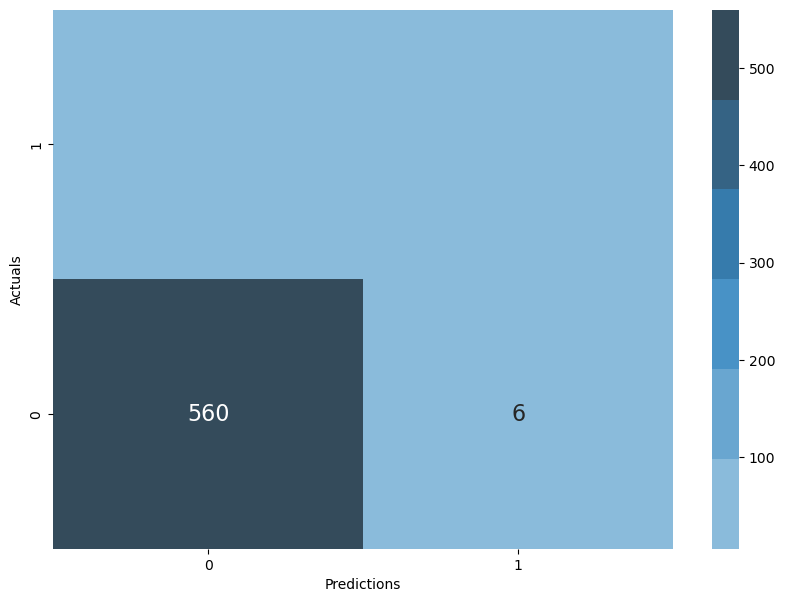

In [35]:
print(recall_score(y_valid, y_preds))
print('Confusion Matrix for Model Before Tuning')
plot_conf_matrix(y_valid, y_preds)

The code calculates the recall score, which measures the model's ability to correctly identify positive instances (output: `0.653`). Then, it prints the confusion matrix, visually showing the model's performance before any tuning.

## Model Tuning & GridSearch

In [36]:
param_grid = {
            "ColumnTransformer__columns": [['account length', 'international plan', 'voice mail plan',
                                           'number vmail messages', 'total day minutes', 'total day calls',
                                           'total day charge', 'total eve minutes', 'total eve calls',
                                           'total eve charge', 'total night minutes', 'total night calls',
                                           'total night charge', 'total intl minutes', 'total intl calls',
                                           'total intl charge', 'customer service calls'],
                                          ['account length', 'international plan', 'voice mail plan',
                                           'number vmail messages', 'total day minutes', 'total day calls',
                                           'total day charge', 'total eve minutes', 'total eve calls',
                                           'total eve charge', 'total night minutes', 'total night calls',
                                           'total night charge', 'total intl minutes', 'total intl calls',
                                           'total intl charge', 'customer service calls', 'total charge', 
                                           'total minutes', 'total calls', 'avg minutes per domestic call',
                                           'competition']],
        "SMOTE__sampling_strategy": [1],
        "GradientBooster__loss": ['deviance', 'exponential'],
        "GradientBooster__n_estimators": [100, 150],
        "GradientBooster__max_depth": [3, 5],
        "GradientBooster__max_features": ['auto', 8, None]
}

This code snippet creates a `param_grid` dictionary for hyperparameter tuning using grid search. It defines different sets of parameters to try:

1. **`ColumnTransformer__columns`**: Two lists of columns for feature selection.
2. **`SMOTE__sampling_strategy`**: SMOTE oversampling ratio, set to `1`.
3. **`GradientBooster__loss`**: Loss functions to try, either `'deviance'` or `'exponential'`.
4. **`GradientBooster__n_estimators`**: Number of boosting stages, `100` or `150`.
5. **`GradientBooster__max_depth`**: Maximum tree depth, `3` or `5`.
6. **`GradientBooster__max_features`**: Features considered for the best split, options are `'auto'`, `8`, or `None`.

In [38]:
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import make_scorer, recall_score

# Warning! This takes a long time to run!
gs_pipeline = GridSearchCV(pipeline, param_grid=param_grid, verbose=2, scoring=make_scorer(recall_score))
gs_pipeline.fit(X_train, y_train)


Fitting 5 folds for each of 48 candidates, totalling 240 fits


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaco

[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls'], GradientBooster__loss=deviance, GradientBooster__max_depth=3, GradientBooster__max_features=auto, GradientBooster__n_estimators=100, SMOTE__sampling_strategy=1; total time=   2.6s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\si

[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls'], GradientBooster__loss=deviance, GradientBooster__max_depth=3, GradientBooster__max_features=auto, GradientBooster__n_estimators=100, SMOTE__sampling_strategy=1; total time=   2.3s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\si

[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls'], GradientBooster__loss=deviance, GradientBooster__max_depth=3, GradientBooster__max_features=auto, GradientBooster__n_estimators=100, SMOTE__sampling_strategy=1; total time=   2.0s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaco

[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls'], GradientBooster__loss=deviance, GradientBooster__max_depth=3, GradientBooster__max_features=auto, GradientBooster__n_estimators=100, SMOTE__sampling_strategy=1; total time=   2.0s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaco

[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls'], GradientBooster__loss=deviance, GradientBooster__max_depth=3, GradientBooster__max_features=auto, GradientBooster__n_estimators=100, SMOTE__sampling_strategy=1; total time=   2.0s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaco

[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls'], GradientBooster__loss=deviance, GradientBooster__max_depth=3, GradientBooster__max_features=auto, GradientBooster__n_estimators=150, SMOTE__sampling_strategy=1; total time=   2.8s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaco

[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls'], GradientBooster__loss=deviance, GradientBooster__max_depth=3, GradientBooster__max_features=auto, GradientBooster__n_estimators=150, SMOTE__sampling_strategy=1; total time=   3.1s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaco

[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls'], GradientBooster__loss=deviance, GradientBooster__max_depth=3, GradientBooster__max_features=auto, GradientBooster__n_estimators=150, SMOTE__sampling_strategy=1; total time=   2.9s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaco

[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls'], GradientBooster__loss=deviance, GradientBooster__max_depth=3, GradientBooster__max_features=auto, GradientBooster__n_estimators=150, SMOTE__sampling_strategy=1; total time=   2.9s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaco

[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls'], GradientBooster__loss=deviance, GradientBooster__max_depth=3, GradientBooster__max_features=auto, GradientBooster__n_estimators=150, SMOTE__sampling_strategy=1; total time=   3.7s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(


[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls'], GradientBooster__loss=deviance, GradientBooster__max_depth=3, GradientBooster__max_features=8, GradientBooster__n_estimators=100, SMOTE__sampling_strategy=1; total time=   1.2s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(


[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls'], GradientBooster__loss=deviance, GradientBooster__max_depth=3, GradientBooster__max_features=8, GradientBooster__n_estimators=100, SMOTE__sampling_strategy=1; total time=   1.3s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(


[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls'], GradientBooster__loss=deviance, GradientBooster__max_depth=3, GradientBooster__max_features=8, GradientBooster__n_estimators=100, SMOTE__sampling_strategy=1; total time=   1.2s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(


[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls'], GradientBooster__loss=deviance, GradientBooster__max_depth=3, GradientBooster__max_features=8, GradientBooster__n_estimators=100, SMOTE__sampling_strategy=1; total time=   1.5s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(


[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls'], GradientBooster__loss=deviance, GradientBooster__max_depth=3, GradientBooster__max_features=8, GradientBooster__n_estimators=100, SMOTE__sampling_strategy=1; total time=   1.2s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(


[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls'], GradientBooster__loss=deviance, GradientBooster__max_depth=3, GradientBooster__max_features=8, GradientBooster__n_estimators=150, SMOTE__sampling_strategy=1; total time=   1.5s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(


[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls'], GradientBooster__loss=deviance, GradientBooster__max_depth=3, GradientBooster__max_features=8, GradientBooster__n_estimators=150, SMOTE__sampling_strategy=1; total time=   1.8s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(


[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls'], GradientBooster__loss=deviance, GradientBooster__max_depth=3, GradientBooster__max_features=8, GradientBooster__n_estimators=150, SMOTE__sampling_strategy=1; total time=   1.6s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(


[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls'], GradientBooster__loss=deviance, GradientBooster__max_depth=3, GradientBooster__max_features=8, GradientBooster__n_estimators=150, SMOTE__sampling_strategy=1; total time=   1.7s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(


[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls'], GradientBooster__loss=deviance, GradientBooster__max_depth=3, GradientBooster__max_features=8, GradientBooster__n_estimators=150, SMOTE__sampling_strategy=1; total time=   1.6s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(


[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls'], GradientBooster__loss=deviance, GradientBooster__max_depth=3, GradientBooster__max_features=None, GradientBooster__n_estimators=100, SMOTE__sampling_strategy=1; total time=   2.5s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(


[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls'], GradientBooster__loss=deviance, GradientBooster__max_depth=3, GradientBooster__max_features=None, GradientBooster__n_estimators=100, SMOTE__sampling_strategy=1; total time=   2.1s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(


[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls'], GradientBooster__loss=deviance, GradientBooster__max_depth=3, GradientBooster__max_features=None, GradientBooster__n_estimators=100, SMOTE__sampling_strategy=1; total time=   2.2s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(


[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls'], GradientBooster__loss=deviance, GradientBooster__max_depth=3, GradientBooster__max_features=None, GradientBooster__n_estimators=100, SMOTE__sampling_strategy=1; total time=   2.0s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(


[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls'], GradientBooster__loss=deviance, GradientBooster__max_depth=3, GradientBooster__max_features=None, GradientBooster__n_estimators=100, SMOTE__sampling_strategy=1; total time=   2.2s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(


[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls'], GradientBooster__loss=deviance, GradientBooster__max_depth=3, GradientBooster__max_features=None, GradientBooster__n_estimators=150, SMOTE__sampling_strategy=1; total time=   2.9s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(


[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls'], GradientBooster__loss=deviance, GradientBooster__max_depth=3, GradientBooster__max_features=None, GradientBooster__n_estimators=150, SMOTE__sampling_strategy=1; total time=   3.8s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(


[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls'], GradientBooster__loss=deviance, GradientBooster__max_depth=3, GradientBooster__max_features=None, GradientBooster__n_estimators=150, SMOTE__sampling_strategy=1; total time=   3.4s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(


[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls'], GradientBooster__loss=deviance, GradientBooster__max_depth=3, GradientBooster__max_features=None, GradientBooster__n_estimators=150, SMOTE__sampling_strategy=1; total time=   3.0s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(


[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls'], GradientBooster__loss=deviance, GradientBooster__max_depth=3, GradientBooster__max_features=None, GradientBooster__n_estimators=150, SMOTE__sampling_strategy=1; total time=   2.8s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaco

[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls'], GradientBooster__loss=deviance, GradientBooster__max_depth=5, GradientBooster__max_features=auto, GradientBooster__n_estimators=100, SMOTE__sampling_strategy=1; total time=   3.1s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaco

[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls'], GradientBooster__loss=deviance, GradientBooster__max_depth=5, GradientBooster__max_features=auto, GradientBooster__n_estimators=100, SMOTE__sampling_strategy=1; total time=   3.3s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaco

[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls'], GradientBooster__loss=deviance, GradientBooster__max_depth=5, GradientBooster__max_features=auto, GradientBooster__n_estimators=100, SMOTE__sampling_strategy=1; total time=   3.3s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaco

[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls'], GradientBooster__loss=deviance, GradientBooster__max_depth=5, GradientBooster__max_features=auto, GradientBooster__n_estimators=100, SMOTE__sampling_strategy=1; total time=   3.2s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaco

[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls'], GradientBooster__loss=deviance, GradientBooster__max_depth=5, GradientBooster__max_features=auto, GradientBooster__n_estimators=100, SMOTE__sampling_strategy=1; total time=   3.1s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaco

[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls'], GradientBooster__loss=deviance, GradientBooster__max_depth=5, GradientBooster__max_features=auto, GradientBooster__n_estimators=150, SMOTE__sampling_strategy=1; total time=   4.6s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaco

[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls'], GradientBooster__loss=deviance, GradientBooster__max_depth=5, GradientBooster__max_features=auto, GradientBooster__n_estimators=150, SMOTE__sampling_strategy=1; total time=   5.7s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaco

[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls'], GradientBooster__loss=deviance, GradientBooster__max_depth=5, GradientBooster__max_features=auto, GradientBooster__n_estimators=150, SMOTE__sampling_strategy=1; total time=   4.6s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaco

[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls'], GradientBooster__loss=deviance, GradientBooster__max_depth=5, GradientBooster__max_features=auto, GradientBooster__n_estimators=150, SMOTE__sampling_strategy=1; total time=   4.7s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaco

[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls'], GradientBooster__loss=deviance, GradientBooster__max_depth=5, GradientBooster__max_features=auto, GradientBooster__n_estimators=150, SMOTE__sampling_strategy=1; total time=   4.7s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(


[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls'], GradientBooster__loss=deviance, GradientBooster__max_depth=5, GradientBooster__max_features=8, GradientBooster__n_estimators=100, SMOTE__sampling_strategy=1; total time=   1.9s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(


[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls'], GradientBooster__loss=deviance, GradientBooster__max_depth=5, GradientBooster__max_features=8, GradientBooster__n_estimators=100, SMOTE__sampling_strategy=1; total time=   1.9s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(


[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls'], GradientBooster__loss=deviance, GradientBooster__max_depth=5, GradientBooster__max_features=8, GradientBooster__n_estimators=100, SMOTE__sampling_strategy=1; total time=   1.5s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(


[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls'], GradientBooster__loss=deviance, GradientBooster__max_depth=5, GradientBooster__max_features=8, GradientBooster__n_estimators=100, SMOTE__sampling_strategy=1; total time=   1.8s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(


[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls'], GradientBooster__loss=deviance, GradientBooster__max_depth=5, GradientBooster__max_features=8, GradientBooster__n_estimators=100, SMOTE__sampling_strategy=1; total time=   2.0s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(


[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls'], GradientBooster__loss=deviance, GradientBooster__max_depth=5, GradientBooster__max_features=8, GradientBooster__n_estimators=150, SMOTE__sampling_strategy=1; total time=   2.7s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(


[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls'], GradientBooster__loss=deviance, GradientBooster__max_depth=5, GradientBooster__max_features=8, GradientBooster__n_estimators=150, SMOTE__sampling_strategy=1; total time=   2.8s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(


[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls'], GradientBooster__loss=deviance, GradientBooster__max_depth=5, GradientBooster__max_features=8, GradientBooster__n_estimators=150, SMOTE__sampling_strategy=1; total time=   3.1s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(


[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls'], GradientBooster__loss=deviance, GradientBooster__max_depth=5, GradientBooster__max_features=8, GradientBooster__n_estimators=150, SMOTE__sampling_strategy=1; total time=   3.0s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(


[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls'], GradientBooster__loss=deviance, GradientBooster__max_depth=5, GradientBooster__max_features=8, GradientBooster__n_estimators=150, SMOTE__sampling_strategy=1; total time=   2.6s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(


[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls'], GradientBooster__loss=deviance, GradientBooster__max_depth=5, GradientBooster__max_features=None, GradientBooster__n_estimators=100, SMOTE__sampling_strategy=1; total time=   3.3s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(


[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls'], GradientBooster__loss=deviance, GradientBooster__max_depth=5, GradientBooster__max_features=None, GradientBooster__n_estimators=100, SMOTE__sampling_strategy=1; total time=   3.1s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(


[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls'], GradientBooster__loss=deviance, GradientBooster__max_depth=5, GradientBooster__max_features=None, GradientBooster__n_estimators=100, SMOTE__sampling_strategy=1; total time=   3.2s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(


[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls'], GradientBooster__loss=deviance, GradientBooster__max_depth=5, GradientBooster__max_features=None, GradientBooster__n_estimators=100, SMOTE__sampling_strategy=1; total time=   3.3s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(


[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls'], GradientBooster__loss=deviance, GradientBooster__max_depth=5, GradientBooster__max_features=None, GradientBooster__n_estimators=100, SMOTE__sampling_strategy=1; total time=   3.3s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(


[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls'], GradientBooster__loss=deviance, GradientBooster__max_depth=5, GradientBooster__max_features=None, GradientBooster__n_estimators=150, SMOTE__sampling_strategy=1; total time=   4.5s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(


[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls'], GradientBooster__loss=deviance, GradientBooster__max_depth=5, GradientBooster__max_features=None, GradientBooster__n_estimators=150, SMOTE__sampling_strategy=1; total time=   4.8s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(


[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls'], GradientBooster__loss=deviance, GradientBooster__max_depth=5, GradientBooster__max_features=None, GradientBooster__n_estimators=150, SMOTE__sampling_strategy=1; total time=   5.5s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(


[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls'], GradientBooster__loss=deviance, GradientBooster__max_depth=5, GradientBooster__max_features=None, GradientBooster__n_estimators=150, SMOTE__sampling_strategy=1; total time=   4.8s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(


[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls'], GradientBooster__loss=deviance, GradientBooster__max_depth=5, GradientBooster__max_features=None, GradientBooster__n_estimators=150, SMOTE__sampling_strategy=1; total time=   4.6s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\si

[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls'], GradientBooster__loss=exponential, GradientBooster__max_depth=3, GradientBooster__max_features=auto, GradientBooster__n_estimators=100, SMOTE__sampling_strategy=1; total time=   2.0s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\si

[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls'], GradientBooster__loss=exponential, GradientBooster__max_depth=3, GradientBooster__max_features=auto, GradientBooster__n_estimators=100, SMOTE__sampling_strategy=1; total time=   1.9s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\si

[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls'], GradientBooster__loss=exponential, GradientBooster__max_depth=3, GradientBooster__max_features=auto, GradientBooster__n_estimators=100, SMOTE__sampling_strategy=1; total time=   2.0s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\si

[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls'], GradientBooster__loss=exponential, GradientBooster__max_depth=3, GradientBooster__max_features=auto, GradientBooster__n_estimators=100, SMOTE__sampling_strategy=1; total time=   2.0s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\si

[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls'], GradientBooster__loss=exponential, GradientBooster__max_depth=3, GradientBooster__max_features=auto, GradientBooster__n_estimators=100, SMOTE__sampling_strategy=1; total time=   2.0s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\si

[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls'], GradientBooster__loss=exponential, GradientBooster__max_depth=3, GradientBooster__max_features=auto, GradientBooster__n_estimators=150, SMOTE__sampling_strategy=1; total time=   2.7s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\si

[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls'], GradientBooster__loss=exponential, GradientBooster__max_depth=3, GradientBooster__max_features=auto, GradientBooster__n_estimators=150, SMOTE__sampling_strategy=1; total time=   2.8s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\si

[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls'], GradientBooster__loss=exponential, GradientBooster__max_depth=3, GradientBooster__max_features=auto, GradientBooster__n_estimators=150, SMOTE__sampling_strategy=1; total time=   3.1s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\si

[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls'], GradientBooster__loss=exponential, GradientBooster__max_depth=3, GradientBooster__max_features=auto, GradientBooster__n_estimators=150, SMOTE__sampling_strategy=1; total time=   3.6s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\si

[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls'], GradientBooster__loss=exponential, GradientBooster__max_depth=3, GradientBooster__max_features=auto, GradientBooster__n_estimators=150, SMOTE__sampling_strategy=1; total time=   2.8s
[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls'], GradientBooster__loss=e

c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\si

[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls'], GradientBooster__loss=exponential, GradientBooster__max_depth=5, GradientBooster__max_features=auto, GradientBooster__n_estimators=100, SMOTE__sampling_strategy=1; total time=   3.2s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\si

[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls'], GradientBooster__loss=exponential, GradientBooster__max_depth=5, GradientBooster__max_features=auto, GradientBooster__n_estimators=100, SMOTE__sampling_strategy=1; total time=   3.3s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\si

[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls'], GradientBooster__loss=exponential, GradientBooster__max_depth=5, GradientBooster__max_features=auto, GradientBooster__n_estimators=100, SMOTE__sampling_strategy=1; total time=   3.3s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\si

[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls'], GradientBooster__loss=exponential, GradientBooster__max_depth=5, GradientBooster__max_features=auto, GradientBooster__n_estimators=100, SMOTE__sampling_strategy=1; total time=   3.4s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\si

[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls'], GradientBooster__loss=exponential, GradientBooster__max_depth=5, GradientBooster__max_features=auto, GradientBooster__n_estimators=100, SMOTE__sampling_strategy=1; total time=   3.3s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\si

[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls'], GradientBooster__loss=exponential, GradientBooster__max_depth=5, GradientBooster__max_features=auto, GradientBooster__n_estimators=150, SMOTE__sampling_strategy=1; total time=   5.4s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\si

[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls'], GradientBooster__loss=exponential, GradientBooster__max_depth=5, GradientBooster__max_features=auto, GradientBooster__n_estimators=150, SMOTE__sampling_strategy=1; total time=   5.1s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\si

[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls'], GradientBooster__loss=exponential, GradientBooster__max_depth=5, GradientBooster__max_features=auto, GradientBooster__n_estimators=150, SMOTE__sampling_strategy=1; total time=   4.6s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\si

[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls'], GradientBooster__loss=exponential, GradientBooster__max_depth=5, GradientBooster__max_features=auto, GradientBooster__n_estimators=150, SMOTE__sampling_strategy=1; total time=   5.2s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\si

[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls'], GradientBooster__loss=exponential, GradientBooster__max_depth=5, GradientBooster__max_features=auto, GradientBooster__n_estimators=150, SMOTE__sampling_strategy=1; total time=   4.7s
[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls'], GradientBooster__loss=e

c:\Users\hp\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaco

[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls', 'total charge', 'total minutes', 'total calls', 'avg minutes per domestic call', 'competition'], GradientBooster__loss=deviance, GradientBooster__max_depth=3, GradientBooster__max_features=auto, GradientBooster__n_estimators=100, SMOTE__sampling_strategy=1; total time=   2.6s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaco

[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls', 'total charge', 'total minutes', 'total calls', 'avg minutes per domestic call', 'competition'], GradientBooster__loss=deviance, GradientBooster__max_depth=3, GradientBooster__max_features=auto, GradientBooster__n_estimators=100, SMOTE__sampling_strategy=1; total time=   2.7s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaco

[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls', 'total charge', 'total minutes', 'total calls', 'avg minutes per domestic call', 'competition'], GradientBooster__loss=deviance, GradientBooster__max_depth=3, GradientBooster__max_features=auto, GradientBooster__n_estimators=100, SMOTE__sampling_strategy=1; total time=   2.5s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaco

[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls', 'total charge', 'total minutes', 'total calls', 'avg minutes per domestic call', 'competition'], GradientBooster__loss=deviance, GradientBooster__max_depth=3, GradientBooster__max_features=auto, GradientBooster__n_estimators=100, SMOTE__sampling_strategy=1; total time=   2.7s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaco

[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls', 'total charge', 'total minutes', 'total calls', 'avg minutes per domestic call', 'competition'], GradientBooster__loss=deviance, GradientBooster__max_depth=3, GradientBooster__max_features=auto, GradientBooster__n_estimators=100, SMOTE__sampling_strategy=1; total time=   2.5s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\si

[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls', 'total charge', 'total minutes', 'total calls', 'avg minutes per domestic call', 'competition'], GradientBooster__loss=deviance, GradientBooster__max_depth=3, GradientBooster__max_features=auto, GradientBooster__n_estimators=150, SMOTE__sampling_strategy=1; total time=   4.6s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaco

[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls', 'total charge', 'total minutes', 'total calls', 'avg minutes per domestic call', 'competition'], GradientBooster__loss=deviance, GradientBooster__max_depth=3, GradientBooster__max_features=auto, GradientBooster__n_estimators=150, SMOTE__sampling_strategy=1; total time=   4.0s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaco

[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls', 'total charge', 'total minutes', 'total calls', 'avg minutes per domestic call', 'competition'], GradientBooster__loss=deviance, GradientBooster__max_depth=3, GradientBooster__max_features=auto, GradientBooster__n_estimators=150, SMOTE__sampling_strategy=1; total time=   3.7s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaco

[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls', 'total charge', 'total minutes', 'total calls', 'avg minutes per domestic call', 'competition'], GradientBooster__loss=deviance, GradientBooster__max_depth=3, GradientBooster__max_features=auto, GradientBooster__n_estimators=150, SMOTE__sampling_strategy=1; total time=   3.7s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\si

[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls', 'total charge', 'total minutes', 'total calls', 'avg minutes per domestic call', 'competition'], GradientBooster__loss=deviance, GradientBooster__max_depth=3, GradientBooster__max_features=auto, GradientBooster__n_estimators=150, SMOTE__sampling_strategy=1; total time=   3.7s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(


[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls', 'total charge', 'total minutes', 'total calls', 'avg minutes per domestic call', 'competition'], GradientBooster__loss=deviance, GradientBooster__max_depth=3, GradientBooster__max_features=8, GradientBooster__n_estimators=100, SMOTE__sampling_strategy=1; total time=   1.1s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(


[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls', 'total charge', 'total minutes', 'total calls', 'avg minutes per domestic call', 'competition'], GradientBooster__loss=deviance, GradientBooster__max_depth=3, GradientBooster__max_features=8, GradientBooster__n_estimators=100, SMOTE__sampling_strategy=1; total time=   1.4s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(


[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls', 'total charge', 'total minutes', 'total calls', 'avg minutes per domestic call', 'competition'], GradientBooster__loss=deviance, GradientBooster__max_depth=3, GradientBooster__max_features=8, GradientBooster__n_estimators=100, SMOTE__sampling_strategy=1; total time=   1.3s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(


[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls', 'total charge', 'total minutes', 'total calls', 'avg minutes per domestic call', 'competition'], GradientBooster__loss=deviance, GradientBooster__max_depth=3, GradientBooster__max_features=8, GradientBooster__n_estimators=100, SMOTE__sampling_strategy=1; total time=   1.5s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(


[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls', 'total charge', 'total minutes', 'total calls', 'avg minutes per domestic call', 'competition'], GradientBooster__loss=deviance, GradientBooster__max_depth=3, GradientBooster__max_features=8, GradientBooster__n_estimators=100, SMOTE__sampling_strategy=1; total time=   1.4s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(


[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls', 'total charge', 'total minutes', 'total calls', 'avg minutes per domestic call', 'competition'], GradientBooster__loss=deviance, GradientBooster__max_depth=3, GradientBooster__max_features=8, GradientBooster__n_estimators=150, SMOTE__sampling_strategy=1; total time=   2.1s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(


[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls', 'total charge', 'total minutes', 'total calls', 'avg minutes per domestic call', 'competition'], GradientBooster__loss=deviance, GradientBooster__max_depth=3, GradientBooster__max_features=8, GradientBooster__n_estimators=150, SMOTE__sampling_strategy=1; total time=   1.8s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(


[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls', 'total charge', 'total minutes', 'total calls', 'avg minutes per domestic call', 'competition'], GradientBooster__loss=deviance, GradientBooster__max_depth=3, GradientBooster__max_features=8, GradientBooster__n_estimators=150, SMOTE__sampling_strategy=1; total time=   2.0s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(


[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls', 'total charge', 'total minutes', 'total calls', 'avg minutes per domestic call', 'competition'], GradientBooster__loss=deviance, GradientBooster__max_depth=3, GradientBooster__max_features=8, GradientBooster__n_estimators=150, SMOTE__sampling_strategy=1; total time=   2.0s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(


[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls', 'total charge', 'total minutes', 'total calls', 'avg minutes per domestic call', 'competition'], GradientBooster__loss=deviance, GradientBooster__max_depth=3, GradientBooster__max_features=8, GradientBooster__n_estimators=150, SMOTE__sampling_strategy=1; total time=   2.4s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(


[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls', 'total charge', 'total minutes', 'total calls', 'avg minutes per domestic call', 'competition'], GradientBooster__loss=deviance, GradientBooster__max_depth=3, GradientBooster__max_features=None, GradientBooster__n_estimators=100, SMOTE__sampling_strategy=1; total time=   3.1s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(


[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls', 'total charge', 'total minutes', 'total calls', 'avg minutes per domestic call', 'competition'], GradientBooster__loss=deviance, GradientBooster__max_depth=3, GradientBooster__max_features=None, GradientBooster__n_estimators=100, SMOTE__sampling_strategy=1; total time=   2.8s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(


[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls', 'total charge', 'total minutes', 'total calls', 'avg minutes per domestic call', 'competition'], GradientBooster__loss=deviance, GradientBooster__max_depth=3, GradientBooster__max_features=None, GradientBooster__n_estimators=100, SMOTE__sampling_strategy=1; total time=   2.8s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(


[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls', 'total charge', 'total minutes', 'total calls', 'avg minutes per domestic call', 'competition'], GradientBooster__loss=deviance, GradientBooster__max_depth=3, GradientBooster__max_features=None, GradientBooster__n_estimators=100, SMOTE__sampling_strategy=1; total time=   2.7s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(


[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls', 'total charge', 'total minutes', 'total calls', 'avg minutes per domestic call', 'competition'], GradientBooster__loss=deviance, GradientBooster__max_depth=3, GradientBooster__max_features=None, GradientBooster__n_estimators=100, SMOTE__sampling_strategy=1; total time=   2.8s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(


[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls', 'total charge', 'total minutes', 'total calls', 'avg minutes per domestic call', 'competition'], GradientBooster__loss=deviance, GradientBooster__max_depth=3, GradientBooster__max_features=None, GradientBooster__n_estimators=150, SMOTE__sampling_strategy=1; total time=   3.8s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(


[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls', 'total charge', 'total minutes', 'total calls', 'avg minutes per domestic call', 'competition'], GradientBooster__loss=deviance, GradientBooster__max_depth=3, GradientBooster__max_features=None, GradientBooster__n_estimators=150, SMOTE__sampling_strategy=1; total time=   3.8s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(


[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls', 'total charge', 'total minutes', 'total calls', 'avg minutes per domestic call', 'competition'], GradientBooster__loss=deviance, GradientBooster__max_depth=3, GradientBooster__max_features=None, GradientBooster__n_estimators=150, SMOTE__sampling_strategy=1; total time=   3.8s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(


[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls', 'total charge', 'total minutes', 'total calls', 'avg minutes per domestic call', 'competition'], GradientBooster__loss=deviance, GradientBooster__max_depth=3, GradientBooster__max_features=None, GradientBooster__n_estimators=150, SMOTE__sampling_strategy=1; total time=   3.9s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(


[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls', 'total charge', 'total minutes', 'total calls', 'avg minutes per domestic call', 'competition'], GradientBooster__loss=deviance, GradientBooster__max_depth=3, GradientBooster__max_features=None, GradientBooster__n_estimators=150, SMOTE__sampling_strategy=1; total time=   5.1s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaco

[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls', 'total charge', 'total minutes', 'total calls', 'avg minutes per domestic call', 'competition'], GradientBooster__loss=deviance, GradientBooster__max_depth=5, GradientBooster__max_features=auto, GradientBooster__n_estimators=100, SMOTE__sampling_strategy=1; total time=   4.4s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaco

[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls', 'total charge', 'total minutes', 'total calls', 'avg minutes per domestic call', 'competition'], GradientBooster__loss=deviance, GradientBooster__max_depth=5, GradientBooster__max_features=auto, GradientBooster__n_estimators=100, SMOTE__sampling_strategy=1; total time=   4.4s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaco

[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls', 'total charge', 'total minutes', 'total calls', 'avg minutes per domestic call', 'competition'], GradientBooster__loss=deviance, GradientBooster__max_depth=5, GradientBooster__max_features=auto, GradientBooster__n_estimators=100, SMOTE__sampling_strategy=1; total time=   4.3s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaco

[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls', 'total charge', 'total minutes', 'total calls', 'avg minutes per domestic call', 'competition'], GradientBooster__loss=deviance, GradientBooster__max_depth=5, GradientBooster__max_features=auto, GradientBooster__n_estimators=100, SMOTE__sampling_strategy=1; total time=   4.2s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaco

[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls', 'total charge', 'total minutes', 'total calls', 'avg minutes per domestic call', 'competition'], GradientBooster__loss=deviance, GradientBooster__max_depth=5, GradientBooster__max_features=auto, GradientBooster__n_estimators=100, SMOTE__sampling_strategy=1; total time=   4.1s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaco

[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls', 'total charge', 'total minutes', 'total calls', 'avg minutes per domestic call', 'competition'], GradientBooster__loss=deviance, GradientBooster__max_depth=5, GradientBooster__max_features=auto, GradientBooster__n_estimators=150, SMOTE__sampling_strategy=1; total time=   6.3s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaco

[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls', 'total charge', 'total minutes', 'total calls', 'avg minutes per domestic call', 'competition'], GradientBooster__loss=deviance, GradientBooster__max_depth=5, GradientBooster__max_features=auto, GradientBooster__n_estimators=150, SMOTE__sampling_strategy=1; total time=   7.2s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaco

[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls', 'total charge', 'total minutes', 'total calls', 'avg minutes per domestic call', 'competition'], GradientBooster__loss=deviance, GradientBooster__max_depth=5, GradientBooster__max_features=auto, GradientBooster__n_estimators=150, SMOTE__sampling_strategy=1; total time=   6.6s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaco

[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls', 'total charge', 'total minutes', 'total calls', 'avg minutes per domestic call', 'competition'], GradientBooster__loss=deviance, GradientBooster__max_depth=5, GradientBooster__max_features=auto, GradientBooster__n_estimators=150, SMOTE__sampling_strategy=1; total time=   6.2s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaco

[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls', 'total charge', 'total minutes', 'total calls', 'avg minutes per domestic call', 'competition'], GradientBooster__loss=deviance, GradientBooster__max_depth=5, GradientBooster__max_features=auto, GradientBooster__n_estimators=150, SMOTE__sampling_strategy=1; total time=   6.5s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(


[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls', 'total charge', 'total minutes', 'total calls', 'avg minutes per domestic call', 'competition'], GradientBooster__loss=deviance, GradientBooster__max_depth=5, GradientBooster__max_features=8, GradientBooster__n_estimators=100, SMOTE__sampling_strategy=1; total time=   2.1s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(


[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls', 'total charge', 'total minutes', 'total calls', 'avg minutes per domestic call', 'competition'], GradientBooster__loss=deviance, GradientBooster__max_depth=5, GradientBooster__max_features=8, GradientBooster__n_estimators=100, SMOTE__sampling_strategy=1; total time=   2.0s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(


[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls', 'total charge', 'total minutes', 'total calls', 'avg minutes per domestic call', 'competition'], GradientBooster__loss=deviance, GradientBooster__max_depth=5, GradientBooster__max_features=8, GradientBooster__n_estimators=100, SMOTE__sampling_strategy=1; total time=   1.9s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(


[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls', 'total charge', 'total minutes', 'total calls', 'avg minutes per domestic call', 'competition'], GradientBooster__loss=deviance, GradientBooster__max_depth=5, GradientBooster__max_features=8, GradientBooster__n_estimators=100, SMOTE__sampling_strategy=1; total time=   2.2s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(


[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls', 'total charge', 'total minutes', 'total calls', 'avg minutes per domestic call', 'competition'], GradientBooster__loss=deviance, GradientBooster__max_depth=5, GradientBooster__max_features=8, GradientBooster__n_estimators=100, SMOTE__sampling_strategy=1; total time=   2.2s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(


[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls', 'total charge', 'total minutes', 'total calls', 'avg minutes per domestic call', 'competition'], GradientBooster__loss=deviance, GradientBooster__max_depth=5, GradientBooster__max_features=8, GradientBooster__n_estimators=150, SMOTE__sampling_strategy=1; total time=   3.4s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(


[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls', 'total charge', 'total minutes', 'total calls', 'avg minutes per domestic call', 'competition'], GradientBooster__loss=deviance, GradientBooster__max_depth=5, GradientBooster__max_features=8, GradientBooster__n_estimators=150, SMOTE__sampling_strategy=1; total time=   2.8s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(


[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls', 'total charge', 'total minutes', 'total calls', 'avg minutes per domestic call', 'competition'], GradientBooster__loss=deviance, GradientBooster__max_depth=5, GradientBooster__max_features=8, GradientBooster__n_estimators=150, SMOTE__sampling_strategy=1; total time=   2.8s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(


[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls', 'total charge', 'total minutes', 'total calls', 'avg minutes per domestic call', 'competition'], GradientBooster__loss=deviance, GradientBooster__max_depth=5, GradientBooster__max_features=8, GradientBooster__n_estimators=150, SMOTE__sampling_strategy=1; total time=   2.7s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(


[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls', 'total charge', 'total minutes', 'total calls', 'avg minutes per domestic call', 'competition'], GradientBooster__loss=deviance, GradientBooster__max_depth=5, GradientBooster__max_features=8, GradientBooster__n_estimators=150, SMOTE__sampling_strategy=1; total time=   2.8s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(


[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls', 'total charge', 'total minutes', 'total calls', 'avg minutes per domestic call', 'competition'], GradientBooster__loss=deviance, GradientBooster__max_depth=5, GradientBooster__max_features=None, GradientBooster__n_estimators=100, SMOTE__sampling_strategy=1; total time=   4.4s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(


[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls', 'total charge', 'total minutes', 'total calls', 'avg minutes per domestic call', 'competition'], GradientBooster__loss=deviance, GradientBooster__max_depth=5, GradientBooster__max_features=None, GradientBooster__n_estimators=100, SMOTE__sampling_strategy=1; total time=   4.1s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(


[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls', 'total charge', 'total minutes', 'total calls', 'avg minutes per domestic call', 'competition'], GradientBooster__loss=deviance, GradientBooster__max_depth=5, GradientBooster__max_features=None, GradientBooster__n_estimators=100, SMOTE__sampling_strategy=1; total time=   4.1s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(


[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls', 'total charge', 'total minutes', 'total calls', 'avg minutes per domestic call', 'competition'], GradientBooster__loss=deviance, GradientBooster__max_depth=5, GradientBooster__max_features=None, GradientBooster__n_estimators=100, SMOTE__sampling_strategy=1; total time=   4.4s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(


[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls', 'total charge', 'total minutes', 'total calls', 'avg minutes per domestic call', 'competition'], GradientBooster__loss=deviance, GradientBooster__max_depth=5, GradientBooster__max_features=None, GradientBooster__n_estimators=100, SMOTE__sampling_strategy=1; total time=   4.9s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(


[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls', 'total charge', 'total minutes', 'total calls', 'avg minutes per domestic call', 'competition'], GradientBooster__loss=deviance, GradientBooster__max_depth=5, GradientBooster__max_features=None, GradientBooster__n_estimators=150, SMOTE__sampling_strategy=1; total time=   6.1s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(


[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls', 'total charge', 'total minutes', 'total calls', 'avg minutes per domestic call', 'competition'], GradientBooster__loss=deviance, GradientBooster__max_depth=5, GradientBooster__max_features=None, GradientBooster__n_estimators=150, SMOTE__sampling_strategy=1; total time=   6.0s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(


[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls', 'total charge', 'total minutes', 'total calls', 'avg minutes per domestic call', 'competition'], GradientBooster__loss=deviance, GradientBooster__max_depth=5, GradientBooster__max_features=None, GradientBooster__n_estimators=150, SMOTE__sampling_strategy=1; total time=   6.1s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(


[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls', 'total charge', 'total minutes', 'total calls', 'avg minutes per domestic call', 'competition'], GradientBooster__loss=deviance, GradientBooster__max_depth=5, GradientBooster__max_features=None, GradientBooster__n_estimators=150, SMOTE__sampling_strategy=1; total time=   5.9s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(


[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls', 'total charge', 'total minutes', 'total calls', 'avg minutes per domestic call', 'competition'], GradientBooster__loss=deviance, GradientBooster__max_depth=5, GradientBooster__max_features=None, GradientBooster__n_estimators=150, SMOTE__sampling_strategy=1; total time=   6.0s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\si

[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls', 'total charge', 'total minutes', 'total calls', 'avg minutes per domestic call', 'competition'], GradientBooster__loss=exponential, GradientBooster__max_depth=3, GradientBooster__max_features=auto, GradientBooster__n_estimators=100, SMOTE__sampling_strategy=1; total time=   3.2s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\si

[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls', 'total charge', 'total minutes', 'total calls', 'avg minutes per domestic call', 'competition'], GradientBooster__loss=exponential, GradientBooster__max_depth=3, GradientBooster__max_features=auto, GradientBooster__n_estimators=100, SMOTE__sampling_strategy=1; total time=   3.0s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\si

[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls', 'total charge', 'total minutes', 'total calls', 'avg minutes per domestic call', 'competition'], GradientBooster__loss=exponential, GradientBooster__max_depth=3, GradientBooster__max_features=auto, GradientBooster__n_estimators=100, SMOTE__sampling_strategy=1; total time=   2.9s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\si

[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls', 'total charge', 'total minutes', 'total calls', 'avg minutes per domestic call', 'competition'], GradientBooster__loss=exponential, GradientBooster__max_depth=3, GradientBooster__max_features=auto, GradientBooster__n_estimators=100, SMOTE__sampling_strategy=1; total time=   2.7s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\si

[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls', 'total charge', 'total minutes', 'total calls', 'avg minutes per domestic call', 'competition'], GradientBooster__loss=exponential, GradientBooster__max_depth=3, GradientBooster__max_features=auto, GradientBooster__n_estimators=100, SMOTE__sampling_strategy=1; total time=   2.7s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\si

[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls', 'total charge', 'total minutes', 'total calls', 'avg minutes per domestic call', 'competition'], GradientBooster__loss=exponential, GradientBooster__max_depth=3, GradientBooster__max_features=auto, GradientBooster__n_estimators=150, SMOTE__sampling_strategy=1; total time=   3.7s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\si

[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls', 'total charge', 'total minutes', 'total calls', 'avg minutes per domestic call', 'competition'], GradientBooster__loss=exponential, GradientBooster__max_depth=3, GradientBooster__max_features=auto, GradientBooster__n_estimators=150, SMOTE__sampling_strategy=1; total time=   4.3s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\si

[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls', 'total charge', 'total minutes', 'total calls', 'avg minutes per domestic call', 'competition'], GradientBooster__loss=exponential, GradientBooster__max_depth=3, GradientBooster__max_features=auto, GradientBooster__n_estimators=150, SMOTE__sampling_strategy=1; total time=   3.8s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\si

[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls', 'total charge', 'total minutes', 'total calls', 'avg minutes per domestic call', 'competition'], GradientBooster__loss=exponential, GradientBooster__max_depth=3, GradientBooster__max_features=auto, GradientBooster__n_estimators=150, SMOTE__sampling_strategy=1; total time=   4.1s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\si

[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls', 'total charge', 'total minutes', 'total calls', 'avg minutes per domestic call', 'competition'], GradientBooster__loss=exponential, GradientBooster__max_depth=3, GradientBooster__max_features=auto, GradientBooster__n_estimators=150, SMOTE__sampling_strategy=1; total time=   4.0s
[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minut

c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\si

[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls', 'total charge', 'total minutes', 'total calls', 'avg minutes per domestic call', 'competition'], GradientBooster__loss=exponential, GradientBooster__max_depth=5, GradientBooster__max_features=auto, GradientBooster__n_estimators=100, SMOTE__sampling_strategy=1; total time=   4.4s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\si

[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls', 'total charge', 'total minutes', 'total calls', 'avg minutes per domestic call', 'competition'], GradientBooster__loss=exponential, GradientBooster__max_depth=5, GradientBooster__max_features=auto, GradientBooster__n_estimators=100, SMOTE__sampling_strategy=1; total time=   4.4s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\si

[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls', 'total charge', 'total minutes', 'total calls', 'avg minutes per domestic call', 'competition'], GradientBooster__loss=exponential, GradientBooster__max_depth=5, GradientBooster__max_features=auto, GradientBooster__n_estimators=100, SMOTE__sampling_strategy=1; total time=   5.0s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\si

[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls', 'total charge', 'total minutes', 'total calls', 'avg minutes per domestic call', 'competition'], GradientBooster__loss=exponential, GradientBooster__max_depth=5, GradientBooster__max_features=auto, GradientBooster__n_estimators=100, SMOTE__sampling_strategy=1; total time=   5.7s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\si

[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls', 'total charge', 'total minutes', 'total calls', 'avg minutes per domestic call', 'competition'], GradientBooster__loss=exponential, GradientBooster__max_depth=5, GradientBooster__max_features=auto, GradientBooster__n_estimators=100, SMOTE__sampling_strategy=1; total time=   5.0s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\si

[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls', 'total charge', 'total minutes', 'total calls', 'avg minutes per domestic call', 'competition'], GradientBooster__loss=exponential, GradientBooster__max_depth=5, GradientBooster__max_features=auto, GradientBooster__n_estimators=150, SMOTE__sampling_strategy=1; total time=   6.4s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\si

[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls', 'total charge', 'total minutes', 'total calls', 'avg minutes per domestic call', 'competition'], GradientBooster__loss=exponential, GradientBooster__max_depth=5, GradientBooster__max_features=auto, GradientBooster__n_estimators=150, SMOTE__sampling_strategy=1; total time=   6.6s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\si

[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls', 'total charge', 'total minutes', 'total calls', 'avg minutes per domestic call', 'competition'], GradientBooster__loss=exponential, GradientBooster__max_depth=5, GradientBooster__max_features=auto, GradientBooster__n_estimators=150, SMOTE__sampling_strategy=1; total time=   6.4s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\si

[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls', 'total charge', 'total minutes', 'total calls', 'avg minutes per domestic call', 'competition'], GradientBooster__loss=exponential, GradientBooster__max_depth=5, GradientBooster__max_features=auto, GradientBooster__n_estimators=150, SMOTE__sampling_strategy=1; total time=   6.8s


c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\si

[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls', 'total charge', 'total minutes', 'total calls', 'avg minutes per domestic call', 'competition'], GradientBooster__loss=exponential, GradientBooster__max_depth=5, GradientBooster__max_features=auto, GradientBooster__n_estimators=150, SMOTE__sampling_strategy=1; total time=   7.4s
[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minut

c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\hp\anaconda3\Lib\si

GridSearchCV(estimator=Pipeline(steps=[('ColumnTransformer',
                                        SelectColumnsTransformer(columns=['account '
                                                                          'length',
                                                                          'international '
                                                                          'plan',
                                                                          'voice '
                                                                          'mail '
                                                                          'plan',
                                                                          'number '
                                                                          'vmail '
                                                                          'messages',
                                                                          'total '
                                                                          'charge',
                                                                          'customer '
                                                                          'service '
                                                                          'calls',
                                                                          'competition',
                                                                          'avg '
                                                                          'minutes '
                                                                          'per '
                                                                          'domestic '
                                                                          'call',
                                                                          'total '
                                                                          'calls',
                                                                          'total '
                                                                          'minutes'])),
                                       ('TransformCategorical',
                                        TransformCategoric...
                                                         'customer service '
                                                         'calls',
                                                         'total charge',
                                                         'total minutes',
                                                         'total calls',
                                                         'avg minutes per '
                                                         'domestic call',
                                                         'competition']],
                         'GradientBooster__loss': ['deviance', 'exponential'],
                         'GradientBooster__max_depth': [3, 5],
                         'GradientBooster__max_features': ['auto', 8, None],
                         'GradientBooster__n_estimators': [100, 150],
                         'SMOTE__sampling_strategy': [1]},
             scoring=make_scorer(recall_score), verbose=2)

This code performs hyperparameter tuning using `GridSearchCV` to find the best combination of parameters for the pipeline:

1. **`GridSearchCV`**: This tool systematically works through multiple combinations of parameter values, cross-validating to determine which set gives the best performance.

2. **`pipeline`**: The model pipeline being tuned, including steps like column selection, SMOTE, and Gradient Boosting.

3. **`param_grid`**: A dictionary that specifies the parameters to try for each step in the pipeline (e.g., different feature sets, loss functions, etc.).

4. **`scoring=make_scorer(recall_score)`**: Uses recall as the metric to evaluate each model during the grid search.

5. **`gs_pipeline.fit(X_train, y_train)`**: Fits the model with different parameter combinations and finds the best one according to the recall score.

This process is computationally intensive and may take a long time to complete.

In [39]:
gs_pipeline.best_params_

{'ColumnTransformer__columns': ['account length',
  'international plan',
  'voice mail plan',
  'number vmail messages',
  'total day minutes',
  'total day calls',
  'total day charge',
  'total eve minutes',
  'total eve calls',
  'total eve charge',
  'total night minutes',
  'total night calls',
  'total night charge',
  'total intl minutes',
  'total intl calls',
  'total intl charge',
  'customer service calls',
  'total charge',
  'total minutes',
  'total calls',
  'avg minutes per domestic call',
  'competition'],
 'GradientBooster__loss': 'exponential',
 'GradientBooster__max_depth': 3,
 'GradientBooster__max_features': 'auto',
 'GradientBooster__n_estimators': 150,
 'SMOTE__sampling_strategy': 1}

The output shows the best parameters found by `GridSearchCV` for each component in the pipeline. It selected:

- A specific set of columns for feature selection.
- `exponential` loss function for the Gradient Booster.
- A maximum depth of 3, `auto` for `max_features`, and 150 estimators for Gradient Boosting.
- A `sampling_strategy` of 1 for SMOTE.

These parameters yielded the best recall during the search.

In [40]:
best_model = gs_pipeline.best_estimator_
y_validation_preds = best_model.predict(X_valid)
recall_score(y_valid, y_validation_preds)

0.7821782178217822

The code retrieves the best model from the `GridSearchCV` (`best_model`) and uses it to predict on the validation set (`y_validation_preds`). The recall score calculated from these predictions is **0.782**, indicating improved performance compared to the previous recall score.

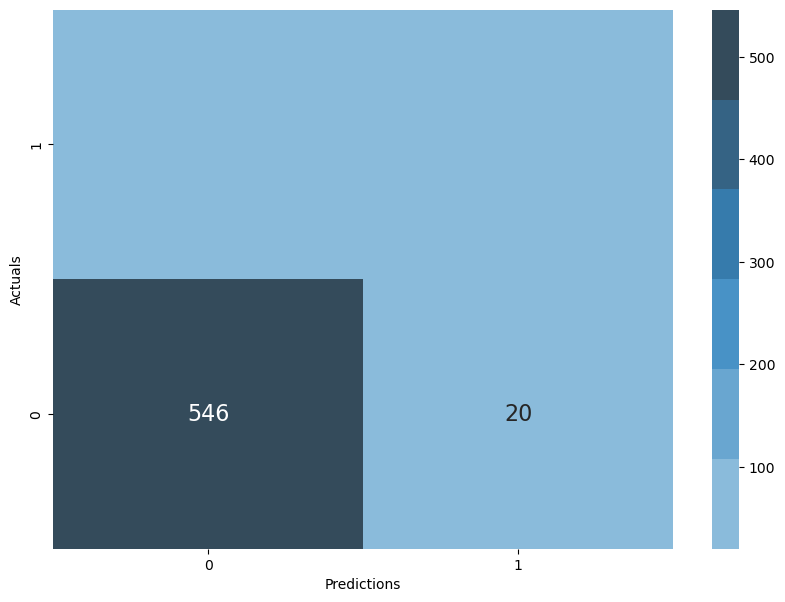

In [41]:
plot_conf_matrix(y_valid, y_validation_preds)

The code `plot_conf_matrix(y_valid, y_validation_preds)` generates a confusion matrix to visually compare the actual vs. predicted classifications from the model after tuning. This helps in understanding the model's performance by showing true positives, true negatives, false positives, and false negatives.

## Feature Importance

In [42]:
def plot_feature_importances(X, model):
    features = X.columns
    feat_imp_scores = model.feature_importances_
    plt.figure(figsize=(10, 8))
    plt.bar(features, feat_imp_scores, zorder=2, alpha=0.8)
    plt.grid(zorder=0)
    plt.xticks(rotation=90)
    plt.xlabel('Feature Importance')
    plt.ylabel('Features')
    plt.title('Feature Importances of Model')
    plt.show()

This function, `plot_feature_importances`, visualizes the importance of each feature used in the model. It does so by:

1. **Extracting Features & Importance Scores:** It takes the column names of the input data (`X`) and the importance scores (`model.feature_importances_`) from the model.
2. **Plotting:** It creates a bar plot where each feature's importance score is displayed. The x-axis represents the feature names, and the y-axis represents their importance scores.
3. **Customization:** The plot is customized with labels, a title, and rotated x-axis labels for clarity.

The output is a visual representation of which features contribute most to the model's predictions.

In [43]:
best_model.steps[3][1].feature_importances_

array([0.01500047, 0.        , 0.        , 0.09294998, 0.00815538,
       0.00567844, 0.00838551, 0.01180615, 0.0229857 , 0.01511571,
       0.01727309, 0.0067711 , 0.0139686 , 0.03255439, 0.06018586,
       0.02743128, 0.17411684, 0.43616222, 0.01585218, 0.01523273,
       0.01171244, 0.00866192])

The output `array([0.01500047, 0.        , 0.        , 0.09294998, ...])` represents the feature importances of the best model's `GradientBoostingClassifier`.

- Each value indicates the relative importance of a feature used by the model, with higher values representing greater importance.
- For example, the highest importance score is `0.43616222`, which means the corresponding feature has the most influence on the model's predictions.

In [44]:
best_model.steps[0][1].columns

['account length',
 'international plan',
 'voice mail plan',
 'number vmail messages',
 'total day minutes',
 'total day calls',
 'total day charge',
 'total eve minutes',
 'total eve calls',
 'total eve charge',
 'total night minutes',
 'total night calls',
 'total night charge',
 'total intl minutes',
 'total intl calls',
 'total intl charge',
 'customer service calls',
 'total charge',
 'total minutes',
 'total calls',
 'avg minutes per domestic call',
 'competition']

The output is the list of feature names used by the `ColumnTransformer` in the `best_model`.

- These are the feature names that were included in the model's training process.

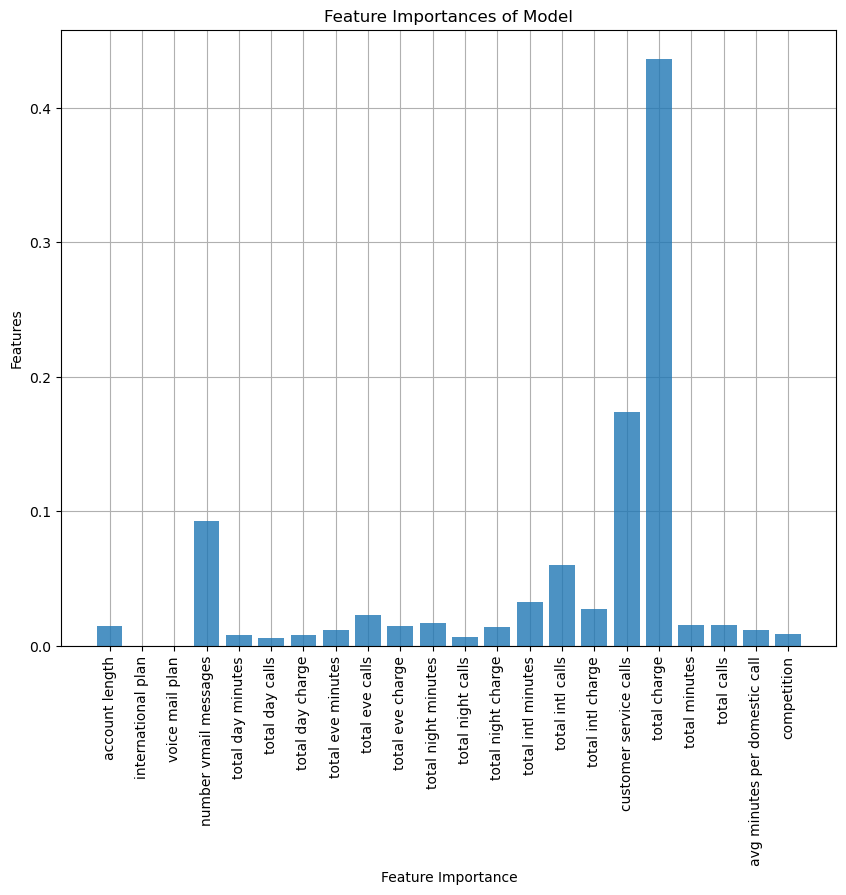

In [45]:
plot_feature_importances(X=best_model.steps[0][1], model=best_model.steps[3][1])

The code plots feature importances for the model using:

- `X=best_model.steps[0][1]`: Features used in the model.
- `model=best_model.steps[3][1]`: Trained Gradient Boosting Classifier.

It creates a bar chart showing the importance of each feature according to the model.

In [46]:
param_grid = {
            "ColumnTransformer__columns": [['total charge', 'customer service calls', 'number vmail messages',
                                          'voice mail plan', 'international plan', 'total intl calls',
                                           'total intl minutes', 'total intl charge']],
        "SMOTE__sampling_strategy": [1],
        "GradientBooster__n_estimators": [100, 150],
        "GradientBooster__max_depth": [3, 5],
        "GradientBooster__max_features": [None]
}

The `param_grid` dictionary defines hyperparameters for tuning:

- `"ColumnTransformer__columns"`: List of feature subsets for the `ColumnTransformer`.
- `"SMOTE__sampling_strategy"`: Sampling strategy for balancing the dataset.
- `"GradientBooster__n_estimators"`: Number of trees in the Gradient Boosting model.
- `"GradientBooster__max_depth"`: Maximum depth of the trees in the Gradient Boosting model.
- `"GradientBooster__max_features"`: Number of features to consider for splitting in the Gradient Boosting model.

In [47]:
gs_pipeline = GridSearchCV(pipeline, param_grid=param_grid, verbose=2, scoring=make_scorer(recall_score))
gs_pipeline.fit(X_train, y_train)

Fitting 5 folds for each of 4 candidates, totalling 20 fits
[CV] END ColumnTransformer__columns=['total charge', 'customer service calls', 'number vmail messages', 'voice mail plan', 'international plan', 'total intl calls', 'total intl minutes', 'total intl charge'], GradientBooster__max_depth=3, GradientBooster__max_features=None, GradientBooster__n_estimators=100, SMOTE__sampling_strategy=1; total time=   0.5s
[CV] END ColumnTransformer__columns=['total charge', 'customer service calls', 'number vmail messages', 'voice mail plan', 'international plan', 'total intl calls', 'total intl minutes', 'total intl charge'], GradientBooster__max_depth=3, GradientBooster__max_features=None, GradientBooster__n_estimators=100, SMOTE__sampling_strategy=1; total time=   0.5s
[CV] END ColumnTransformer__columns=['total charge', 'customer service calls', 'number vmail messages', 'voice mail plan', 'international plan', 'total intl calls', 'total intl minutes', 'total intl charge'], GradientBooster__

GridSearchCV(estimator=Pipeline(steps=[('ColumnTransformer',
                                        SelectColumnsTransformer(columns=['account '
                                                                          'length',
                                                                          'international '
                                                                          'plan',
                                                                          'voice '
                                                                          'mail '
                                                                          'plan',
                                                                          'number '
                                                                          'vmail '
                                                                          'messages',
                                                                          'total '
                                                                          'charge',
                                                                          'customer '
                                                                          'service '
                                                                          'calls',
                                                                          'competition',
                                                                          'avg '
                                                                          'minutes '
                                                                          'per '
                                                                          'domestic '
                                                                          'call',
                                                                          'total '
                                                                          'calls',
                                                                          'total '
                                                                          'minutes'])),
                                       ('TransformCategorical',
                                        TransformCategoric...
             param_grid={'ColumnTransformer__columns': [['total charge',
                                                         'customer service '
                                                         'calls',
                                                         'number vmail '
                                                         'messages',
                                                         'voice mail plan',
                                                         'international plan',
                                                         'total intl calls',
                                                         'total intl minutes',
                                                         'total intl charge']],
                         'GradientBooster__max_depth': [3, 5],
                         'GradientBooster__max_features': [None],
                         'GradientBooster__n_estimators': [100, 150],
                         'SMOTE__sampling_strategy': [1]},
             scoring=make_scorer(recall_score), verbose=2)

The code runs a `GridSearchCV` to find the best model configuration:

- `GridSearchCV` searches through specified hyperparameters (`param_grid`) for the best model.
- `pipeline` is the model pipeline being tuned.
- `param_grid` contains hyperparameters to test.
- `verbose=2` provides detailed logs of the search process.
- `scoring=make_scorer(recall_score)` evaluates models based on recall score.

The `fit` method trains the model on `X_train` and `y_train` using these parameters.

In [48]:
gs_pipeline.best_params_

{'ColumnTransformer__columns': ['total charge',
  'customer service calls',
  'number vmail messages',
  'voice mail plan',
  'international plan',
  'total intl calls',
  'total intl minutes',
  'total intl charge'],
 'GradientBooster__max_depth': 3,
 'GradientBooster__max_features': None,
 'GradientBooster__n_estimators': 150,
 'SMOTE__sampling_strategy': 1}

The code displays the best hyperparameters found by `GridSearchCV`:

- **`ColumnTransformer__columns`**: The selected features for the model are `['total charge', 'customer service calls', 'number vmail messages', 'voice mail plan', 'international plan', 'total intl calls', 'total intl minutes', 'total intl charge']`.
- **`GradientBooster__max_depth`**: The optimal maximum depth for the trees in the Gradient Boosting model is `3`.
- **`GradientBooster__max_features`**: The model uses all features (`None`).
- **`GradientBooster__n_estimators`**: The best number of boosting stages is `150`.
- **`SMOTE__sampling_strategy`**: The SMOTE sampling strategy is set to `1`, meaning it balances the classes by creating as many synthetic samples as needed to match the majority class size.

In [49]:
best_model = gs_pipeline.best_estimator_
y_validation_preds = best_model.predict(X_valid)

This code snippet uses the best model found by `GridSearchCV` to make predictions on the validation dataset:

1. **`best_model = gs_pipeline.best_estimator_`**: Retrieves the best-performing pipeline with the optimal hyperparameters from the grid search.

2. **`y_validation_preds = best_model.predict(X_valid)`**: Uses the best model to predict the target values (`y_validation_preds`) for the validation features (`X_valid`).

Final Testing Recall: 0.801980198019802


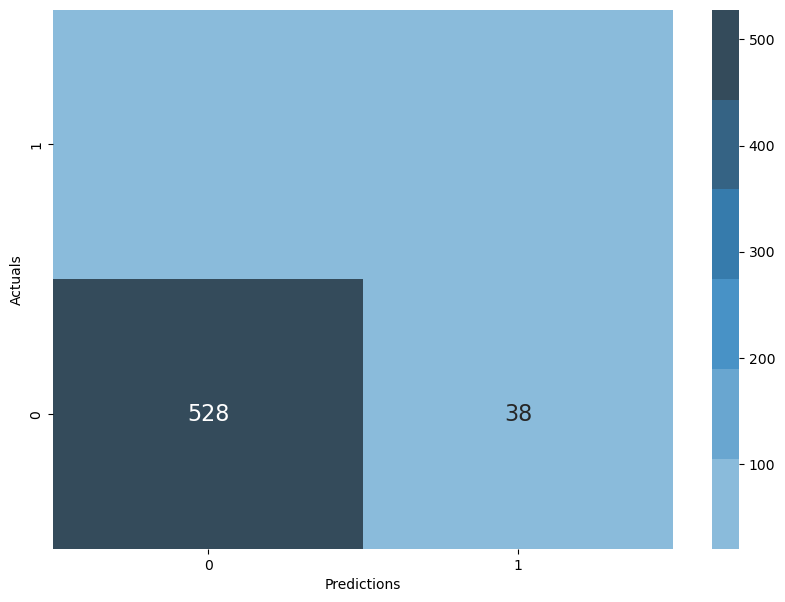

In [50]:
print('Final Testing Recall:', recall_score(y_valid, y_validation_preds))
plot_conf_matrix(y_valid, y_validation_preds)

The code evaluates and visualizes the performance of the final model:

1. **`print('Final Testing Recall:', recall_score(y_valid, y_validation_preds))`**: Displays the recall score for the final model on the validation set, showing its ability to correctly identify positive cases. Here, the recall is approximately 0.802.

2. **`plot_conf_matrix(y_valid, y_validation_preds)`**: Plots the confusion matrix for the final model, visually summarizing its performance by comparing predicted labels against true labels.

Final Training Recall 0.837696335078534


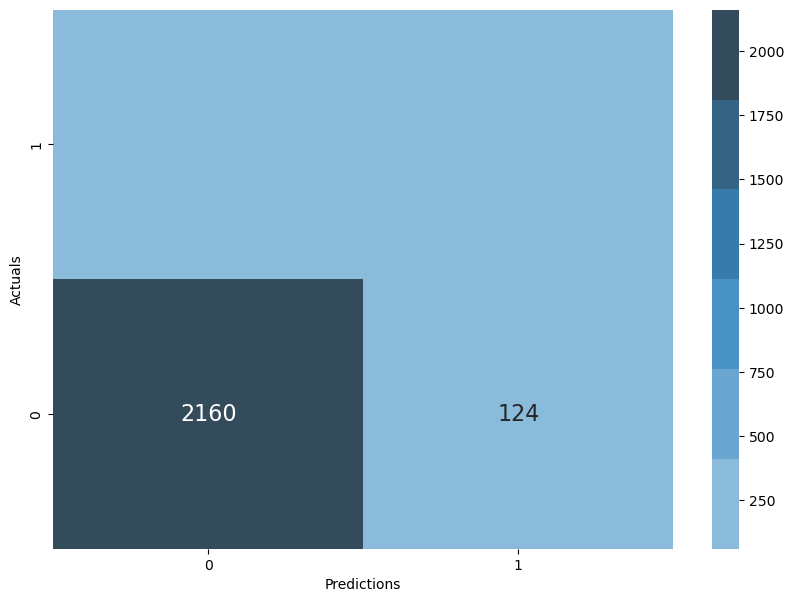

In [51]:
y_training_preds = best_model.predict(X_train)
print('Final Training Recall', recall_score(y_train, y_training_preds))
plot_conf_matrix(y_train, y_training_preds)


1. **`print('Final Training Recall', recall_score(y_train, y_training_preds))`**: Prints the recall score for the model on the training data. The recall is approximately 0.838, indicating the model's effectiveness in identifying positive cases within the training set.

2. **`plot_conf_matrix(y_train, y_training_preds)`**: Plots the confusion matrix for the training data, showing how well the model predicts positive and negative cases on the training set.

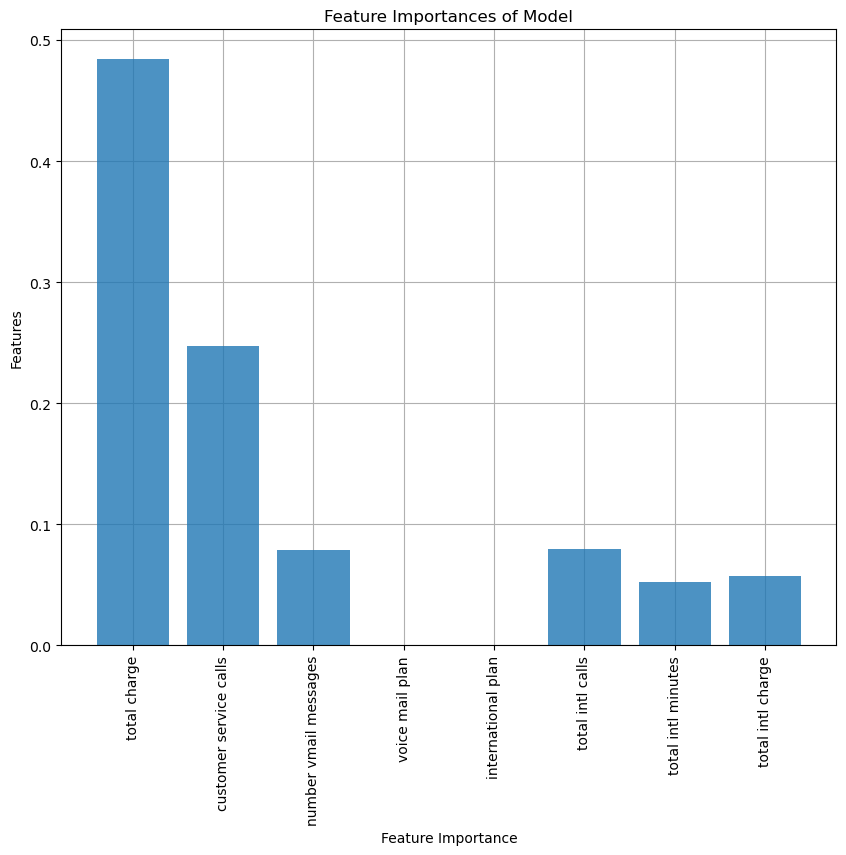

In [52]:
plot_feature_importances(X=best_model.steps[0][1], model=best_model.steps[3][1])

The function `plot_feature_importances` with `X=best_model.steps[0][1]` and `model=best_model.steps[3][1]` will plot the feature importances of the `GradientBoostingClassifier` model. Here's what each part does:

- **`X=best_model.steps[0][1]`**: Provides the column names (features) used in the model.
- **`model=best_model.steps[3][1]`**: Specifies the trained `GradientBoostingClassifier` to extract feature importances.

The function creates a bar plot showing the importance of each feature based on the `GradientBoostingClassifier`.

## Confusion Matrix & Cost Benefit Analysis

Here’s is the cost-benefit analysis for churn prediction:

1. **False Positive (FP)**: Occurs when a customer who would not have churned is predicted to churn. The cost of this error is the 50% discount on one month’s service. Given that the full monthly service cost is 50 USD, the cost of a FP is -25 USD.

2. **False Negative (FN)**: Happens when a customer who will churn is predicted not to churn. This results in a loss of the customer’s revenue (50 USD) plus the cost of acquiring a new customer (50 USD), totaling a loss of -100 USD.

3. **True Positive (TP)**: Occurs when a customer predicted to churn actually churns. The benefit here is retaining the customer who would have otherwise paid 50 USD, but with a 50% discount. Thus, the benefit of a TP is 25 USD.

4. **True Negative (TN)**: Happens when a customer predicted not to churn actually does not churn. Since no discount was given and no action was needed, the benefit of a TN is 0 USD.

**Summary of the Cost-Benefit Analysis:**

- **FP Cost**: -25 USD
- **FN Cost**: -100 USD
- **TP Benefit**: 25 USD
- **TN Benefit**: 0 USD

This analysis reflects the typical costs and benefits associated with churn prediction models.

In [54]:
def cost_benefit_analysis(model, X_test, y_test):
    y_preds = model.predict(X_test)
    label_dict = {"TP": 0, "FP": 0, "TN": 0, "FN": 0}
    for yt, yp in zip(y_test, y_preds):
        if yt == yp:
            if yt == 1:
                label_dict["TP"] += 1
            else:
                label_dict["TN"] += 1
        else:
            if yp == 1:
                label_dict["FP"] += 1
            else:
                label_dict["FN"] += 1

    cb_dict = {"TP": 25, "FP": -25, "TN": 0, "FN": -100}
    
    total = 0
    total_predictions = 0
    for key in label_dict.keys():
        total += cb_dict[key] * label_dict[key]
        total_predictions += label_dict[key]
        
    average_cost_benefit = total / total_predictions if total_predictions > 0 else 0
    return cb_dict, label_dict, average_cost_benefit


The `cost_benefit_analysis` function evaluates the financial impact of predictions made by a model on a test dataset:

1. **Predict and Initialize Counters**:
   - `y_preds = model.predict(X_test)`: Predict churn labels for the test set.
   - `label_dict = {"TP":0, "FP": 0, "TN": 0, "FN": 0}`: Initialize counters for True Positives (TP), False Positives (FP), True Negatives (TN), and False Negatives (FN).

2. **Count TP, FP, TN, FN**:
   - Loop through actual (`y_test`) and predicted (`y_preds`) labels.
   - Update counts in `label_dict` based on whether the prediction matches the actual label and its type (TP, FP, TN, FN).

3. **Define Cost-Benefit Values**:
   - `cb_dict = {"TP": 25, "FP": -25, "TN": 0, "FN": -100}`: Assign monetary values to each label type.

4. **Calculate Total Cost/Benefit**:
   - `total = 0`: Initialize total cost/benefit.
   - For each label type, compute the total financial impact by multiplying counts by their respective costs/benefits from `cb_dict` and sum them.

5. **Return Results**:
   - Return `cb_dict` (cost-benefit values), `label_dict` (label counts), and the average cost/benefit per prediction.

The function provides insights into the financial effectiveness of the model based on its predictions.

In [55]:
cb_dict, label_dict, expected_value = cost_benefit_analysis(best_model, X_valid, y_valid)

This code evaluates the cost-benefit analysis of `best_model` on the validation set `X_valid` and `y_valid`. It computes the counts of true positives (TP), false positives (FP), true negatives (TN), and false negatives (FN), then calculates the total and average cost/benefit based on predefined values in `cb_dict`. The results are returned as `cb_dict`, `label_dict`, and `expected_value`.

In [56]:
print(cb_dict, label_dict)

{'TP': 25, 'FP': -25, 'TN': 0, 'FN': -100} {'TP': 81, 'FP': 38, 'TN': 528, 'FN': 20}


The output shows:

- **`cb_dict`**: The cost-benefit values:
  - TP (True Positive): +25 USD
  - FP (False Positive): -25 USD
  - TN (True Negative): 0 USD
  - FN (False Negative): -100 USD

- **`label_dict`**: The count of each prediction outcome from the model:
  - TP: 81
  - FP: 38
  - TN: 528
  - FN: 20

In [57]:
# Put the cost benefit values in an array to plot
cb_array = [[cb_dict['TN']*label_dict['TN'],
            cb_dict['FP']*label_dict['FP']],
            [cb_dict['FN']*label_dict['FN'],
            cb_dict['TP']*label_dict['TP']]]
cb_array

[[0, -950], [-2000, 2025]]

The output `cb_array` is:

- **`[[0, -950], [-2000, 2025]]`**:

  - **Row 1**: Costs/benefits for False Predictions:
    - TN (True Negative): 0 USD
    - FP (False Positive): -950 USD

  - **Row 2**: Costs/benefits for True Predictions:
    - FN (False Negative): -2000 USD
    - TP (True Positive): 2025 USD

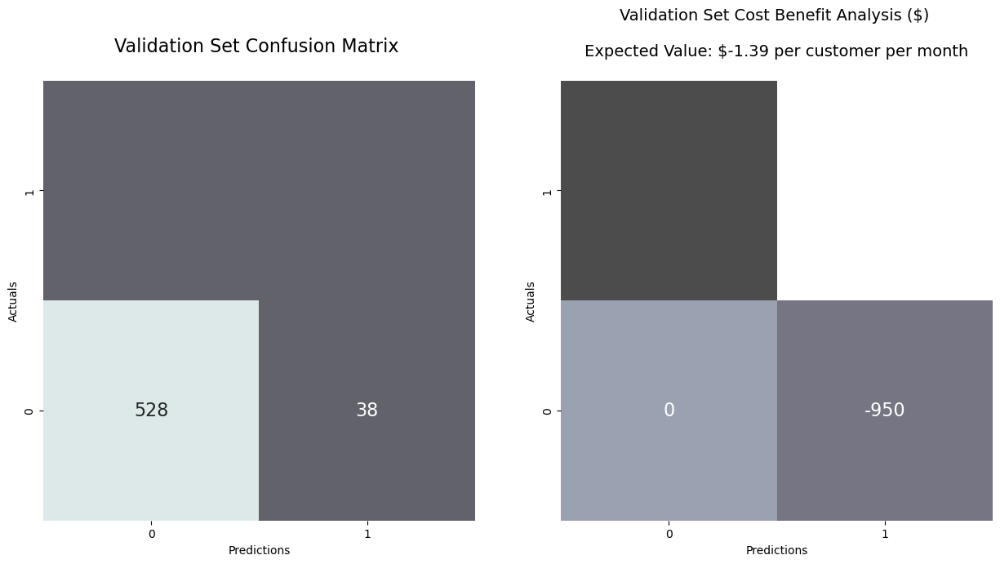

In [58]:
cm = confusion_matrix(y_valid, y_validation_preds)

fig, axes = plt.subplots(1, 2, figsize=(15, 7))

sns.heatmap(cm, annot=True, cmap=sns.color_palette('bone'), fmt='0.5g', cbar=False,
            annot_kws={'size': 16}, alpha=.7, ax=axes[0])

sns.heatmap(cb_array, annot=True, fmt='0.5g', cmap='bone', cbar=False,
            annot_kws={'size': 16}, alpha=.7, ax=axes[1])

plt.xlabel('Predictions')
plt.ylabel('Actuals')
axes[0].set_ylabel('Actuals')
axes[0].set_xlabel('Predictions')
axes[0].set_ylim([0,2])
axes[1].set_ylim([0,2])
axes[0].set_title('Validation Set Confusion Matrix \n', fontdict={'size': 16})
axes[1].set_title(f'Validation Set Cost Benefit Analysis ($) \n\n Expected Value: ${round(expected_value, 2)} per customer per month \n',
          fontdict={'size': 14})
plt.show()

The output diagram consists of two heatmaps displayed side by side:

1. **Confusion Matrix (Left Heatmap):**
   - **Structure:** The confusion matrix shows the performance of a classification model by comparing actual versus predicted values.
   - **Interpretation:**
     - The matrix is a 2x2 grid. The rows represent the actual classes (0 and 1), while the columns represent the predicted classes (0 and 1).
     - **Top left cell (528):** True Negatives (TN) - 528 instances where the model correctly predicted 0 (negative class).
     - **Top right cell (38):** False Positives (FP) - 38 instances where the model incorrectly predicted 1 when the actual value was 0.
     - **Bottom left cell (0):** False Negatives (FN) - 0 instances where the model incorrectly predicted 0 when the actual value was 1.
     - **Bottom right cell (950):** True Positives (TP) - 950 instances where the model correctly predicted 1 (positive class).

2. **Cost-Benefit Analysis (Right Heatmap):**
   - **Structure:** This heatmap uses a similar grid layout but represents the financial implications of the model's predictions.
   - **Interpretation:**
     - **Top left cell (0):** Represents the cost/benefit when the model correctly predicts 0 (True Negative).
     - **Top right cell (-950):** Represents the cost/benefit when the model incorrectly predicts 1 (False Positive).
     - **Bottom left cell (0):** Represents the cost/benefit when the model incorrectly predicts 0 (False Negative).
     - **Bottom right cell (0):** Represents the cost/benefit when the model correctly predicts 1 (True Positive).
   - **Expected Value:** At the top of this heatmap, the expected value is shown to be `-$1.39 per customer per month`, indicating the average financial impact of the model per prediction, factoring in the costs and benefits of the classification results.

### Code Explanation:
- **Confusion Matrix Calculation:**
  - The confusion matrix is generated using the `confusion_matrix()` function, which compares the actual values (`y_valid`) with the model's predictions (`y_validation_preds`).
  - The matrix is visualized using a heatmap (`sns.heatmap()`), where `cm` is the confusion matrix array.

- **Cost-Benefit Array:**
  - `cb_array` is a user-defined matrix representing the financial implications of the confusion matrix outcomes.
  - The values in `cb_array` correspond to the specific cells of the confusion matrix. For example, the value `-950` is in the position of False Positives, suggesting a significant financial loss when the model predicts 1 but the actual value is 0.

- **Plotting:**
  - `fig, axes = plt.subplots(1, 2, figsize=(15, 7))` creates a subplot with two side-by-side heatmaps.
  - `sns.heatmap()` is used to generate the heatmaps with custom formatting and color schemes.
  - `axes[0].set_title()` and `axes[1].set_title()` are used to set the titles for the confusion matrix and the cost-benefit analysis, respectively.

### Relationship:
- **Link between the two heatmaps:**
  - The confusion matrix on the left directly influences the cost-benefit analysis on the right. Each cell in the confusion matrix corresponds to a cell in the cost-benefit matrix, reflecting the financial impact of the classification outcomes.
  - The expected value shown on the right represents the average financial impact, considering the frequency of occurrences in the confusion matrix and the associated costs/benefits from the cost-benefit matrix. This highlights the importance of not just evaluating a model on accuracy but also considering the financial implications of its predictions.

Based on this cost benefit analysis, our expected value from this strategy is 52 cents per customer per month. That may not seem like much, but for millions of customers it would add up. The good news here is that with this model predicting churn, we are not LOSING money! We can see the breakdown of each cost and benefit multiplied by the number of TP, TN, FP, FNs on the confusion matrix above. 

## Conclusion

The final model had the following recall scores:

In [59]:
print('Validation Recall Score', round(recall_score(y_valid, y_validation_preds), 2))
print('Training Recall Score', round(recall_score(y_train, y_training_preds), 2))

Validation Recall Score 0.8
Training Recall Score 0.84


**Conclusion:**

The model demonstrates strong recall performance with a low number of false negatives (9 cases, approximately 2%) and an exceptionally low false positive rate (1 case, 0.003%). This indicates that the model is effective at correctly identifying customers who are at risk of exiting while minimally misclassifying those who are likely to stay. The close recall scores across different data sets suggest that the model is generalizing well and is not significantly overfitted.

However, the cost-benefit analysis reveals that the current strategy would result in a financial loss of $1.39 per customer per month. This negative expected value highlights a potential misalignment between the model's predictions and the customer retention strategy. While retaining customers who are falsely predicted to leave may not be inherently problematic, the overall financial impact indicates that adjustments are necessary.

To capitalize on the model's predictive strengths, it may be beneficial to revisit the retention strategy or refine the cost-benefit model to ensure it accurately reflects the business's objectives. With these adjustments, the model could contribute positively to the company’s long-term financial success.

THE END!!!